In [2]:
COLORLEFT = '#31A2AC'
COLORRIGHT = '#FF8D3F'

from statsmodels.graphics.tsaplots import plot_acf
from scipy import stats
from matplotlib import gridspec
import random 
from scipy.ndimage.filters import gaussian_filter
import statsmodels.formula.api as smf
from time import process_time
import statsmodels.api as sm
from sklearn.model_selection import StratifiedKFold
from sklearn.datasets import load_digits
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

#### Necesitas estas librerías!
### Elephant --> https://elephant.readthedocs.io/en/latest/tutorials/statistics.html
### neo --> https://neo.readthedocs.io/en/stable/install.html
from sklearn.model_selection import StratifiedKFold, KFold
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
import numpy as np
from sklearn.datasets import load_digits
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn import metrics
import json

from scipy import stats
from matplotlib import gridspec
import random 
from time import process_time
import statsmodels.api as sm

import os 
import pandas as pd
import scipy.io
import seaborn as sns
sns.set_context('talk')
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=RuntimeWarning)
# warnings.simplefilter(action='ignore', category=PerformanceWarning)
warnings. filterwarnings('ignore', category=UserWarning)
warnings.simplefilter(action="ignore", category=pd.errors.PerformanceWarning)
pd.options.mode.chained_assignment = None  # default='warn'

from neo.core import SpikeTrain
from quantities import ms, s, Hz
from elephant.statistics import mean_firing_rate
from elephant.statistics import time_histogram, instantaneous_rate
from elephant.kernels import GaussianKernel
from elephant.statistics import mean_firing_rate

import os 
import numpy as np
import pandas as pd
import scipy.io
import seaborn as sns
sns.set_context('talk')
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

from pylab import *
import scipy.io as sio
import warnings
warnings. filterwarnings('ignore', category=UserWarning)

In [3]:
sns.set_context('talk')

#### **RL threshold**

In [ ]:
save_path = 'C:/Users/Tiffany/Google Drive/WORKING_MEMORY/PAPER/Figures/'
os.chdir(save_path)

y_upper = 0
y_lower = 0

df_cumulative_res = pd.DataFrame()
df_cumulative_sti = pd.DataFrame()

fig, ([ax1,ax2])  = plt.subplots(1,2, figsize=(14, 6), sharey=True)

file_name = 'RLroll_thresholding_equal_size_splitting'
df_cum_res = pd.read_csv(file_name+'_res.csv', index_col=0)
df_cum_sti =  pd.read_csv(file_name+'_sti.csv', index_col=0)

colors=['grey','lightgrey','pink', 'violet','purple','indigo']
variables = ['RL_roll','RL_roll','RL_roll','RL_roll','RL_roll','RL_roll']

ratios = [0.1,0.2,0.3,0.4,0.5,0.6]
variables_combined=[variables[0]+'_'+str(ratios[0]),variables[1]+'_'+str(ratios[1]),variables[2]+'_'+str(ratios[2]),
                    variables[3]+'_'+str(ratios[3]),variables[4]+'_'+str(ratios[4]),variables[5]+'_'+str(ratios[5])]
# variables_combined=[variables[0]+'_'+str(ratios[0]),variables[1]+'_'+str(ratios[1]),variables[2]+'_'+str(ratios[2]),
#                     variables[3]+'_'+str(ratios[3]),variables[4]+'_'+str(ratios[4])]
# score='score'

for color, variable,left,right in zip(colors,variables_combined,[ax1,ax1,ax1,ax1,ax1,ax1],[ax2,ax2,ax2,ax2,ax2,ax2]):
    print(variable)
        
    # Aligmnent for Stimulus cue
    real = np.array(np.mean(df_cum_sti.loc[(df_cum_sti['trial_type'] ==variable)].groupby('session').mean()))
    times = np.array(df_cum_sti.columns[:-2]).astype(float)
    
    if color=='crimson':
        left.set_xlabel('Time (s) to Cue')
    sns.despine()

    df_lower = pd.DataFrame()
    df_upper = pd.DataFrame()

    for timepoint in df_cum_sti.columns[:-2]:
        mean_surr = []

        # recover the values for that specific timepoint
        array = df_cum_sti.loc[(df_cum_sti.trial_type ==variable)].groupby('session')[timepoint].mean().to_numpy()

        # iterate several times with resampling: chose X time among the same list of values
        for iteration in range(1000):
            x = np.random.choice(array, size=len(array), replace=True)
            # recover the mean of that new distribution
            mean_surr.append(np.mean(x))
            
        df_lower.at[0,timepoint] = np.percentile(mean_surr, 0.5)
        df_upper.at[0,timepoint] = np.percentile(mean_surr, 99.5)
    
    lower =  df_lower.iloc[0].values
    upper =  df_upper.iloc[0].values
    x=times

    left.plot(times,real, color=color)
    left.plot(x, lower, color=color, linestyle = '',alpha=0.6)
    left.plot(x, upper, color=color, linestyle = '',alpha=0.6)
    left.fill_between(x, lower, upper, alpha=0.2, color=color)
    if max(upper)>y_upper:
        y_upper = max(upper)
    if  min(lower)<y_lower:
        y_lower = min(lower)
    # left.set_ylim(y_lower,y_upper)
    left.set_ylim(0.4,0.8)

    left.axhline(y=0.5,linestyle=':',color='black')
    left.fill_betweenx(np.arange(-1,1.15,0.1), 0,0.45, color='grey', alpha=.4)
    sns.despine()

    # -------------------- For Aligment to Go cue
        
    real =  np.array(np.mean(df_cum_res.loc[(df_cum_res['trial_type'] ==variable)].groupby('session').mean()))
#     times = np.array(df_cum_res.loc[:, df_cum_res.columns != 'trial_type'].columns).astype(float)
    times = np.array(df_cum_res.columns[:-2]).astype(float)

    mean_surr = []
    df_lower = pd.DataFrame()
    df_upper = pd.DataFrame()

    for timepoint in df_cum_res.columns[:-2]:
        mean_surr = []

        # recover the values for that specific timepoint
        array = df_cum_res.loc[(df_cum_res.trial_type ==variable)].groupby('session')[timepoint].mean().to_numpy()

        # iterate several times with resampling: chose X time among the same list of values
        for iteration in range(1000):
            x = np.random.choice(array, size=len(array), replace=True)
            # recover the mean of that new distribution
            mean_surr.append(np.mean(x))

        df_lower.at[0,timepoint] = np.percentile(mean_surr, 0.5)
        df_upper.at[0,timepoint] = np.percentile(mean_surr, 99.5)
    
    lower =  df_lower.iloc[0].values
    upper =  df_upper.iloc[0].values
    x=times

    # ax2.plot(x, y_mean, color=color)
        
    right.plot(times,real, color=color, label=variable)
    right.plot(x, lower, color=color, linestyle = '',alpha=0.6)
    right.plot(x, upper, color=color, linestyle = '',alpha=0.6)
    right.fill_between(x, lower, upper, alpha=0.2, color=color)
    
    if max(upper)>y_upper:
        y_upper = max(upper)
    if  min(lower)<y_lower:
        y_lower = min(lower)
    right.set_ylim(0.4,0.8)
    
    right.axhline(y=0.5,linestyle=':',color='black')
    right.fill_betweenx(np.arange(-1.1,1.1,0.1), 0,0.2, color='beige', alpha=.8)
    if color=='crimson':
        right.set_xlabel('Time (s) to Go')
        
    df_cumulative_sti = pd.concat([df_cumulative_sti,df_cum_sti])
    df_cumulative_res = pd.concat([df_cumulative_res,df_cum_res])
    plt.legend()
    
save_path = 'C:/Users/Tiffany/Google Drive/WORKING_MEMORY/PAPER/Figures/'
os.chdir(save_path)
file_name = 'WM_roll_1_3and10s_L2_lbfgs'
df_cum_res = pd.read_csv(file_name+'_res.csv', index_col=0)
df_cum_sti =  pd.read_csv(file_name+'_sti.csv', index_col=0)

# colors=['crimson','indigo','purple']
colors=['black']
# variables=['WM_roll_0','RL_roll_1','RL_roll_0']
variables=['WM_roll_1']
# score='score'
# (df_cum_res['score_type'] ==score)
for color, variable,left,right in zip(colors,variables,[ax1,ax1,ax1],[ax2,ax2,ax2]):
    print(variable)
        
    # Aligmnent for Stimulus cue
    real = np.array(np.mean(df_cum_sti.loc[(df_cum_sti['trial_type'] ==variable)].groupby('session').mean()))
    times = np.array(df_cum_sti.columns[:-3]).astype(float)
    
    if color=='crimson':
        left.set_xlabel('Time (s) to Cue')
    sns.despine()

    df_lower = pd.DataFrame()
    df_upper = pd.DataFrame()

    for timepoint in df_cum_sti.columns[:-3]:
        mean_surr = []

        # recover the values for that specific timepoint
        array = df_cum_sti.loc[(df_cum_sti.trial_type ==variable)].groupby('session')[timepoint].mean().to_numpy()

        # iterate several times with resampling: chose X time among the same list of values
        for iteration in range(1000):
            x = np.random.choice(array, size=len(array), replace=True)
            # recover the mean of that new distribution
            mean_surr.append(np.mean(x))
            
        df_lower.at[0,timepoint] = np.percentile(mean_surr, 0.5)
        df_upper.at[0,timepoint] = np.percentile(mean_surr, 99.5)
    
    lower =  df_lower.iloc[0].values
    upper =  df_upper.iloc[0].values
    x=times

    left.plot(times,real, color=color, label=variable)
    left.plot(x, lower, color=color, linestyle = '',alpha=0.6)
    left.plot(x, upper, color=color, linestyle = '',alpha=0.6)
    left.fill_between(x, lower, upper, alpha=0.2, color=color)
    if max(upper)>y_upper:
        y_upper = max(upper)
    if  min(lower)<y_lower:
        y_lower = min(lower)
    # left.set_ylim(y_lower,y_upper)
    left.set_ylim(0.4,0.8)

    left.axhline(y=0.5,linestyle=':',color='black')
    left.fill_betweenx(np.arange(-1,1.15,0.1), 0,0.45, color='grey', alpha=.4)
    left.set_xlabel('Time to Cue (s)')
    sns.despine()

    # -------------------- For Aligment to Go cue
        
    real =  np.array(np.mean(df_cum_res.loc[(df_cum_res['trial_type'] ==variable)].groupby('session').mean()))
#     times = np.array(df_cum_res.loc[:, df_cum_res.columns != 'trial_type'].columns).astype(float)
    times = np.array(df_cum_res.columns[:-3]).astype(float)

    mean_surr = []
    df_lower = pd.DataFrame()
    df_upper = pd.DataFrame()

    for timepoint in df_cum_res.columns[:-3]:
        mean_surr = []

        # recover the values for that specific timepoint
        array = df_cum_res.loc[(df_cum_res.trial_type ==variable)].groupby('session')[timepoint].mean().to_numpy()

        # iterate several times with resampling: chose X time among the same list of values
        for iteration in range(1000):
            x = np.random.choice(array, size=len(array), replace=True)
            # recover the mean of that new distribution
            mean_surr.append(np.mean(x))

        df_lower.at[0,timepoint] = np.percentile(mean_surr, 0.5)
        df_upper.at[0,timepoint] = np.percentile(mean_surr, 99.5)
    
    lower =  df_lower.iloc[0].values
    upper =  df_upper.iloc[0].values
    x=times

    # ax2.plot(x, y_mean, color=color)
        
    right.plot(times,real, color=color, label='RL_roll_0.0')
    right.plot(x, lower, color=color, linestyle = '',alpha=0.6)
    right.plot(x, upper, color=color, linestyle = '',alpha=0.6)
    right.fill_between(x, lower, upper, alpha=0.2, color=color)
    
    if max(upper)>y_upper:
        y_upper = max(upper)
    if  min(lower)<y_lower:
        y_lower = min(lower)
    right.set_ylim(0.4,0.8)
    
    right.axhline(y=0.5,linestyle=':',color='black')
    right.fill_betweenx(np.arange(-1.1,1.1,0.1), 0,0.2, color='beige', alpha=.8)

    sns.despine()
    right.set_xlabel('Time to Go (s)')

    df_cum_sti['trial_type'] = 'RL_roll_0.0'
    df_cum_res['trial_type'] = 'RL_roll_0.0'

    df_cumulative_sti = pd.concat([df_cumulative_sti,df_cum_sti])
    df_cumulative_res = pd.concat([df_cumulative_res,df_cum_res])

save_path = 'C:/Users/Tiffany/Google Drive/WORKING_MEMORY/PAPER/Figures/'
os.chdir(save_path)
file_name = 'WM_roll_1_3and10s_L2'
df_cum_res = pd.read_csv(file_name+'_res.csv', index_col=0)
df_cum_sti =  pd.read_csv(file_name+'_sti.csv', index_col=0)

# colors=['crimson','indigo','purple']
colors=['darkgreen']
# variables=['WM_roll_0','RL_roll_1','RL_roll_0']
variables=['WM_roll_1']
# score='score'
# (df_cum_res['score_type'] ==score)
for color, variable,left,right in zip(colors,variables,[ax1,ax1,ax1],[ax2,ax2,ax2]):
    print(variable)
        
    # Aligmnent for Stimulus cue
    real = np.array(np.mean(df_cum_sti.loc[(df_cum_sti['trial_type'] ==variable)].groupby('session').mean()))
    times = np.array(df_cum_sti.columns[:-3]).astype(float)
    
    if color=='crimson':
        left.set_xlabel('Time (s) to Cue')
    sns.despine()

    df_lower = pd.DataFrame()
    df_upper = pd.DataFrame()

    for timepoint in df_cum_sti.columns[:-3]:
        mean_surr = []

        # recover the values for that specific timepoint
        array = df_cum_sti.loc[(df_cum_sti.trial_type ==variable)].groupby('session')[timepoint].mean().to_numpy()

        # iterate several times with resampling: chose X time among the same list of values
        for iteration in range(1000):
            x = np.random.choice(array, size=len(array), replace=True)
            # recover the mean of that new distribution
            mean_surr.append(np.mean(x))
            
        df_lower.at[0,timepoint] = np.percentile(mean_surr, 0.5)
        df_upper.at[0,timepoint] = np.percentile(mean_surr, 99.5)
    
    lower =  df_lower.iloc[0].values
    upper =  df_upper.iloc[0].values
    x=times

    left.plot(times,real, color=color, label=variable)
    left.plot(x, lower, color=color, linestyle = '',alpha=0.6)
    left.plot(x, upper, color=color, linestyle = '',alpha=0.6)
    left.fill_between(x, lower, upper, alpha=0.2, color=color)
    if max(upper)>y_upper:
        y_upper = max(upper)
    if  min(lower)<y_lower:
        y_lower = min(lower)
    # left.set_ylim(y_lower,y_upper)
    left.set_ylim(0.4,0.8)

    left.axhline(y=0.5,linestyle=':',color='black')
    left.fill_betweenx(np.arange(-1,1.15,0.1), 0,0.45, color='grey', alpha=.4)
    left.set_xlabel('Time to Cue (s)')
    sns.despine()

    # -------------------- For Aligment to Go cue
        
    real =  np.array(np.mean(df_cum_res.loc[(df_cum_res['trial_type'] ==variable)].groupby('session').mean()))
#     times = np.array(df_cum_res.loc[:, df_cum_res.columns != 'trial_type'].columns).astype(float)
    times = np.array(df_cum_res.columns[:-3]).astype(float)

    mean_surr = []
    df_lower = pd.DataFrame()
    df_upper = pd.DataFrame()

    for timepoint in df_cum_res.columns[:-3]:
        mean_surr = []

        # recover the values for that specific timepoint
        array = df_cum_res.loc[(df_cum_res.trial_type ==variable)].groupby('session')[timepoint].mean().to_numpy()

        # iterate several times with resampling: chose X time among the same list of values
        for iteration in range(1000):
            x = np.random.choice(array, size=len(array), replace=True)
            # recover the mean of that new distribution
            mean_surr.append(np.mean(x))

        df_lower.at[0,timepoint] = np.percentile(mean_surr, 0.5)
        df_upper.at[0,timepoint] = np.percentile(mean_surr, 99.5)
    
    lower =  df_lower.iloc[0].values
    upper =  df_upper.iloc[0].values
    x=times

    # ax2.plot(x, y_mean, color=color)
        
    right.plot(times,real, color=color, label='WM_roll_0.7')
    right.plot(x, lower, color=color, linestyle = '',alpha=0.6)
    right.plot(x, upper, color=color, linestyle = '',alpha=0.6)
    right.fill_between(x, lower, upper, alpha=0.2, color=color)
    
    if max(upper)>y_upper:
        y_upper = max(upper)
    if  min(lower)<y_lower:
        y_lower = min(lower)
    right.set_ylim(0.4,0.8)
    
    right.axhline(y=0.5,linestyle=':',color='black')
    right.fill_betweenx(np.arange(-1.1,1.1,0.1), 0,0.2, color='beige', alpha=.8)

    sns.despine()
    right.set_xlabel('Time to Go (s)')
    
    # df_cum_sti['trial_type'] = 'WM_roll_0.7'
    # df_cum_res['trial_type'] = 'WM_roll_0.7'
    
    df_cumulative_sti = pd.concat([df_cumulative_sti,df_cum_sti])
    df_cumulative_res = pd.concat([df_cumulative_res,df_cum_res])
    
    # -------------------- Compute difference between curves
df_results = df_cumulative_res.groupby(['trial_type','session']).mean()
df_results.reset_index(inplace=True)

# variable_1='RL_roll_0.1'
# variable_2='RL_roll_0.5'
# print('Difference between ', variable_1, ' and ', variable_2)
# for epoch in df_results.columns[3:]:

#     pre =df_results.loc[df_results.trial_type == variable_1][[epoch,'session']]
#     pre.rename(columns={epoch:variable_1},inplace=True)

#     post= df_results.loc[df_results.trial_type == variable_2][[epoch,'session']]
#     post.rename(columns={epoch:variable_2},inplace=True)

#     new_df = pd.merge(pre,post, how="right", on=["session"])
#     new_df.dropna(inplace=True)

#     pre = new_df[variable_1]
#     post = new_df[variable_2]
#     # print('Epoch ', epoch, ' is: ', str(stats.ttest_rel(pre, post)[1]))
    
#     if stats.ttest_rel(pre, post)[1] <0.05:
#         right.scatter(x=float(epoch)-0.05,y=0.8, marker="s", color='black')
#         right.scatter(x=float(epoch)+0.05,y=0.8, marker="s", color='black')

# df_results = df_cumulative_sti.groupby(['trial_type','session']).mean()
# df_results.reset_index(inplace=True)

# for epoch in df_results.columns[2:]:

#     pre =df_results.loc[df_results.trial_type == variable_1][[epoch,'session']]
#     pre.rename(columns={epoch:variable_1},inplace=True)

#     post= df_results.loc[df_results.trial_type == variable_2][[epoch,'session']]
#     post.rename(columns={epoch:variable_2},inplace=True)

#     new_df = pd.merge(pre,post, how="right", on=["session"])
#     new_df.dropna(inplace=True)

#     pre = new_df[variable_1]
#     post = new_df[variable_2]
#     # print('Epoch ', epoch, ' is: ', str(stats.ttest_rel(pre, post)[1]))
    
#     if stats.ttest_rel(pre, post)[1] <0.05:
#         left.scatter(x=float(epoch)-0.05,y=0.8, marker="s", color='black')
#         left.scatter(x=float(epoch)+0.05,y=0.8, marker="s", color='black')

# plt.legend()
plt.tight_layout()
plt.savefig('RLthresholding_all.svg', dpi=300, bbox_inches='tight') 
plt.show()

In [ ]:
ax=sns.barplot(x='trial_type',y = '1.25', data = df_cumulative_sti,
            palette=['black','grey','lightgrey','pink', 'violet','purple','indigo'], 
            order=['RL_roll_0.0','RL_roll_0.1','RL_roll_0.2','RL_roll_0.3','RL_roll_0.4','RL_roll_0.5','RL_roll_0.6'])
x=[0,1,2,3,4,5,6]
labels=['0.0','0.1','0.2','0.3','0.4','0.5','0.6']
plt.xticks(x, labels, rotation ='vertical')
plt.ylabel('Accuracy')
plt.xlabel('RL probability')
plt.ylim(0.4,0.8)
plt.legend([],[], frameon=False)
# add_stat_annotation(ax, data=df_cumulative_sti, x='trial_type', y='1.25',
#                     box_pairs=[('RL_roll_0.1', "RL_roll_0.2"),('RL_roll_0.2', "RL_roll_0.3"),('RL_roll_0.4', "RL_roll_0.4"),('RL_roll_0.5', "RL_roll_0.6")],
#                     test='t-test_ind', text_format='star', loc='outside', verbose=2)
sns.despine()

In [ ]:
sns.barplot(x='trial_type',y = '-0.75', data = df_cumulative_res,
            palette=['black','grey','lightgrey','pink', 'violet','purple','indigo'], 
            order=['RL_roll_0.0','RL_roll_0.1','RL_roll_0.2','RL_roll_0.3','RL_roll_0.4','RL_roll_0.5','RL_roll_0.6'])
x=[0,1,2,3,4,5,6]
labels=['0.0','0.1','0.2','0.3','0.4','0.5','0.6']
plt.xticks(x, labels, rotation ='vertical')
plt.ylabel('Accuracy')
plt.xlabel('RL probability')
plt.ylim(0.4,0.8)
sns.despine()

In [ ]:
def interval_extraction_trial(df, cluster_list=[], variable = 'vector_answer', align = 'Delay_OFF', start = 0, stop = 1, delay_only=False):
    y = []
    d = {}
    
    if delay_only == False:
        # print('Skipping delays')
        if align == 'Delay_OFF' and start < 0:
            df = df.loc[(df.delay != 0.1) & (df.delay != 0.2)]
        if align == 'Delay_OFF' and start < -1:
            df = df.loc[(df.delay != 0.1) & (df.delay != 0.2) & (df.delay != 1)]

        if align == 'Stimulus_ON' and stop > 0.5:
            df = df.loc[(df.delay != 0.1) & (df.delay != 0.2)]

        if align == 'Stimulus_ON' and stop > 1.5:
            df = df.loc[(df.delay != 0.1) & (df.delay != 0.2) & (df.delay != 1)]
    
    # print('Recovered from: ', str(len(df.trial.unique())), ' trials')
    # Create new aligment to the end of the session
    df['a_'+align] = df.fixed_times-df[align]

    # cluster_list = df_all.cluster_id.unique()
    df = df.sort_values('trial')
    
    y = df.groupby('trial').mean()[variable]

    # Filter for the spikes that occur in the interval we are analyzing
    df = df.loc[(df['a_'+align]>start)&(df['a_'+align]<stop)]

    df_final = pd.DataFrame()
    df_final = df.groupby(['trial','cluster_id']).count()
    df_final.reset_index(inplace=True)
    df_final = df_final.pivot_table(index=['trial'], columns='cluster_id', values='fixed_times', fill_value=0).rename_axis(None, axis=1)
    df_final = df_final.reindex(cluster_list, axis=1,fill_value=0)

    result = pd.merge(df_final, y, how="right", on=["trial"]).fillna(0)
    result = result.rename(columns={variable: "y"})
    result['y'] = np.where(result['y'] == 0, -1, result['y']) 
    
    return result, result['y']

In [ ]:
def train(df, decode='vector_answer', align='Delay_OFF', start=-0.5, stop=0, cluster_list = [], ratio=0.65, test_index=[],  train_index=[], fakey=[], delay_only=False):

    df_final, y = interval_extraction_trial(df,variable = decode, align = align, start = start, stop = stop, cluster_list = cluster_list, delay_only=delay_only)
    
    # This is mainly for the session shuffles
    if len(fakey) > 1:
        print('Using shuffled session')
        y = fakey[len(fakey)-len(y):]
        df_final['y'] = y   
        
    train_cols = df_final.columns
    
    #Train the model   
    df_final.reset_index(inplace=True)
    df_final = df_final.drop(columns ='trial')
    
    if len(test_index) >= 1:
        print('Using splits')
        train = df_final.loc[train_index,:]
        test = df_final.loc[test_index,:]
        # print('Fold',str(fold_no),'Class Ratio:',sum(test['y'])/len(test['y']))
        x_test = test.iloc[:, test.columns != 'y']
        y_test = test['y']
        x_train = train.iloc[:, train.columns != 'y']
        y_train = train['y']
        
    else:
        x_train = df_final.iloc[:, df_final.columns != 'y']
        y_train = df_final['y']
        x_test = x_train
        y_test = y_train
        
    #Normalize the X data
    sc = RobustScaler()
    x_train = sc.fit_transform(x_train)
    x_test = sc.fit_transform(x_test)
    
    model = LogisticRegression(solver='liblinear', penalty = 'l1', C=0.98).fit(x_train, y_train)
    # model = LogisticRegression(solver='liblinear', penalty = 'l1', C=0.95, fit_intercept=True).fit(x_train, y_train)
    train_cols = df_final.columns
    
    p_pred = model.predict_proba(x_test)    
    y_pred = model.predict(x_test)    
    f1score= f1_score(y_test, y_pred, average='weighted')

    y_test = np.where(y_test == -1, 0, y_test) 
    y_new = y_test.reshape(len(y_test), 1).astype(int)
    # y_new = y_test.values.reshape(len(y_test), 1).astype(int)
    score_ =  np.take_along_axis(p_pred,y_new,axis=1)   

    # print('Trained model on ', len(train_cols), ' neurons.')
    print('score:', np.mean(score_), 'f1_score ', f1score)
    
    return model, train_cols, np.mean(score_)

In [ ]:
def test(df,epoch='Stimulus_ON',initrange=-0.4,endrange=1.5,r=0.2, model = None, train_cols=None, variable='ra_accuracy',
                      hit=1, nsurrogates = 100, decode='vector_answer', ratio=0, cluster_list = [], test_index=[], fakey=[], delay_only=False):
    '''
    Function that tests a previously trained function (func. train_decoder) on population activity of specific segments
    
    Attributes
        - df: DataFrame. it contains a whole ephys session without curation. 
        - WM and RL are the variables to consider a trial in the RL or in the WM-module. Both need to be floats. 
        - epoch: str. Moment at which the data will be aligned to. 
        - initrange: float. 
        - endrange: float.
        - r: float 
        - model. function. 
        - train_cols
        - name. String
        - variables. List. 
        - hits. List. 
        - colors. List
        - nsurrogates. Int. 
        - indexes. List 
        - decode. String
    
    Return
        - df_real
        - df_iter
        It will also make a plot. 
    '''
    
    df_real = pd.DataFrame()
    df_iter = pd.DataFrame()
        
    times = [] # Timestamps
    real_score = [] # real scoring of the decoded
    mean_sur=[] # mean of the surrogate data

    for start, stop in zip(np.arange(initrange,endrange-r,r/2),np.arange(initrange+r,endrange,r/2)):
        times.append((start+stop)/2)
        df_final, y = interval_extraction_trial(df,variable = decode, align = epoch, start = start, stop = stop, cluster_list=cluster_list, delay_only=delay_only)

        # Sometimes the testing and the trainind dataset have different neurons since they are looking at different trials and perhaps there were no spikes
        # coming from all neurons. We compare which columns are missing and add them containing 0 for the model to work. 
        test_cols = df_final.columns
        common_cols = train_cols.intersection(test_cols)
        train_not_test = train_cols.difference(test_cols)
        for col in train_not_test:
            df_final[col] = 0

        #The other way round. When training in segmented data, sometimes the training set is smaller than the testing (for instance, when training in Hb trials and testing in WM)
        test_not_train = test_cols.difference(train_cols)
        for col in test_not_train:
            df_final.drop(columns=[col],inplace=True)

        #Train the model"
        if len(test_index) >= 1:
            print('Train splitting trials')
            # Split data in training and testing
            # x_train, x_test, y_train, y_test =\
            #     train_test_split(df_final, y, test_size=test_sample,random_state=random_state)
            
            df_final.reset_index(inplace=True)
            df_final = df_final.drop(columns ='trial')
            test = df_final.loc[test_index,:]
            # print('Fold',str(fold_no),'Class Ratio:',sum(test['y'])/len(test['y']))
            x_test = test.iloc[:, test.columns != 'y']
            y_test = test['y']             

        else:
            x_train = df_final.iloc[:, df_final.columns != 'y']
            y_train = df_final['y']
            x_test = x_train
            y_test = y_train
        
        #Normalize the X data
        sc = RobustScaler()
        x_test = sc.fit_transform(x_test)

        p_pred = model.predict_proba(x_test)
        y_pred = model.predict(x_test)
        score_ = model.score(x_test, y_test)
        real_score.append(score_)

        # y_test = np.where(y_test == -1, 0, y_test) 
        # y_new = y_test.reshape(len(y_test), 1).astype(int)
        # corrected_score =  np.take_along_axis(p_pred,y_new,axis=1)   
        # real_score.append(np.mean(corrected_score))

        # print('score:', score_, 'corrected score: ', np.mean(corrected_score), end='\n\n')

        i=0
        while i <= nsurrogates:
            i+=1
            y_perr = shuffle(y_test)
            score_ = model.score(x_test, y_perr)

            # y_new = y_perr.reshape(len(y_perr), 1).astype(int)
            # result =  np.take_along_axis(p_pred,y_new,axis=1)     
            # score_  = np.mean(result)

            df_iter = df_iter.append({'iteration': i, 'score': score_, 'times': (start+stop)/2, 'epoch' : epoch, 'variable' : variable+'_'+str(hit)}, ignore_index = True)
        
    times.append('trial_type')
    real_score.append(variable+'_'+str(hit))
    a_series = pd.Series(real_score, index = times)
    df_real = df_real.append(a_series, ignore_index=True)
    
    return df_real, df_iter

In [ ]:
## Dataframe used for cumulative analysis
df_cum_sti = pd.DataFrame()
df_cum_shuffle = pd.DataFrame()

os.chdir('C:/Users/Tiffany/Documents/Ephys/summary_complete')
for filename in os.listdir(os.getcwd()):
# for filename in list_of_sessions:
    # 
    if filename[-3:] != 'pdf':
        df = pd.read_csv(filename, sep=',',index_col=0)
    else:
        continue
        
    print(filename, '/ Total session trials: ', len(df.trial.unique()), '/ Number of neurons: ', len(df.cluster_id.unique()))
    
    # df['WM_roll'] = compute_window_centered(df, 3,'WM')

####################################### ----------------- Add 2 more seconds of the previous trials before the current stimulus
    # df = df.rename(columns={'past_choices_x' : 'past_choices', 'streak_x' : 'streak', 'past_rewards_x' : 'past_rewards'})
    # df = df.drop(columns=['past_choices_y','streak_y', 'past_rewards_y'])

    # Create a DataFrame only with info for the session
    trials = df.groupby(['trial']).mean()
    try:
        trials = trials[['START','END','Delay_ON','Delay_OFF', 'Stimulus_ON', 'Response_ON', 'Lick_ON', 'Motor_OUT','new_trial',
               'vector_answer', 'reward_side', 'hit', 'delay','total_trials', 'T', 'previous_vector_answer', 'previous_reward_side','repeat_choice',
                'WM_roll', 'RL_roll', 'WM', 'RL', 'streak']]
    except:
        trials = trials[['START','END','Delay_ON','Delay_OFF', 'Stimulus_ON', 'Response_ON', 'Lick_ON', 'Motor_OUT','new_trial',
               'vector_answer', 'reward_side', 'hit', 'delay','total_trials', 'T', 'previous_vector_answer', 'previous_reward_side','repeat_choice',
                'WM_roll', 'RL_roll', 'WM', 'RL']]
    trials = trials.reset_index()

    # Make an aligment to END column
    df['a_END'] = df['fixed_times'] - df['END']

    # Create a new DataFrame with all spikes
    try:
        # Some sessions include the group column that indicates the type of cluste,r other don't
        spikes = df[['trial','fixed_times','a_END','cluster_id', 'group']]
    except:
        spikes = df[['trial','fixed_times','a_END','cluster_id']]

    # Locate spikes that happen 2s prior to end of trial and copy them changing the new_trial index
    duplicate_spikes = spikes.loc[spikes.a_END >-4]
    duplicate_spikes['trial'] +=1 

    # Add the duplicates
    spikes = pd.concat([spikes, duplicate_spikes])

    # Merge trial data with spikes on trial idnex
    df = pd.DataFrame()
    df = pd.merge(trials, spikes, on=["trial"])

    # Create the columns for start and end and change trial to new trial index ( without taking the misses into account)
    # df['trial_start'] = min(df.new_trial)
    # df['trial_end'] = max(df.new_trial)
    # df = df.drop(columns=['trial'])
    # df = df.rename(columns={'new_trial' : 'trial'})

    # This in case we don't do this and want to preserve the orginal trial indexes. 
    df['trial_start'] = min(df.trial)
    df['trial_end'] = max(df.trial)

    # Crate the aligment that ew will need for the analysis. 
    df['a_Stimulus_ON'] =  df['fixed_times'] - df['Stimulus_ON']
    df['a_Lick_ON'] =  df['fixed_times'] - df['Lick_ON']
    df['a_Delay_OFF'] =  df['fixed_times'] - df['Delay_OFF']
    df['a_Motor_OUT'] =  df['fixed_times'] - df['Motor_OUT']
    df['a_Response_ON'] =  df['fixed_times'] - df['Response_ON']
    df['START_adjusted'] =  df['START'] - 4.1
    
############################################################# -------------------------------------------------------------------------

    substract = False

    # Variables used for decoder training
    decode = 'vector_answer'
    align='Delay_OFF'
    ratio = 0.6
    start = -0.5
    stop = 0
    type_trial ='WM_roll'
    hit = 1
    nsplits = 3
    
    #Variables for testing
    # colors=['darkgreen','crimson', 'indigo']
    # variables = ['WM_roll','WM_roll','RL_roll']
    # hits = [1,0,1]
    # ratios = [0.6,0.6,0.4]
    # variables_combined=[variables[0]+'_'+str(hits[0]),variables[1]+'_'+str(hits[1]),variables[2]+'_'+str(hits[2])]

    colors=['crimson','darkgreen']
    variables = ['WM_roll','WM_roll']
    hits = [0,1]
    ratios = [0.5,0.6]
    variables_combined=[variables[0]+'_'+str(hits[0]),variables[1]+'_'+str(hits[1])]

    # colors=['crimson','darkgreen','indigo','purple']
    # variables = ['WM_roll','WM_roll','RL_roll','RL_roll']
    # hits = [0,1,1,0]
    # ratios = [0.6,0.6,0.4,0.4]
    # variables_combined=[variables[0]+'_'+str(hits[0]),variables[1]+'_'+str(hits[1]),variables[2]+'_'+str(hits[2]),variables[3]+'_'+str(hits[3])]

    cluster_list = df.cluster_id.unique()

    skf = StratifiedKFold(n_splits=nsplits, shuffle=True)
    
    # Create a dataframe for training data
    if type_trial == 'all':
        df_train = df.loc[(df.hit==hit)]
    elif hit == 'all':
        df_train = df.loc[(df[type_trial]>=ratio)]
    else:
        df_train = df.loc[(df[type_trial]>=ratio)&(df.hit==hit)]
        
    df_train = df_train.loc[(df.delay!=0.2)&(df.delay!=0.1)]
    
    df_final, y = interval_extraction_trial(df_train, variable = decode, align = align, start = start, stop = stop, cluster_list=cluster_list)
    df_final.reset_index(inplace=True)
    df_final = df_final.drop(columns ='trial')
    
    fold_no = 1
    if len(y) < nsplits:
        print('Skip session because not enough trials')
        continue
        
    for train_index, test_index in skf.split(df_final, y):
        
        print('Fold_no:', fold_no)
        model, train_cols, score = train(df_train, decode=decode, align=align, start=start,stop=stop, cluster_list = cluster_list, 
                                  test_index=test_index,  train_index=train_index)

        # Remove a fifth of the dataset so it can be compared to crossvalidated data. If we want to randomly reduce it, add reduce to trian function
        # drop_list = np.array_split(df_train.trial.unique(), 5)[fold_no]
        # df_train = df_train[~df_train['trial'].isin(drop_list)]
        # index_train_trials = df_train.trial.unique()
        # print('Total of left: ', len(df_train.loc[df_train['vector_answer'] == 0].groupby('trial').mean()), '; Total of right: ', len(df_train.loc[df_train['vector_answer'] == 1].groupby('trial').mean()))

        for delay in df.delay.unique():
            try:
                df_delay = df.loc[np.around(df.delay,1)==delay]
                delay=np.around(df_delay.delay.iloc[0],1)
                print('Delay:', delay)
            except:
                continue

            if delay == 0.1 or delay == 0.2:
                endrange=3.5
                r=0.5
            elif delay == 1:
                endrange=6.5
                r=0.5
            elif delay == 3:
                endrange=9.5    
                r=0.5
            elif delay == 10:
                endrange=16.5
                r=0.5

            if delay == 0.1:
                fig, ax1 = plt.subplots(1,1, figsize=(10, 4), sharey=True)
            elif delay == 1:
                fig, ax1 = plt.subplots(1,1, figsize=(10, 4), sharey=True)
            elif int(delay) == 3:
                fig, ax1 = plt.subplots(1,1, figsize=(12, 4), sharey=True)
            elif delay == 10:
                fig, ax1 = plt.subplots(1,1, figsize=(14, 4), sharey=True)

            df_res = pd.DataFrame()
            df_sti = pd.DataFrame()
            df_iter = pd.DataFrame()

            for color, variable,hit,ratio,left in zip(colors,variables,hits,ratios,[ax1,ax1,ax1,ax1]):

                # Create a dataframe for testing data
                if variable == 'all':
                    df_test = df_delay.loc[(df_delay.hit==hit)]
                elif hit == 'all':
                    df_test = df_delay.loc[(df_delay[variable]>=ratio)]
                else:
                    df_test = df_delay.loc[(df_delay[variable]>=ratio)&(df_delay.hit==hit)]
                    
                if fold_no == 1:
                    print(variable, 'Threshold:', ratio, 'Hit:', hit, 'Nº of trials:', len(df_test.trial.unique()))

    # -----------  Remove the trials that overlap with the training set.
                list_train_trials = df_train.trial.unique()[train_index]
                df_test = df_test[~df_test['trial'].isin(list_train_trials)] 
                
                if len(df_test.trial.unique())<5:
                    print('Not enough trials with this condition')
                    continue

                df_real,df_temp = test(df_test, decode= decode,epoch='Stimulus_ON',initrange=-4,endrange=endrange, r=r, model = model, delay_only=delay, 
                                                  variable=variable, hit=hit, nsurrogates = 50,train_cols = train_cols, cluster_list = cluster_list)

                df_sti = pd.concat([df_real,df_sti])
                df_iter = pd.concat([df_iter,df_temp])

                variable = str(variable)+'_'+str(hit)

                # Aligmnent for Stimulus cue
                real = df_sti.loc[(df_sti['trial_type'] ==variable)].mean(axis=0).to_numpy()
                times = np.around(np.array(df_sti.columns)[:-1].astype(float),2)

                df_new= df_iter.loc[(df_iter.epoch=='Stimulus_ON')].groupby('times')['score']
                y_mean= df_new.mean().values
                lower =  df_new.quantile(q=0.975, interpolation='linear')-y_mean
                upper =  df_new.quantile(q=0.025, interpolation='linear')-y_mean
                x=times

                left.set_xlabel('Time (s) to Cue')

                if substract == True:
                    left.plot(times,real-y_mean, color=color)
                    left.plot(x, lower+real-y_mean, color=color, linestyle = '',alpha=0.6)
                    left.plot(x, upper+real-y_mean, color=color, linestyle = '',alpha=0.6)
                    left.fill_between(x, lower+real-y_mean, upper+real-y_mean, alpha=0.2, color=color)
                    left.set_ylim(-0.5,0.6)
                    left.axhline(y=0.0,linestyle=':',color='black')
                    left.fill_betweenx(np.arange(-1,1.15,0.1), 0,0.4, color='grey', alpha=.4)
                    left.fill_betweenx(np.arange(-1.1,1.1,0.1), delay+0.3,delay+0.5, color='beige', alpha=.8)
                    try:
                        a_series = pd.DataFrame(pd.Series(real-y_mean, index = times)).T
                        a_series['trial_type'] = variable
                        a_series['session'] = filename
                        a_series['delay'] = delay
                        a_series['score'] = score    
                        a_series['fold'] = fold_no 

                        df_cum_sti = df_cum_sti.append(a_series, ignore_index=True)

                        df_cum_iter=pd.DataFrame()
                        df_cum_iter['times'] = df_iter.groupby('times').score.mean().reset_index()['times'].values
                        df_cum_iter['delay'] = delay
                        df_cum_iter['session'] = filename
                        df_cum_iter['fold'] = fold_no 
                        df_cum_iter['trial_type'] = variable 

                        for iteration in df_iter.iteration.unique():
                            df_cum_iter[iteration]= df_iter.loc[(df_iter.iteration==iteration)].groupby('times').mean()['score'].values - df_iter.groupby('times').mean()['score'].values

                        df_cum_shuffle = pd.concat([df_cum_iter, df_cum_shuffle])
                    except:
                        print('Did not add to summary: ', variable)
                        continue
                        
                elif substract == False:
                    left.plot(times,real, color=color)
                    left.plot(x, lower+real, color=color, linestyle = '',alpha=0.6)
                    left.plot(x, upper+real, color=color, linestyle = '',alpha=0.6)
                    left.fill_between(x, lower+real, upper+real, alpha=0.2, color=color)
                    left.set_ylim(0,1.1)
                    left.axhline(y=0.5,linestyle=':',color='black')
                    left.fill_betweenx(np.arange(0,1.15,0.1), 0,0.4, color='grey', alpha=.4)
                    left.fill_betweenx(np.arange(0,1.1,0.1), delay+0.3,delay+0.5, color='beige', alpha=.8)

                    try:
                        a_series = pd.DataFrame(pd.Series(real, index = times)).T
                        a_series['trial_type'] = variable
                        a_series['session'] = filename
                        a_series['delay'] = delay
                        a_series['score'] = score    
                        a_series['fold'] = fold_no 

                        df_cum_sti = df_cum_sti.append(a_series, ignore_index=True)

                        df_cum_iter=pd.DataFrame()
                        df_cum_iter['times'] = df_iter.groupby('times').score.mean().reset_index()['times'].values
                        df_cum_iter['delay'] = delay
                        df_cum_iter['session'] = filename
                        df_cum_iter['fold'] = fold_no 
                        df_cum_iter['trial_type'] = variable 

                        for iteration in df_iter.iteration.unique():
                            df_cum_iter[iteration]= df_iter.loc[(df_iter.iteration==iteration)].groupby('times').mean()['score'].values

                        df_cum_shuffle = pd.concat([df_cum_iter, df_cum_shuffle])
                    except:
                        print('Did not add to summary: ', variable)
                        continue

                sns.despine()
        plt.tight_layout()
        plt.show()
        fold_no+=1

In [ ]:
y_lower = 0
y_upper = 0
baseline = 0.5
delays = [1,3,10]
for delay in delays:
    fig, ax1 = plt.subplots(1,1, figsize=(10, 4), sharey=True)
#     if delay == 0.1 and hit ==1:
#         fig, ax1 = plt.subplots(1,1, figsize=(10, 4), sharey=True)
#     elif delay == 1 and hit ==1:
#         fig, ax1 = plt.subplots(1,1, figsize=(10, 4), sharey=True)
#     elif delay == 3 and hit ==1:
#         fig, ax1 = plt.subplots(1,1, figsize=(12, 4), sharey=True)
#     elif delay == 10 and hit ==1:
#         fig, ax1 = plt.subplots(1,1, figsize=(14, 4), sharey=True)
                
    for color, variable in zip(colors,variables_combined):
        print(variable)
        individual_sessions = False
        if individual_sessions == True:
            # Aligmnent for Stimulus cue - sessions separately
            real = df_cum_sti.loc[(df_cum_sti['trial_type'] == variable)&(df_cum_sti['delay'] == delay)].groupby('session').median().reset_index().drop(columns=['fold','session','delay','score'])
            try:
                times = df_cum_sti.loc[(df_cum_sti['trial_type'] == variable)&(df_cum_sti['delay'] == delay)]
                times = np.array(times.drop(columns=['fold','score','trial_type', 'delay','session'],axis = 1).columns.astype(float))
            except:
                times = np.array(df_cum_sti.columns[1:]).astype(float)
        
            left.set_xlabel('Time (s) to Cue')
        
            x=times
            for i in range(len(real)):
                ax1.plot(times,real.iloc[i], color=color,alpha=0.1)
                
        # Aligmnent for Stimulus cue
        real = np.array(np.mean(df_cum_sti.loc[(df_cum_sti['trial_type'] == variable)&(df_cum_sti['delay'] == delay)].groupby('session').median().drop(columns=['fold','delay','score'])))
        
    #     times = np.array(df_cum_sti.loc[:, df_cum_sti.columns != 'trial_type' and df_cum_sti.columns != 'trial_type'].columns).astype(float)
        times = df_cum_sti.loc[(df_cum_sti['trial_type'] == variable)&(df_cum_sti['delay'] == delay)]
        times = np.array(times.drop(columns=['score','trial_type', 'delay','fold','session'],axis = 1).columns.astype(float))
        sns.despine()

        df_lower = pd.DataFrame()
        df_upper = pd.DataFrame()

        for timepoint in times:
            mean_surr = []

            # recover the values for that specific timepoint
            try:
                array = df_cum_sti.loc[(df_cum_sti.trial_type ==variable)&(df_cum_sti['delay'] == delay)].drop(columns='delay').groupby('session').mean()[str(timepoint)].to_numpy()
            except:
                array = df_cum_sti.loc[(df_cum_sti.trial_type ==variable)&(df_cum_sti['delay'] == delay)].drop(columns='delay').groupby('session').mean()[timepoint].to_numpy()

            # iterate several times with resampling: chose X time among the same list of values
            for iteration in range(1000):
    
                x = np.random.choice(array, size=len(array), replace=True)
                # recover the mean of that new distribution
                mean_surr.append(np.mean(x))

            df_lower.at[0,timepoint] = np.percentile(mean_surr, 2.5)
            df_upper.at[0,timepoint] = np.percentile(mean_surr, 97.5)

        lower =  df_lower.iloc[0].values
        upper =  df_upper.iloc[0].values
        x=times

        ax1.plot(times,real, color=color)
        ax1.plot(x, lower, color=color, linestyle = '',alpha=0.6)
        ax1.plot(x, upper, color=color, linestyle = '',alpha=0.6)
        ax1.fill_between(x, lower, upper, alpha=0.2, color=color)
        ax1.set_ylim(baseline-0.1,baseline+0.3)
        ax1.axhline(y=baseline,linestyle=':',color='black')
        ax1.fill_betweenx(np.arange(baseline-0.1,baseline+0.5,0.1), 0,0.4, color='grey', alpha=.4)
        ax1.fill_betweenx(np.arange(baseline-0.1,baseline+0.5,0.1), delay+0.4,delay+0.6, color='beige', alpha=.8)
        if color=='crimson':
            ax1.set_xlabel('Time (s) to Go')

        sns.despine()
    plt.tight_layout()
    # plt.savefig(save_path+'/delay_'+str(delay)+'_'+align+'_'+trials+'start'+str(start)+'_stop'+str(stop)+'_summary.svg', dpi=300, bbox_inches='tight') 
    plt.show()

#### **Population firing rate example for one trial and all neurons in one session as a loop**

In [6]:
def convolve_trial(nx, df, T, sampling=5):
    '''
    nx = already selected cluster
    df = dataframe from the session with all trials
    '''

    errors_=[] ##indexes and neurons without enough spikes to make a spiketrain
    frames=[]
   
    # Iterate for each trial in that session
    if T >= nx.iloc[0].trial_start and T < nx.iloc[0].trial_end+1:
        # Take the spike times for that trial
        nxt = nx.loc[nx['trial']==T]['fixed_times']

        # !!!! IMPORTANT use the main df that has all the trials. If you use the filtered nx, some trials may not appear if they were no spikes there. 
        dft = df.loc[df['trial']==T]

        # try: 
            ############################################################ Get the times of the spikes
        times_spikes = nxt
        times_spikes = times_spikes*1000 #transform to ms

        ############################################################ Set the strat and end time of the train
        stop_time =  (dft.END.unique()[0])*1000*ms ## End of the trial in ms
        try:
            start_time = (dft.START_adjusted.unique()[0]-0.1)*1000*ms ## Start of the trial in ms    
        except:
            start_time = dft.START.unique()[0]*1000*ms ## Start of the trial in ms    

        ############################################################ Spiketrain
        spiketrain = SpikeTrain(times_spikes, units=ms, t_stop=stop_time, t_start=start_time) 

        ############################################################ Convoluted firing rate
        histogram_rate = time_histogram([spiketrain], sampling*ms, output='rate')
        gaus_rate = instantaneous_rate(spiketrain, sampling_period=sampling*ms, kernel=GaussianKernel(300*ms)) #GaussianKernel(100*ms) 
        times_ = gaus_rate.times.rescale(ms)
        firing = gaus_rate.rescale(histogram_rate.dimensionality).magnitude.flatten()

        ############################################################ Dataframe 
        ############################################################ Dataframe 
        df_trial = pd.DataFrame({'times':times_, 'firing':firing}) #dataframe con times y firing
        df_trial['trial']=T
        df_trial['neuron']=nx.cluster_id.unique()[0]
        df_trial['Delay_OFF']= dft.Delay_OFF.unique()[0]*1000
        df_trial['Stimulus_ON']= dft.Stimulus_ON.unique()[0]*1000
        df_trial['Lick_ON']= dft.Lick_ON.unique()[0]*1000
        df_trial['delay']=dft.delay.unique()[0]
        df_trial['vector_answer']=dft.vector_answer.unique()[0]
        df_trial['reward_side']=dft.reward_side.unique()[0]
        df_trial['hit']=dft.hit.unique()[0]

        frames.append(df_trial)
        # except ValueError:
        #     errors_.append([N,T])
        #     print (N, T)
        # except IndexError:
        #     print('Index error, missing trial ' + str(T))
        #     errors_.append([N,T])
    ####
        neuron = pd.concat(frames)
        return neuron
    
    else:
        pass

In [7]:
ephys_path = 'C:/Users/Tiffany/Documents/Ephys/summary_complete/'
save_path = 'C:/Users/Tiffany/Google Drive/WORKING_MEMORY/PAPER/Figures/'
os.getcwd() 
os.chdir(save_path)

# Recover previous timestamps session
filename = 'E20_2022-02-14_16-01-30.csv' # 
# filename = 'E17_2022-02-01_17-02-16.csv' # 
# filename = 'E22_2022-01-13_16-34-24.csv' # 
# filename = 'E20_2022-02-13_15-10-51.csv'  # 
# filename = 'E20_2022-02-27_17-02-17.csv'  # 
# filename = 'E14_2021-04-02_12-53-42.csv'  # 196
# filename = 'E22_2022-01-14_16-50-37.csv'  # 
# filename = 'E17_2022-02-02_17-13-06.csv'  # 31, 81
# filename = 'E20_2022-03-01_16-11-01.csv'  # 162
# filename = 'E14_2021-03-29_13-01-12.csv'

df = pd.read_csv(ephys_path + '/'+filename, sep=',',index_col=0)

warnings.filterwarnings('ignore', category=UserWarning)

FileNotFoundError: [WinError 3] El sistema no puede encontrar la ruta especificada: 'C:/Users/Tiffany/Google Drive/WORKING_MEMORY/PAPER/Figures/'

In [5]:

############################################# Add time before the fixation ##########################################
# df = df.rename(columns={'past_choices_x' : 'past_choices', 'streak_x' : 'streak', 'past_rewards_x' : 'past_rewards'})
# df = df.drop(columns=['past_choices_y','streak_y', 'past_rewards_y'])

# Create a DataFrame only with info for the session
trials = df.groupby(['trial']).mean()
trials = trials[['START','END','Delay_ON','Delay_OFF', 'Stimulus_ON', 'Response_ON', 'Lick_ON', 'Motor_OUT','new_trial',
       'vector_answer', 'reward_side', 'hit', 'delay','total_trials', 'T', 'previous_vector_answer', 'previous_reward_side','repeat_choice',
        'WM_roll', 'RL_roll', 'WM', 'RL']]
trials = trials.reset_index()

# Make an aligment to END column
df['a_END'] = df['fixed_times'] - df['END']

# Create a new DataFrame with all spikes
try:
    # Some sessions include the group column that indicates the type of cluste,r other don't
    spikes = df[['trial','fixed_times','a_END','cluster_id', 'group']]
except:
    spikes = df[['trial','fixed_times','a_END','cluster_id']]
    
# Locate spikes that happen 2s prior to end of trial and copy them changing the new_trial index
duplicate_spikes = spikes.loc[spikes.a_END >-3]
duplicate_spikes['trial'] +=1 

# Add the duplicates
spikes = pd.concat([spikes, duplicate_spikes])

# Merge trial data with spikes on trial idnex
df = pd.DataFrame()
df = pd.merge(trials, spikes, on=["trial"])

# Create the columns for start and end and change trial to new trial index ( without taking the misses into account)
# df['trial_start'] = min(df.new_trial)
# df['trial_end'] = max(df.new_trial)
# df = df.drop(columns=['trial'])
# df = df.rename(columns={'new_trial' : 'trial'})

# This in case we don't do this and want to preserve the orginal trial indexes. 
df['trial_start'] = min(df.trial)
df['trial_end'] = max(df.trial)

# Crate the aligment that ew will need for the analysis. 
df['a_Stimulus_ON'] =  df['fixed_times'] - df['Stimulus_ON']
df['a_Lick_ON'] =  df['fixed_times'] - df['Lick_ON']
df['a_Delay_OFF'] =  df['fixed_times'] - df['Delay_OFF']
df['a_Motor_OUT'] =  df['fixed_times'] - df['Motor_OUT']
df['a_Response_ON'] =  df['fixed_times'] - df['Response_ON']
df['START_adjusted'] =  df['START'] - 3.1

#######################################################################################################################


In [6]:
df = df.loc[(df.WM_roll >0.6)&(df.hit ==0)]
# df = df.loc[(df.WM_roll >0.5)]

In [215]:
path = 'C:/Users/Tiffany/Google Drive/WORKING_MEMORY/PAPER/Figures/'
file_name = 'weights for the modelling_complete'
df_weights = pd.read_csv(path+file_name+'.csv', index_col=0)

In [216]:
threshold = 0.4
window='Delay_OFF--0.5-0'
df_weights = df_weights.loc[df_weights.session == filename]
quantile25=df_weights[window].quantile(0.2)
quantile75=df_weights[window].quantile(0.8)

significant_neurons = df_weights.loc[(df_weights[window] > threshold)|(df_weights[window] < -threshold)].neuron.unique()
# significant_neurons = df_weights.loc[(df_weights["Delay_OFF--0.5-0"] > quantile75)|(df_weights["Delay_OFF--0.5-0"] < -quantile25)].neuron.unique()

df = df[df['cluster_id'].isin(significant_neurons)]

In [2]:
for T in df.trial.unique():
    delay=df.loc[df.trial==T]['delay'].unique()[0]

    big_data = pd.DataFrame()
    for N in df.cluster_id.unique():
        neuron = convolve_trial(df.loc[df.cluster_id==N], df, T, sampling=5)
        big_data = pd.concat([neuron, big_data])

    #         delay = 3
    align = 'Stimulus_ON'
    cue_on=0
    cue_off=0.38
    start=-2.5
    # stop=6+delay
    stop= max(df.loc[df.trial==T]['a_'+align])

    # Align to specific epoch, in this case Stimulus 
    big_data['time_centered'] = big_data['times'] - big_data['Stimulus_ON'] 
    big_data['time_centered'] = np.round(big_data.time_centered/1000, 2) #### estos es importante!!
    # neuron = neuron.loc[(neuron['time_centered'] < delay+0.38)]
    big_data['firing_'] = big_data['firing']*1000

    df_results = pd.DataFrame(dtype=float)
    df_results['firing'] = big_data.loc[(big_data.time_centered <= stop)].groupby(['time_centered','neuron'])['firing_'].mean()
    df_results['error'] = big_data.loc[(big_data.time_centered <= stop)].groupby(['time_centered','neuron'])['firing_'].std()
    df_results.reset_index(inplace=True)

    # This piece of code is to filter neurons with lower than 1 Hz firing across the session
    filter_neuron = df_results.groupby('neuron').firing.mean().reset_index()
    filter_neuron = (df_results.loc[(df_results.time_centered>0)&(df_results.time_centered<delay+0.2)]
                     .groupby(['neuron']).firing.mean().reset_index())
    filter_neuron = filter_neuron.loc[filter_neuron.firing > 1
    neurons = filter_neuron.neuron.unique()
    df_results = df_results.loc[df_results.neuron.isin(neurons)]

    fig, ax = plt.subplots(3,sharex=True,figsize=(14,6))
    # fig.suptitle ('Divided by correct and incorrect response without delays of 0s')


    significant_left_neurons = df_weights.loc[(df_weights["Delay_OFF--0.5-0"] < -threshold)].neuron.unique()
    significant_right_neurons = df_weights.loc[(df_weights["Delay_OFF--0.5-0"] > threshold)].neuron.unique()

    left = df_results[df_results['neuron'].isin(significant_right_neurons)].groupby('time_centered').firing.mean().values
    right = df_results[df_results['neuron'].isin(significant_left_neurons)].groupby('time_centered').firing.mean().values

    x = df_results.groupby('time_centered').firing.mean().index
    ax[1].plot(x,  df_results.groupby('time_centered').firing.mean().values, linewidth=2, color='black')

    x = df_results[df_results['neuron'].isin(significant_right_neurons)].groupby('time_centered').firing.mean().index
    ax[1].plot(x,  df_results[df_results['neuron'].isin(significant_right_neurons)].groupby('time_centered').firing.mean().values, linewidth=2, color=COLORRIGHT)

    x = df_results[df_results['neuron'].isin(significant_left_neurons)].groupby('time_centered').firing.mean().index
    ax[1].plot(x,  df_results[df_results['neuron'].isin(significant_left_neurons)].groupby('time_centered').firing.mean().values, linewidth=2, color=COLORLEFT)
    ax[2].plot(x,  left-right, linewidth=2, color='grey')

    ax[1].set_xlim(start,stop)  
    # ax[1].set_ylim(0,60)  
    ax[1].set_xlabel('Time (s) from response onset')
    y = np.arange(0,75,0.1)     

    ax[1].fill_betweenx(y, cue_on,cue_off, color='darkgrey', alpha=.8)  
    ax[1].fill_betweenx(y, cue_off+delay,cue_off+delay+.2, color='beige', alpha=.8)
    ax[1].set_ylim(0,10)

    sns.despine()

    df['a_Stimulus_ON'] = df['fixed_times'] - df['Stimulus_ON']

    # Organized by cluster_id and corrected for FR ____________________________
    cluster_id=[]
    FR_mean=[]
    dft = df.loc[df.trial ==T]
    dft = dft.loc[dft.cluster_id.isin(neurons)]

    start_FR = 0
    stop_FR = delay

    for N in dft.cluster_id.unique():
        # spikes = dft.loc[(dft.cluster_id==N)]['a_'+align].values
        spikes = dft.loc[(dft.cluster_id==N)&(dft['a_'+align] > start_FR)&(dft['a_'+align]<stop_FR)].fixed_times.values
        FR_mean.append(len(spikes)/abs(stop_FR-start_FR))
        cluster_id.append(N)

    df_spikes = pd.DataFrame(list(zip(cluster_id,FR_mean)), columns =['cluster_id','FR'])
    df_spikes = df_spikes.sort_values('FR')
    df_spikes['new_order'] = np.arange(len(df_spikes))

    dft = pd.merge(df_spikes, dft, on=['cluster_id'])

    # j=0
    # for N in dft.new_order.unique():
    #     cluster_id = dft.loc[dft.new_order==N].cluster_id.iloc[0]
    #     if df_weights.loc[df_weights.neuron == cluster_id]["Delay_OFF--0.5-0"].iloc[0] >threshold:
    #         color_selectivity=COLORRIGHT
    #     elif df_weights.loc[df_weights.neuron == cluster_id]["Delay_OFF--0.5-0"].iloc[0] <-threshold:
    #         color_selectivity=COLORLEFT

    #     spikes = dft.loc[dft.new_order==N]['a_'+align].values
    #     j+=1
    #     ax[0].plot(spikes,np.repeat(j, len(spikes)), '|', markersize=3, color=color_selectivity, zorder=1)

    right = 0
    left = len(significant_right_neurons)-2
    for N in dft.new_order.unique():
        cluster_id = dft.loc[dft.new_order==N].cluster_id.iloc[0]
        if df_weights.loc[df_weights.neuron == cluster_id]["Delay_OFF--0.5-0"].iloc[0] >threshold:
            color_selectivity=COLORRIGHT
            j=right
            right+=1
        elif df_weights.loc[df_weights.neuron == cluster_id]["Delay_OFF--0.5-0"].iloc[0] <-threshold:
            color_selectivity=COLORLEFT
            j=left
            left+=1
        spikes = dft.loc[dft.new_order==N]['a_'+align].values
        ax[0].plot(spikes,np.repeat(j, len(spikes)), '|', markersize=3, color=color_selectivity, zorder=1)

    ax[0].set_ylabel('Single units')
    ax[0].set_ylim(0,len(dft.new_order.unique())+1)
    ax[1].set_ylim(0,18)
    ax[2].set_ylim(-12,12)

    y = np.arange(-12,12+1,0.1)
    ax[2].fill_betweenx(y, cue_on,cue_off, color='grey', alpha=1)
    ax[2].fill_betweenx(y, cue_off+delay,cue_off+delay+.2, color='lightgrey', alpha=1)    

    y = np.arange(0,len(dft.new_order.unique())+1,0.1)
    ax[0].fill_betweenx(y, cue_on,cue_off, color='grey', alpha=1)
    ax[0].fill_betweenx(y, cue_off+delay,cue_off+delay+.2, color='lightgrey', alpha=1)    
    ax[0].set_xlim(start,stop)
    sns.despine()

    # axis labels and legend
    # ax[1].legend(frameon=False, bbox_to_anchor=(1.05, 1))    
    ax[1].set_xlabel('Time from stimulus onset (s)')
    ax[1].set_ylabel('Firing rate (spikes/s)')
    ax[0].set_title('Trial: ' + str(T) + '; WM_roll: '+str(np.round(dft.WM_roll.unique()[0],2))+'; Hit: '+str(dft.hit.unique()[0])+ '; Side: '+str(dft.reward_side.unique()[0]))
    ax[2].hlines(xmin=start, xmax=stop, y=0, linestyle=':')
    plt.show()
    plt.close()

SyntaxError: invalid syntax (<ipython-input-2-4baca4025cf7>, line 33)

In [3]:
T=83

delay=df.loc[df.trial==T]['delay'].unique()[0]

big_data = pd.DataFrame()
for N in df.cluster_id.unique():
    neuron = convolve_trial(df.loc[df.cluster_id==N], df, T, sampling=5)
    big_data = pd.concat([neuron, big_data])

#         delay = 3
align = 'Stimulus_ON'
cue_on=0
cue_off=0.38
start=-2.5
# stop=6+delay
stop= max(df.loc[df.trial==T]['a_'+align])

# Align to specific epoch, in this case Stimulus 
big_data['time_centered'] = big_data['times'] - big_data['Stimulus_ON'] 
big_data['time_centered'] = np.round(big_data.time_centered/1000, 2) #### estos es importante!!
# neuron = neuron.loc[(neuron['time_centered'] < delay+0.38)]
big_data['firing_'] = big_data['firing']*1000

df_results = pd.DataFrame(dtype=float)
df_results['firing'] = big_data.loc[(big_data.time_centered <= stop)].groupby(['time_centered','neuron'])['firing_'].mean()
df_results['error'] = big_data.loc[(big_data.time_centered <= stop)].groupby(['time_centered','neuron'])['firing_'].std()
df_results.reset_index(inplace=True)

# This piece of code is to filter neurons with lower than 1 Hz firing across the session
filter_neuron = df_results.groupby('neuron').firing.mean().reset_index()
filter_neuron = (df_results.loc[(df_results.time_centered>0)&(df_results.time_centered<delay+0.2)]
                 .groupby(['neuron']).firing.mean().reset_index())
filter_neuron = filter_neuron.loc[filter_neuron.firing > 2]
neurons = filter_neuron.neuron.unique()
df_results = df_results.loc[df_results.neuron.isin(neurons)]

fig, ax = plt.subplots(3,sharex=True,figsize=(14,6))
# fig.suptitle ('Divided by correct and incorrect response without delays of 0s')


significant_left_neurons = df_weights.loc[(df_weights["Delay_OFF--0.5-0"] < -threshold)].neuron.unique()
significant_right_neurons = df_weights.loc[(df_weights["Delay_OFF--0.5-0"] > threshold)].neuron.unique()

left = df_results[df_results['neuron'].isin(significant_right_neurons)].groupby('time_centered').firing.mean().values
right = df_results[df_results['neuron'].isin(significant_left_neurons)].groupby('time_centered').firing.mean().values

x = df_results.groupby('time_centered').firing.mean().index
ax[1].plot(x,  df_results.groupby('time_centered').firing.mean().values, linewidth=2, color='black')

x = df_results[df_results['neuron'].isin(significant_right_neurons)].groupby('time_centered').firing.mean().index
ax[1].plot(x,  df_results[df_results['neuron'].isin(significant_right_neurons)].groupby('time_centered').firing.mean().values, linewidth=2, color=COLORRIGHT)

x = df_results[df_results['neuron'].isin(significant_left_neurons)].groupby('time_centered').firing.mean().index
ax[1].plot(x,  df_results[df_results['neuron'].isin(significant_left_neurons)].groupby('time_centered').firing.mean().values, linewidth=2, color=COLORLEFT)
ax[2].plot(x,  left-right, linewidth=2, color='grey')

ax[1].set_xlim(start,stop)  
# ax[1].set_ylim(0,60)  
ax[1].set_xlabel('Time (s) from response onset')
y = np.arange(0,75,0.1)     

ax[1].fill_betweenx(y, cue_on,cue_off, color='darkgrey', alpha=.8)  
ax[1].fill_betweenx(y, cue_off+delay,cue_off+delay+.2, color='beige', alpha=.8)
ax[1].set_ylim(0,10)

sns.despine()

df['a_Stimulus_ON'] = df['fixed_times'] - df['Stimulus_ON']

# Organized by cluster_id and corrected for FR ____________________________
cluster_id=[]
FR_mean=[]
dft = df.loc[df.trial ==T]
dft = dft.loc[dft.cluster_id.isin(neurons)]

start_FR = 0
stop_FR = delay

for N in dft.cluster_id.unique():
    # spikes = dft.loc[(dft.cluster_id==N)]['a_'+align].values
    spikes = dft.loc[(dft.cluster_id==N)&(dft['a_'+align] > start_FR)&(dft['a_'+align]<stop_FR)].fixed_times.values
    FR_mean.append(len(spikes)/abs(stop_FR-start_FR))
    cluster_id.append(N)

df_spikes = pd.DataFrame(list(zip(cluster_id,FR_mean)), columns =['cluster_id','FR'])
df_spikes = df_spikes.sort_values('FR')
df_spikes['new_order'] = np.arange(len(df_spikes))

dft = pd.merge(df_spikes, dft, on=['cluster_id'])

# j=0
# for N in dft.new_order.unique():
#     cluster_id = dft.loc[dft.new_order==N].cluster_id.iloc[0]
#     if df_weights.loc[df_weights.neuron == cluster_id]["Delay_OFF--0.5-0"].iloc[0] >threshold:
#         color_selectivity=COLORRIGHT
#     elif df_weights.loc[df_weights.neuron == cluster_id]["Delay_OFF--0.5-0"].iloc[0] <-threshold:
#         color_selectivity=COLORLEFT

#     spikes = dft.loc[dft.new_order==N]['a_'+align].values
#     j+=1
#     ax[0].plot(spikes,np.repeat(j, len(spikes)), '|', markersize=3, color=color_selectivity, zorder=1)

right = 0
left = len(significant_right_neurons)-2
for N in dft.new_order.unique():
    cluster_id = dft.loc[dft.new_order==N].cluster_id.iloc[0]
    if df_weights.loc[df_weights.neuron == cluster_id]["Delay_OFF--0.5-0"].iloc[0] >threshold:
        color_selectivity=COLORRIGHT
        j=right
        right+=1
    elif df_weights.loc[df_weights.neuron == cluster_id]["Delay_OFF--0.5-0"].iloc[0] <-threshold:
        color_selectivity=COLORLEFT
        j=left
        left+=1
    spikes = dft.loc[dft.new_order==N]['a_'+align].values
    ax[0].plot(spikes,np.repeat(j, len(spikes)), '|', markersize=3, color=color_selectivity, zorder=1)

ax[0].set_ylabel('Single units')
ax[0].set_ylim(0,len(dft.new_order.unique())+1)
ax[1].set_ylim(0,18)
ax[2].set_ylim(-12,12)

y = np.arange(-12,12+1,0.1)
ax[2].fill_betweenx(y, cue_on,cue_off, color='grey', alpha=1)
ax[2].fill_betweenx(y, cue_off+delay,cue_off+delay+.2, color='lightgrey', alpha=1)    

y = np.arange(0,len(dft.new_order.unique())+1,0.1)
ax[0].fill_betweenx(y, cue_on,cue_off, color='grey', alpha=1)
ax[0].fill_betweenx(y, cue_off+delay,cue_off+delay+.2, color='lightgrey', alpha=1)    
ax[0].set_xlim(start,stop)
sns.despine()

# axis labels and legend
# ax[1].legend(frameon=False, bbox_to_anchor=(1.05, 1))    
ax[1].set_xlabel('Time from stimulus onset (s)')
ax[1].set_ylabel('Firing rate (spikes/s)')
ax[0].set_title('Trial: ' + str(T) + '; WM_roll: '+str(np.round(dft.WM_roll.unique()[0],2))+'; Hit: '+str(dft.hit.unique()[0])+ '; Side: '+str(dft.reward_side.unique()[0]))
ax[2].hlines(xmin=start, xmax=stop, y=0, linestyle=':')
plt.show()
plt.close()

NameError: name 'df' is not defined

NameError: name 'df_weights' is not defined

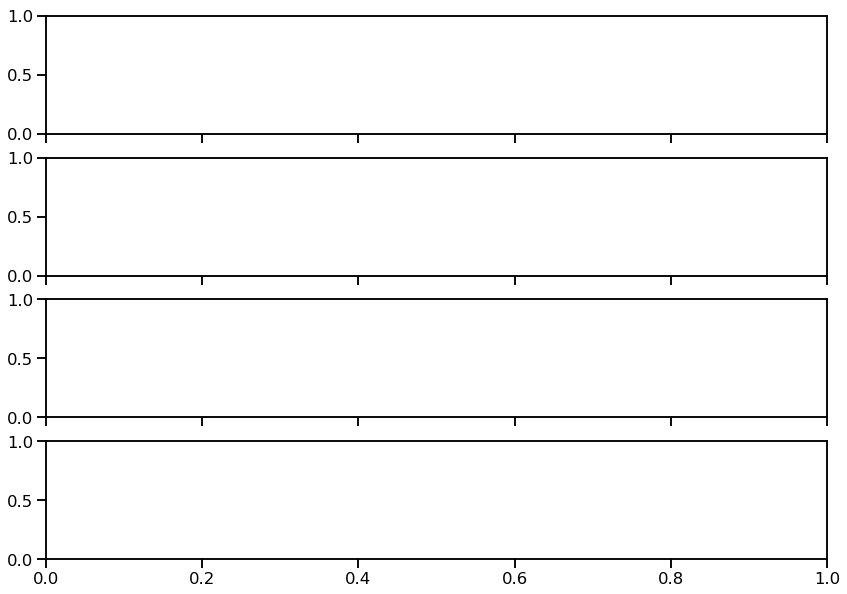

In [9]:
T=83

delay=df.loc[df.trial==T]['delay'].unique()[0]

big_data = pd.DataFrame()
for N in df.cluster_id.unique():
    neuron = convolve_trial(df.loc[df.cluster_id==N], df, T, sampling=5)
    big_data = pd.concat([neuron, big_data])

#         delay = 3
align = 'Stimulus_ON'
cue_on=0
cue_off=0.38
start=-2.5
stop=6+delay
# stop= max(df.loc[df.trial==T]['a_'+align])

# Align to specific epoch, in this case Stimulus 
big_data['time_centered'] = big_data['times'] - big_data[align] 
big_data['time_centered'] = np.round(big_data.time_centered/1000, 2) #### estos es importante!!
# neuron = neuron.loc[(neuron['time_centered'] < delay+0.38)]
big_data['firing_'] = big_data['firing']*1000

df_results = pd.DataFrame(dtype=float)
df_results['firing'] = big_data.loc[(big_data.time_centered <= stop)].groupby(['time_centered','neuron'])['firing_'].mean()
df_results['error'] = big_data.loc[(big_data.time_centered <= stop)].groupby(['time_centered','neuron'])['firing_'].std()
df_results.reset_index(inplace=True)

# This piece of code is to filter neurons with lower than 1 Hz firing across the session
filter_neuron = df_results.groupby('neuron').firing.mean().reset_index()
filter_neuron = (df_results.loc[(df_results.time_centered>0)&(df_results.time_centered<delay+0.2)]
                 .groupby(['neuron']).firing.mean().reset_index())
filter_neuron = filter_neuron.loc[filter_neuron.firing > 2]
neurons = filter_neuron.neuron.unique()
df_results = df_results.loc[df_results.neuron.isin(neurons)]

fig, ax = plt.subplots(4,sharex=True,figsize=(14,10))
# fig.suptitle ('Divided by correct and incorrect response without delays of 0s')

significant_left_neurons = df_weights.loc[(df_weights[window] < -threshold)].neuron.unique()
significant_right_neurons = df_weights.loc[(df_weights[window] > threshold)].neuron.unique()

# --------------- With the raw firing rate
right = df_results[df_results['neuron'].isin(significant_right_neurons)].groupby('time_centered').firing.mean().values
left = df_results[df_results['neuron'].isin(significant_left_neurons)].groupby('time_centered').firing.mean().values

x = df_results.groupby('time_centered').firing.mean().index
ax[1].plot(x,  df_results.groupby('time_centered').firing.mean().values, linewidth=2, color='black')

x = df_results[df_results['neuron'].isin(significant_right_neurons)].groupby('time_centered').firing.mean().index
ax[1].plot(x,  right, linewidth=2, color=COLORRIGHT)

x = df_results[df_results['neuron'].isin(significant_left_neurons)].groupby('time_centered').firing.mean().index
ax[1].plot(x,  left, linewidth=2, color=COLORLEFT)
ax[2].plot(x,  right-left, linewidth=2, color='grey')

# -------------   Now multiplying the betas
for neuron in df_results.neuron.unique():
    df_results.loc[df_results.neuron==neuron, 'firing'] *= abs(df_weights.loc[df_weights.neuron==neuron][window].values[0])

right = df_results[df_results['neuron'].isin(significant_right_neurons)].groupby('time_centered').firing.mean().values
left = df_results[df_results['neuron'].isin(significant_left_neurons)].groupby('time_centered').firing.mean().values

x = df_results.groupby('time_centered').firing.mean().index
ax[3].plot(x,  df_results.groupby('time_centered').firing.mean().values, linewidth=2, color='black', alpha=0.5)

x = df_results[df_results['neuron'].isin(significant_right_neurons)].groupby('time_centered').firing.mean().index
ax[3].plot(x,  right, linewidth=2, color=COLORRIGHT, alpha=0.5)

x = df_results[df_results['neuron'].isin(significant_left_neurons)].groupby('time_centered').firing.mean().index
ax[3].plot(x,  left, linewidth=2, color=COLORLEFT, alpha=0.5)
ax[2].plot(x,  right-left, linewidth=2, color='grey', alpha=0.5)
y = np.arange(-0,10+1,0.1)
ax[3].fill_betweenx(y, cue_on,cue_off, color='grey', alpha=1)
ax[3].fill_betweenx(y, cue_off+delay,cue_off+delay+.2, color='lightgrey', alpha=1)    
ax[3].set_xlabel('Beta weighted')

# -------
ax[1].set_xlim(start,stop)  
# ax[1].set_ylim(0,60)  
ax[1].set_xlabel('Time (s) from response onset')
y = np.arange(0,75,0.1)     

ax[1].fill_betweenx(y, cue_on,cue_off, color='darkgrey', alpha=.8)  
ax[1].fill_betweenx(y, cue_off+delay,cue_off+delay+.2, color='beige', alpha=.8)
ax[1].set_ylim(0,10)

sns.despine()

df['a_Stimulus_ON'] = df['fixed_times'] - df['Stimulus_ON']

# Organized by cluster_id and corrected for FR ____________________________
cluster_id=[]
FR_mean=[]
dft = df.loc[df.trial ==T]
dft = dft.loc[dft.cluster_id.isin(neurons)]

start_FR = 0
stop_FR = delay

for N in dft.cluster_id.unique():
    # spikes = dft.loc[(dft.cluster_id==N)]['a_'+align].values
    spikes = dft.loc[(dft.cluster_id==N)&(dft['a_'+align] > start_FR)&(dft['a_'+align]<stop_FR)].fixed_times.values
    FR_mean.append(len(spikes)/abs(stop_FR-start_FR))
    cluster_id.append(N)

df_spikes = pd.DataFrame(list(zip(cluster_id,FR_mean)), columns =['cluster_id','FR'])
df_spikes = df_spikes.sort_values('FR')
df_spikes['new_order'] = np.arange(len(df_spikes))

dft = pd.merge(df_spikes, dft, on=['cluster_id'])

# j=0
# for N in dft.new_order.unique():
#     cluster_id = dft.loc[dft.new_order==N].cluster_id.iloc[0]
#     if df_weights.loc[df_weights.neuron == cluster_id]["Delay_OFF--0.5-0"].iloc[0] >threshold:
#         color_selectivity=COLORRIGHT
#     elif df_weights.loc[df_weights.neuron == cluster_id]["Delay_OFF--0.5-0"].iloc[0] <-threshold:
#         color_selectivity=COLORLEFT

#     spikes = dft.loc[dft.new_order==N]['a_'+align].values
#     j+=1
#     ax[0].plot(spikes,np.repeat(j, len(spikes)), '|', markersize=3, color=color_selectivity, zorder=1)

right = 0
left = len(significant_right_neurons)-2
for N in dft.new_order.unique():
    cluster_id = dft.loc[dft.new_order==N].cluster_id.iloc[0]
    if df_weights.loc[df_weights.neuron == cluster_id][window].iloc[0] >threshold:
        color_selectivity=COLORRIGHT
        j=right
        right+=1
    elif df_weights.loc[df_weights.neuron == cluster_id][window].iloc[0] <-threshold:
        color_selectivity=COLORLEFT
        j=left
        left+=1
    spikes = dft.loc[dft.new_order==N]['a_'+align].values
    ax[0].plot(spikes,np.repeat(j, len(spikes)), '|', markersize=3, color=color_selectivity, zorder=1)

ax[0].set_ylabel('Single units')
ax[0].set_ylim(0,len(dft.new_order.unique())+1)
ax[1].set_ylim(0,18)
ax[2].set_ylim(-12,12)

y = np.arange(-12,12+1,0.1)
ax[2].fill_betweenx(y, cue_on,cue_off, color='grey', alpha=1)
ax[2].fill_betweenx(y, cue_off+delay,cue_off+delay+.2, color='lightgrey', alpha=1)    
ax[2].hlines(xmin=start, xmax=stop, y=0, linestyle=':')

y = np.arange(0,len(dft.new_order.unique())+1,0.1)
ax[0].fill_betweenx(y, cue_on,cue_off, color='grey', alpha=1)
ax[0].fill_betweenx(y, cue_off+delay,cue_off+delay+.2, color='lightgrey', alpha=1)    
ax[0].set_xlim(start,stop)
sns.despine()

# axis labels and legend
# ax[1].legend(frameon=False, bbox_to_anchor=(1.05, 1))    
ax[1].set_xlabel('Time from stimulus onset (s)')
ax[1].set_ylabel('Firing rate (spikes/s)')
ax[0].set_title('Trial: ' + str(T) + '; WM_roll: '+str(np.round(dft.WM_roll.unique()[0],2))+'; Hit: '+str(dft.hit.unique()[0])+ '; Side: '+str(dft.reward_side.unique()[0]))

plt.show()
plt.close()

#### **Decoder for single trials**

In [4]:
import numpy as np
from scipy.stats import norm
from sklearn.linear_model import LogisticRegression

def logit_pvalue(model, x):
    """ Calculate z-scores for scikit-learn LogisticRegression.
    parameters:
        model: fitted sklearn.linear_model.LogisticRegression with intercept and large C
        x:     matrix on which the model was fit
    This function uses asymtptics for maximum likelihood estimates.
    """
    p = model.predict_proba(x)
    n = len(p)
    m = len(model.coef_[0])+1
    coefs = np.concatenate([model.intercept_, model.coef_[0]])
    x_full = np.matrix(np.insert(np.array(x), 0, 1, axis = 1))
    ans = np.zeros((m, m))
    for i in range(n):
        ans = ans + np.dot(np.transpose(x_full[i, :]), x_full[i, :]) * p[i,1] * p[i, 0]
    vcov = np.linalg.inv(np.matrix(ans))
    se = np.sqrt(np.diag(vcov))
    t =  coefs/se  
    p = (1 - norm.cdf(abs(t))) * 2
    return p

In [36]:
def test(df,sc_fit, epoch='Stimulus_ON',initrange=-0.4,endrange=1.5,r=0.2, model = None, train_cols=None, variable='ra_accuracy',
         hit=1, nsurrogates = 100, decode='vector_answer', ratio=0, cluster_list = [], test_index=[], 
         fakey=[], delay_only=False, T=1):
    '''
    Function that tests a previously trained function (func. train_decoder) on population activity of specific segments
    
    Attributes
        - df: DataFrame. it contains a whole ephys session without curation. 
        - WM and RL are the variables to consider a trial in the RL or in the WM-module. Both need to be floats. 
        - epoch: str. Moment at which the data will be aligned to. 
        - initrange: float. 
        - endrange: float.
        - r: float 
        - model. function. 
        - train_cols
        - name. String
        - variables. List. 
        - hits. List. 
        - colors. List
        - nsurrogates. Int. 
        - indexes. List 
        - decode. String
    
    Return
        - df_real
        - df_iter
        It will also make a plot. 
    '''
    
    df_real = pd.DataFrame()
    df_iter = pd.DataFrame()
        
    times = [] # Timestamps
    real_score = [] # real scoring of the decoded
    odds_score = [] # real scoring of the decoded
    mean_sur=[] # mean of the surrogate data

    for start, stop in zip(np.arange(initrange,endrange-r,r/4),np.arange(initrange+r,endrange,r/4)):
        times.append((start+stop)/2)
        df_final, y = interval_extraction_trial(df,variable = decode, align = epoch, start = start, stop = stop, cluster_list=cluster_list, delay_only=delay_only)
        
        # Sometimes the testing and the trainind dataset have different neurons since they are looking at different trials and perhaps there were no spikes
        # coming from all neurons. We compare which columns are missing and add them containing 0 for the model to work. 
        test_cols = df_final.columns
        common_cols = train_cols.intersection(test_cols)
        train_not_test = train_cols.difference(test_cols)
        for col in train_not_test:
            df_final[col] = 0

        #The other way round. When training in segmented data, sometimes the training set is smaller than the testing (for instance, when training in Hb trials and testing in WM)
        test_not_train = test_cols.difference(train_cols)
        for col in test_not_train:
            df_final.drop(columns=[col],inplace=True)
        
        df_final = df_final.reindex(columns=train_cols)

        #Train the model"
        if len(test_index) >= 1:
            print('Train splitting trials')
            # Split data in training and testing
            # x_train, x_test, y_train, y_test =\
            #     train_test_split(df_final, y, test_size=test_sample,random_state=random_state)
            
            df_final.reset_index(inplace=True)
            df_final = df_final.drop(columns ='trial')
            test = df_final.loc[test_index,:]
            # print('Fold',str(fold_no),'Class Ratio:',sum(test['y'])/len(test['y']))
            x_test = test.iloc[:, test.columns != 'y']
            y_test = test['y']             

        else:
            x_train = df_final.iloc[:, df_final.columns != 'y']
            y_train = df_final['y']
            x_test = x_train
            y_test = y_train
        
        #Normalize the X data
        # sc = RobustScaler()
        # x_test = sc.fit_transform(x_test)
        
        x_test = sc_fit.transform(x_test)
        
        p_pred = model.predict_proba(x_test)
        y_pred = model.predict(x_test)
        score_ = model.score(x_test, y_test)
        # real_score.append(score_)

        real_index_trial = df_final.reset_index()[df_final.index == T].index[0]
        
        y_test = np.where(y_test == -1, 0, y_test) 
        # y_new = y_test.values.reshape(len(y_test), 1).astype(int)
        y_new = y_test.reshape(len(y_test), 1).astype(int)
        corrected_score =  np.take_along_axis(p_pred, y_new, axis=1)  
        # print(corrected_score[real_index_trial])
        
        incorrected_score =  np.repeat(1, len(corrected_score))[0] - corrected_score
        # print(incorrected_score[real_index_trial])
        incorrected_score[incorrected_score == 0] = 0.01
        corrected_score[corrected_score == 0] = 0.01
            
        log_odds = np.log(corrected_score/incorrected_score)
        # print(log_odds[real_index_trial])
        
        real_score.append(corrected_score[real_index_trial])
        odds_score.append(log_odds[real_index_trial])
        
        # print(corrected_score[real_index_trial],log_odds[real_index_trial])

#         i=0
#         while i <= nsurrogates:
#             i+=1
#             y_perr = shuffle(y_test)
#             score_ = model.score(x_test, y_perr)
            
#             # y_new = y_perr.values.reshape(len(y_perr), 1).astype(int)
#             # y_new = y_perr.reshape(len(y_perr), 1).astype(int)
#             # result =  np.take_along_axis(p_pred,y_new,axis=1)     
#             # score_  = np.mean(result)

#             df_iter = df_iter.append({'iteration': i, 'score': score_, 'times': (start+stop)/2, 'epoch' : epoch, 'variable' : variable+'_'+str(hit)}, ignore_index = True)
        
    times.append('trial_type')
#     real_score.append(variable+'_'+str(hit))
#     a_series = pd.Series(real_score, index = times)
#     df_real = df_real.append(a_series, ignore_index=True)
    
    odds_score.append(variable+'_'+str(hit))
    a_series = pd.Series(odds_score, index = times)
    df_real = df_real.append(a_series, ignore_index=True)
    
    return df_real, df_iter

In [68]:
def train(df, decode='vector_answer', align='Delay_OFF', start=-0.5, stop=0, cluster_list = [], ratio=0.65, 
          test_index=[],  train_index=[], fakey=[], delay_only=False):

    df_final, y = interval_extraction_trial(df,variable = decode, align = align, start = start, stop = stop, cluster_list = cluster_list, delay_only=delay_only)
    
    # This is mainly for the session shuffles
    if len(fakey) > 1:
        print('Using shuffled session')
        y = fakey[len(fakey)-len(y):]
        df_final['y'] = y   
        
    train_cols = df_final.columns
    
    #Train the model   
    df_final.reset_index(inplace=True)
    df_final = df_final.drop(columns ='trial')
    x = df_final.iloc[:, df_final.columns != 'y']
    
    if len(test_index) >= 1:
        print('Using splits')
        train = df_final.loc[train_index,:]
        test = df_final.loc[test_index,:]
        # print('Fold',str(fold_no),'Class Ratio:',sum(test['y'])/len(test['y']))
        x_test = test.iloc[:, test.columns != 'y']
        y_test = test['y']
        x_train = train.iloc[:, train.columns != 'y']
        y_train = train['y']
        
    else:
        x_train = df_final.iloc[:, df_final.columns != 'y']
        y_train = df_final['y']
        x_test = x_train
        y_test = y_train
        
    #Normalize the X data
    sc = RobustScaler()
    # sc = StandardScaler()
    sc_fit = sc.fit(x_train)
    x_train = sc.fit_transform(x_train)
    x_test = sc.transform(x_test)
    
    # x_train = sc_fit.transform(x_train)
    # x_test = sc_fit.transform(x_test)
    
    model = LogisticRegression(solver='liblinear', penalty = 'l1', C=.95, fit_intercept=True, class_weight='balanced').fit(x_train, y_train)
    # model = LogisticRegression(solver='liblinear', penalty = 'l1', C=0.95, fit_intercept=True).fit(x_train, y_train)
    
    train_cols = df_final.columns
    
    p_pred = model.predict_proba(x_test)    
    y_pred = model.predict(x_test)   
    
    # try:
    #     p_values = logit_pvalue(model, x_train)
    # except:
    X2 = sm.add_constant(x_train)
    est = sm.OLS(y_train, X2)
    est2 = est.fit()
    p_values = est2.pvalues

    f1score= f1_score(y_test, y_pred, average='weighted')

    y_test = np.where(y_test == -1, 0, y_test) 
    y_new = y_test.reshape(len(y_test), 1).astype(int)
    # y_new = y_test.values.reshape(len(y_test), 1).astype(int)
    score_ =  np.take_along_axis(p_pred,y_new,axis=1)   

    # print('Trained model on ', len(train_cols), ' neurons.')
    print('score:', np.mean(score_), 'f1_score ', f1score)
    # p_values = logit_pvalue(model, x_test)
    
    return model, train_cols, sc_fit, p_values

In [7]:
def interval_extraction_trial(df, cluster_list=[], variable = 'vector_answer', align = 'Delay_OFF', start = 0, stop = 1, delay_only=False):
    y = []
    d = {}
    
    if delay_only == False:
        # print('Skipping delays')
        if align == 'Delay_OFF' and start < 0:
            df = df.loc[(df.delay != 0.1) & (df.delay != 0.2)]
        if align == 'Delay_OFF' and start < -1:
            df = df.loc[(df.delay != 0.1) & (df.delay != 0.2) & (df.delay != 1)]

        if align == 'Stimulus_ON' and stop > 0.5:
            df = df.loc[(df.delay != 0.1) & (df.delay != 0.2)]

        if align == 'Stimulus_ON' and stop > 1.5:
            df = df.loc[(df.delay != 0.1) & (df.delay != 0.2) & (df.delay != 1)]
    
    # print('Recovered from: ', str(len(df.trial.unique())), ' trials')
    # Create new aligment to the end of the session
    df['a_'+align] = df.fixed_times-df[align]

    # cluster_list = df_all.cluster_id.unique()
    df = df.sort_values('trial')
    
    y = df.groupby('trial').mean()[variable]

    # Filter for the spikes that occur in the interval we are analyzing
    df = df.loc[(df['a_'+align]>start)&(df['a_'+align]<stop)]

    df_final = pd.DataFrame()
    df_final = df.groupby(['trial','cluster_id']).count()
    df_final.reset_index(inplace=True)
    df_final = df_final.pivot_table(index=['trial'], columns='cluster_id', values='fixed_times', fill_value=0).rename_axis(None, axis=1)
    df_final = df_final.reindex(cluster_list, axis=1,fill_value=0)

    result = pd.merge(df_final, y, how="right", on=["trial"]).fillna(0)
    result = result.rename(columns={variable: "y"})
    result['y'] = np.where(result['y'] == 0, -1, result['y']) 
    
    return result, result['y']

In [38]:
def plotsingletrialdecoder(df, T,ax1,endrange):
    ## Dataframe used for cumulative analysis
    df_cum_sti = pd.DataFrame()
    df_cum_shuffle = pd.DataFrame()

    substract = False

    # Variables used for decoder training
    decode = 'vector_answer'
    align='Delay_OFF'
    ratio = 0.6
    start = -0.5
    stop = 0
    type_trial ='WM_roll'
    hit = 1
    nsplits=5
    
    #Variables for testing
    # colors=['darkgreen','crimson', 'indigo']
    # variables = ['WM_roll','WM_roll','RL_roll']
    # hits = [1,0,1]
    # ratios = [0.6,0.6,0.4]
    # variables_combined=[variables[0]+'_'+str(hits[0]),variables[1]+'_'+str(hits[1]),variables[2]+'_'+str(hits[2])]

    # colors=['crimson','darkgreen']
    # variables = ['WM_roll','WM_roll']
    # hits = [0,1]
    # ratios = [0.6,0.6]
    # variables_combined=[variables[0]+'_'+str(hits[0]),variables[1]+'_'+str(hits[1])]

    colors=['black']
    variables = ['WM_roll']
    hits = [1]
    ratios = [0.6]
    variables_combined=[variables[0]+'_'+str(hits[0])]
    r=1
    # colors=['crimson','darkgreen','indigo','purple']
    # variables = ['WM_roll','WM_roll','RL_roll','RL_roll']
    # hits = [0,1,1,0]
    # ratios = [0.6,0.6,0.3,0.3]
    # variables_combined=[variables[0]+'_'+str(hits[0]),variables[1]+'_'+str(hits[1]),variables[2]+'_'+str(hits[2]),variables[3]+'_'+str(hits[3])]

    cluster_list = df.cluster_id.unique()

    # skf = KFold(n_splits=nsplits, shuffle=True)

    # Create a dataframe for training data
    if type_trial == 'all':
        df_train = df.loc[(df.hit==hit)]
    elif hit == 'all':
        df_train = df.loc[(df[type_trial]>=ratio)]
    else:
        df_train = df.loc[(df[type_trial]>=ratio)&(df.hit==hit)]
    
    # if model !=
    df_train = df.loc[(df.delay!=0.2)&(df.delay!=0.1)&(df.trial!=T)]

    # df_test = df.loc[(df.delay!=0.2)&(df.delay!=0.1)]
    df_test = df.loc[(df.trial==T)]
    
    delay = df_test.loc[df_test.trial == T]['delay'].unique()[0]
    
    model, train_cols, sc, p_values = train(df, decode=decode, align=align, start=start, stop=stop, cluster_list = cluster_list, ratio=ratio)
        
    loop_weights = pd.DataFrame()
    real_order = train_cols[:-1]
    weights = pd.DataFrame(model.coef_[0]).T
    weights.columns = list(real_order)
    weights.rename(index={0:align+'-'+str(start)+'-'+str(stop)},inplace=True)
    loop_weights = pd.concat([weights,loop_weights])
            
    # Make a mean for this subject in the several conditions
    loop_weights = loop_weights.reset_index().rename(columns={'index':'condition'})
    loop_weights = loop_weights.groupby('condition').mean().T.reset_index()
    loop_weights = loop_weights.drop(columns='index')
    loop_weights['subject'] = filename[:3]
    loop_weights['session'] = filename
    loop_weights['neuron'] = real_order
    
    try:
        print(len(p_values), len(loop_weights))
        loop_weights['p_values'] = p_values.values[1:]
    except:
        pass
    
    df_res = pd.DataFrame()
    df_sti = pd.DataFrame()
    df_iter = pd.DataFrame()

    for color, variable,hit,ratio,left in zip(colors,variables,hits,ratios,[ax1,ax1,ax1,ax1]):

        df_real,df_temp = test(df_test, sc, T = T, decode= decode,epoch='Stimulus_ON',initrange=-2.5,endrange=endrange, r=r, model = model, delay_only=delay, 
                                          variable=variable, hit=hit, nsurrogates = 100,train_cols = train_cols, cluster_list = cluster_list)

        df_sti = pd.concat([df_real,df_sti])
        df_iter = pd.concat([df_iter,df_temp])

        variable = str(variable)+'_'+str(hit)

        # Aligmnent for Stimulus cue
        real = df_sti.loc[(df_sti['trial_type'] ==variable)].mean(axis=0).to_numpy()
        times = np.around(np.array(df_sti.columns)[:-1].astype(float),2)
        x=times

        left.set_xlabel('Time (s) to Cue')

        if substract == True:
            df_new= df_iter.groupby('times')['score']
            y_mean= df_new.mean().values
            lower =  df_new.quantile(q=0.975, interpolation='linear')-y_mean
            upper =  df_new.quantile(q=0.025, interpolation='linear')-y_mean
        
            left.plot(times,real-y_mean, color=color)
            # blurred = gaussian_filter(real, sigma=1)
            # left.plot(times,blurred, color='grey')
            
            left.plot(x, lower+real-y_mean, color=color, linestyle = '',alpha=0.6)
            left.plot(x, upper+real-y_mean, color=color, linestyle = '',alpha=0.6)
            left.fill_between(x, lower+real-y_mean, upper+real-y_mean, alpha=0.2, color=color)
            if abs(min(real)) > max(real):
                max_true=abs(min(real))+0.5
            else:
                max_true=abs(max(real))
            left.set_ylim(-max_true,max_true)
            left.axhline(y=0.0,linestyle=':',color='black')
            left.fill_betweenx(np.arange(-max_true,max_true,0.1), 0,0.4, color='grey', alpha=.4)
            left.fill_betweenx(np.arange(-max_true,max_true,0.1), delay+0.3,delay+0.5, color='beige', alpha=.8)

        elif substract == False:
            left.plot(times,real, color=color)
            # blurred = gaussian_filter(real, sigma=1)
            # left.plot(times,blurred, color='grey')
            # left.plot(x, lower+real, color=color, linestyle = '',alpha=0.6)
            # left.plot(x, upper+real, color=color, linestyle = '',alpha=0.6)
            # left.fill_between(x, lower+real, upper+real, alpha=0.2, color=color)
            if abs(min(real)) > max(real):
                max_true=abs(min(real))+0.5
            else:
                max_true=abs(max(real))
            left.set_ylim(-max_true,max_true)
            left.axhline(y=0.5,linestyle=':',color='black')
            left.fill_betweenx(np.arange(-max_true,max_true,0.1), 0,0.4, color='grey', alpha=.4)
            left.fill_betweenx(np.arange(-max_true,max_true,0.1), delay+0.3,delay+0.5, color='beige', alpha=.8)

        sns.despine()
        df_decoder =pd.DataFrame()
        df_decoder['times'] = times
        df_decoder['real'] = real
    return loop_weights, df_decoder

In [75]:
path = 'C:/Users/Tiffany/Google Drive/WORKING_MEMORY/PAPER/Figures/'
file_name = 'weights for the modelling_complete'
df_weights = pd.read_csv(path+file_name+'.csv', index_col=0)

threshold = 0.3
window='Delay_OFF--0.5-0'
df_weights = df_weights.loc[df_weights.session == filename]
# quantile25=df_weights[window].quantile(0.2)
# quantile75=df_weights[window].quantile(0.8)

# significant_neurons = df_weights.loc[(df_weights[window] > threshold)|(df_weights[window] < -threshold)].neuron.unique()
# # significant_neurons = df_weights.loc[(df_weights["Delay_OFF--0.5-0"] > quantile75)|(df_weights["Delay_OFF--0.5-0"] < -quantile25)].neuron.unique()
# df_filtered = df[df['cluster_id'].isin(significant_neurons)]

In [ ]:
threshold_bool = True
filename = 'E20_2022-02-26_16-49-05.csv'
with PdfPages(path +  filename[:-4]+'.pdf') as pdf:
    for T in df.trial.unique():
        delay=df.loc[df.trial==T]['delay'].unique()[0]
        hit=df.loc[df.trial==T]['hit'].unique()[0]
        WM_roll=df.loc[df.trial==T]['WM_roll'].unique()[0]
        trial_index=df.loc[df.trial==T]['T'].unique()[0]
        if delay != 10 or trial_index >1:
            continue

        fig, ax = plt.subplots(4,sharex=True,figsize=(14,10))
        align = 'Stimulus_ON'
        endrange = max(df.loc[df.trial==T]['a_'+align])
        plotsingletrialdecoder(df, T, ax[3],endrange= endrange)
        
        if threshold_bool:
            threshold = 0.1
            window='Delay_OFF--0.5-0'
            significant_neurons = df_weights.loc[(df_weights[window] > threshold)|(df_weights[window] < -threshold)].neuron.unique()
        else:
            threshold = 0
            significant_neurons = df_weights.loc[(df_weights['p_values'] < 0.15)].neuron.unique()

        df_filtered = df[df['cluster_id'].isin(significant_neurons)]

        big_data = pd.DataFrame()
        for N in df_filtered.cluster_id.unique():
            neuron = convolve_trial(df_filtered.loc[df_filtered.cluster_id==N], df, T, sampling=5)
            big_data = pd.concat([neuron, big_data])

        cue_on=0
        cue_off=0.38
        start=-2.5
        # stop=6+delay
        stop= max(df.loc[df.trial==T]['a_'+align])

        # Align to specific epoch, in this case Stimulus 
        big_data['time_centered'] = big_data['times'] - big_data['Stimulus_ON'] 
        big_data['time_centered'] = np.round(big_data.time_centered/1000, 2) #### estos es importante!!
        # neuron = neuron.loc[(neuron['time_centered'] < delay+0.38)]
        big_data['firing_'] = big_data['firing']*1000

        df_results = pd.DataFrame(dtype=float)
        df_results['firing'] = big_data.loc[(big_data.time_centered <= stop)].groupby(['time_centered','neuron'])['firing_'].mean()
        df_results['error'] = big_data.loc[(big_data.time_centered <= stop)].groupby(['time_centered','neuron'])['firing_'].std()
        df_results.reset_index(inplace=True)

        # This piece of code is to filter neurons with lower than 1 Hz firing across the session
        filter_neuron = df_results.groupby('neuron').firing.mean().reset_index()
        filter_neuron = (df_results.loc[(df_results.time_centered>0)&(df_results.time_centered<delay+0.2)]
                         .groupby(['neuron']).firing.mean().reset_index())
        filter_neuron = filter_neuron.loc[filter_neuron.firing > 0.5]
        neurons = filter_neuron.neuron.unique()
        df_results = df_results.loc[df_results.neuron.isin(neurons)]
        
        if threshold_bool:
            significant_left_neurons = df_weights.loc[(df_weights["Delay_OFF--0.5-0"] < -threshold)].neuron.unique()
            significant_right_neurons = df_weights.loc[(df_weights["Delay_OFF--0.5-0"] > threshold)].neuron.unique()
        else:
            significant_left_neurons = df_weights.loc[(df_weights["Delay_OFF-0.5-0"] < 0)].neuron.unique()
            significant_right_neurons = df_weights.loc[(df_weights["Delay_OFF--0.5-0"] > 0)].neuron.unique()

        left = df_results[df_results['neuron'].isin(significant_right_neurons)].groupby('time_centered').firing.mean().values
        right = df_results[df_results['neuron'].isin(significant_left_neurons)].groupby('time_centered').firing.mean().values

        x = df_results.groupby('time_centered').firing.mean().index
        ax[1].plot(x,  df_results.groupby('time_centered').firing.mean().values, linewidth=2, color='black')

        x = df_results[df_results['neuron'].isin(significant_right_neurons)].groupby('time_centered').firing.mean().index
        ax[1].plot(x,  df_results[df_results['neuron'].isin(significant_right_neurons)].groupby('time_centered').firing.mean().values, linewidth=2, color=COLORRIGHT)

        x = df_results[df_results['neuron'].isin(significant_left_neurons)].groupby('time_centered').firing.mean().index
        ax[1].plot(x,  df_results[df_results['neuron'].isin(significant_left_neurons)].groupby('time_centered').firing.mean().values, linewidth=2, color=COLORLEFT)
        ax[2].plot(x,  left-right, linewidth=2, color='grey')

        ax[1].set_xlim(start,stop)  
        # ax[1].set_ylim(0,60)  
        ax[1].set_xlabel('Time (s) from response onset')

        y = np.arange(-20,20+1,0.1)
        ax[2].fill_betweenx(y, cue_on,cue_off, color='grey', alpha=1)
        ax[2].fill_betweenx(y, cue_off+delay,cue_off+delay+.2, color='lightgrey', alpha=1)    

        y = np.arange(0,75,0.1)     
        ax[1].fill_betweenx(y, cue_on,cue_off, color='darkgrey', alpha=.8)  
        ax[1].fill_betweenx(y, cue_off+delay,cue_off+delay+.2, color='beige', alpha=.8)

        ax[1].set_ylim(0,max(df_results.groupby('time_centered').firing.mean().values)+10)
        ax[2].set_ylim(min(left-right)-2,max(left-right)+2)

        df['a_Stimulus_ON'] = df['fixed_times'] - df['Stimulus_ON']

        # Organized by cluster_id and corrected for FR ____________________________
        cluster_id=[]
        FR_mean=[]
        dft = df_filtered.loc[df_filtered.trial ==T]
        dft = dft.loc[dft.cluster_id.isin(neurons)]

        start_FR = 0
        stop_FR = delay

        for N in dft.cluster_id.unique():
            # spikes = dft.loc[(dft.cluster_id==N)]['a_'+align].values
            spikes = dft.loc[(dft.cluster_id==N)&(dft['a_'+align] > start_FR)&(dft['a_'+align]<stop_FR)].fixed_times.values
            FR_mean.append(len(spikes)/abs(stop_FR-start_FR))
            cluster_id.append(N)

        df_spikes = pd.DataFrame(list(zip(cluster_id,FR_mean)), columns =['cluster_id','FR'])
        df_spikes = df_spikes.sort_values('FR')
        df_spikes['new_order'] = np.arange(len(df_spikes))

        dft = pd.merge(df_spikes, dft, on=['cluster_id'])

        # j=0
        # for N in dft.new_order.unique():
        #     cluster_id = dft.loc[dft.new_order==N].cluster_id.iloc[0]
        #     if df_weights.loc[df_weights.neuron == cluster_id]["Delay_OFF--0.5-0"].iloc[0] >threshold:
        #         color_selectivity=COLORRIGHT
        #     elif df_weights.loc[df_weights.neuron == cluster_id]["Delay_OFF--0.5-0"].iloc[0] <-threshold:
        #         color_selectivity=COLORLEFT

        #     spikes = dft.loc[dft.new_order==N]['a_'+align].values
        #     j+=1
        #     ax[0].plot(spikes,np.repeat(j, len(spikes)), '|', markersize=3, color=color_selectivity, zorder=1)

        right = 0
        left = len(cluster_id)

        for N in reversed(dft.new_order.unique()):
            cluster_id = dft.loc[dft.new_order==N].cluster_id.iloc[0]
            # if df_weights.loc[df_weights.neuron == cluster_id]["Delay_OFF--0.5-0"].iloc[0] >0:
            if df_weights.loc[df_weights.neuron == cluster_id]["Delay_OFF--0.5-0"].iloc[0] >threshold:
                color_selectivity=COLORRIGHT
                j=right
                right+=1
            elif df_weights.loc[df_weights.neuron == cluster_id]["Delay_OFF--0.5-0"].iloc[0] <-threshold:
            # elif df_weights.loc[df_weights.neuron == cluster_id]["Delay_OFF--0.5-0"].iloc[0] <0:
                color_selectivity=COLORLEFT
                j=left
                left-=1
            spikes = dft.loc[dft.new_order==N]['a_'+align].values
            ax[0].plot(spikes,np.repeat(j, len(spikes)), '|', markersize=3, color=color_selectivity, zorder=1)

        ax[0].set_ylabel('Single units')
        ax[0].set_ylim(0,len(dft.new_order.unique())+1)

        y = np.arange(0,len(dft.new_order.unique())+1,0.1)
        ax[0].fill_betweenx(y, cue_on,cue_off, color='grey', alpha=1)
        ax[0].fill_betweenx(y, cue_off+delay,cue_off+delay+.2, color='lightgrey', alpha=1)    
        ax[0].set_xlim(start,stop)
        sns.despine()

        # axis labels and legend
        # ax[1].legend(frameon=False, bbox_to_anchor=(1.05, 1))    
        ax[1].set_xlabel('Time from stimulus onset (s)')
        ax[1].set_ylabel('Firing rate (spikes/s)')
        ax[0].set_title('Trial: ' + str(T) + '; WM_roll: '+str(np.round(dft.WM_roll.unique()[0],2))+'; Hit: '+str(dft.hit.unique()[0])+ '; Side: '+str(dft.reward_side.unique()[0]))
        ax[2].hlines(xmin=start, xmax=stop, y=0, linestyle=':')

        pdf.savefig(fig, transparent=True)
        plt.show()
        plt.close()

In [161]:
filename_list = ['E17_2022-02-01_17-02-16.csv','E17_2022-02-02_17-13-06.csv' ,'E20_2022-03-01_16-11-01.csv','E20_2022-02-13_15-10-51.csv',
 'E20_2022-02-27_17-02-17.csv','E20_2022-02-14_16-01-30.csv','E22_2022-01-15_16-53-52.csv','E22_2022-01-14_16-50-37.csv' ,
'E22_2022-01-13_16-34-24.csv','E22_2022-01-17_18-05-16.csv','E14_2021-03-29_13-01-12.csv','E14_2021-04-02_12-53-42.csv' ,
'E04_2021-04-03_16-12-15.csv','E11_2021-05-13_12-34-49.csv','E17_2022-01-31_16-30-44.csv']

E17_2022-02-02_17-13-06.csv
score: 0.8989976878102739 f1_score  0.9538912558013608
110 109


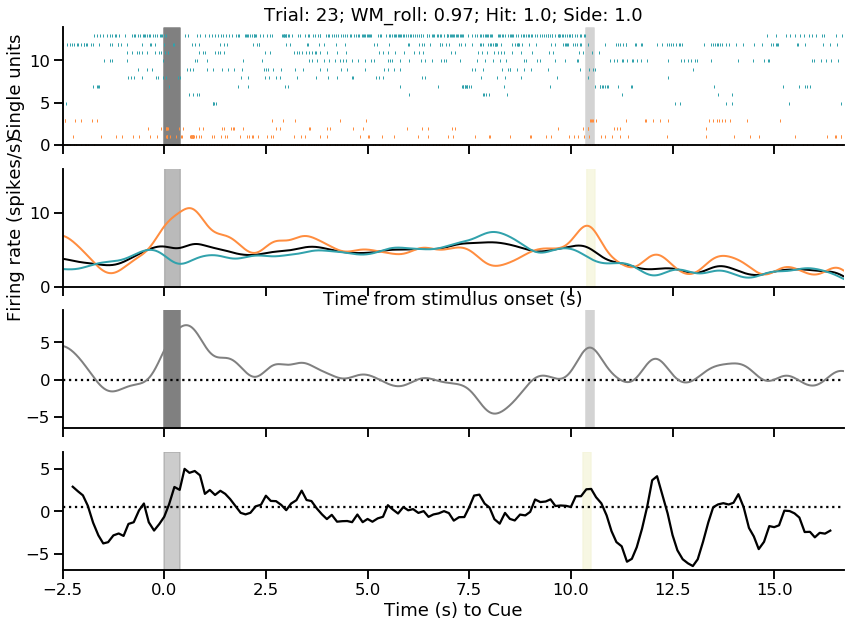

score: 0.8989976642289446 f1_score  0.9538912558013608
110 109


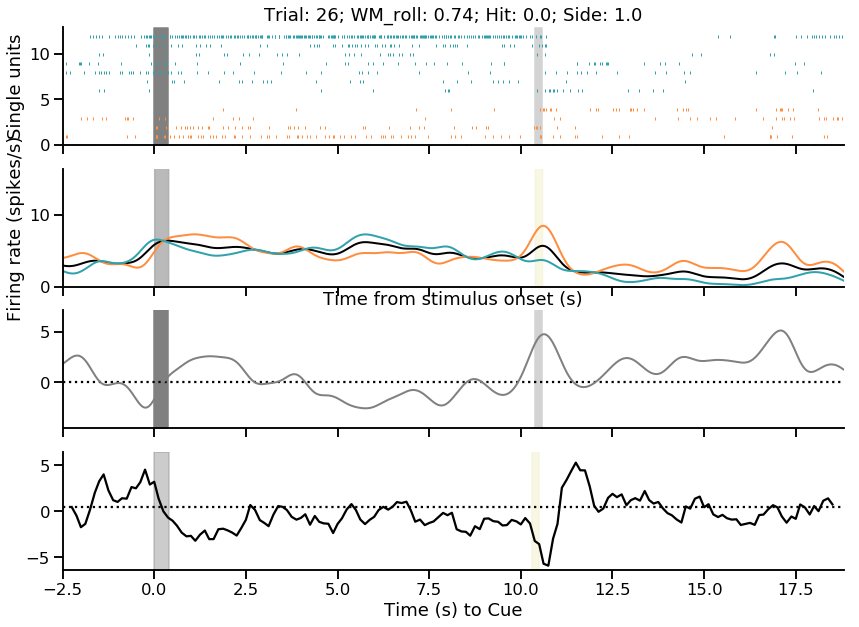

score: 0.8990098740618216 f1_score  0.9538912558013608
110 109


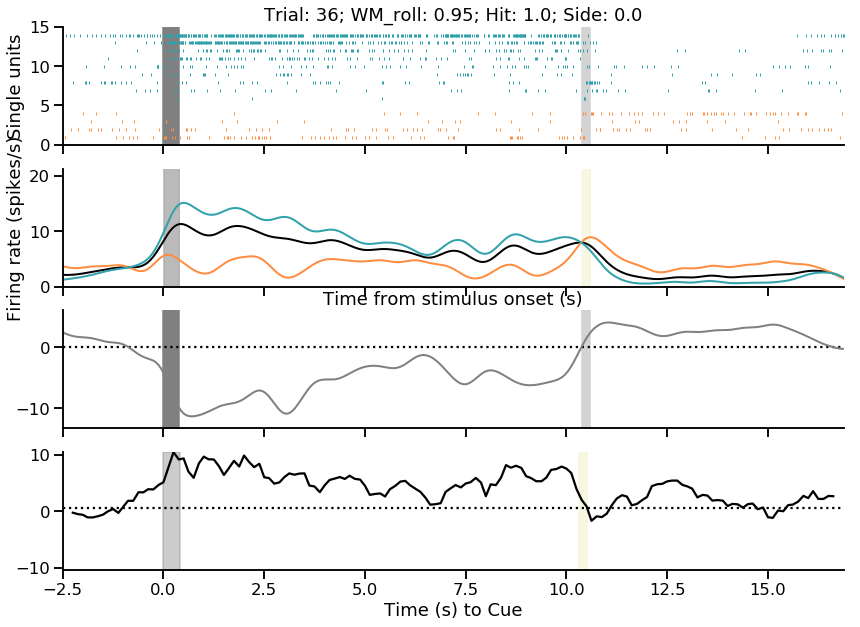

score: 0.8989969591732787 f1_score  0.9538912558013608
110 109


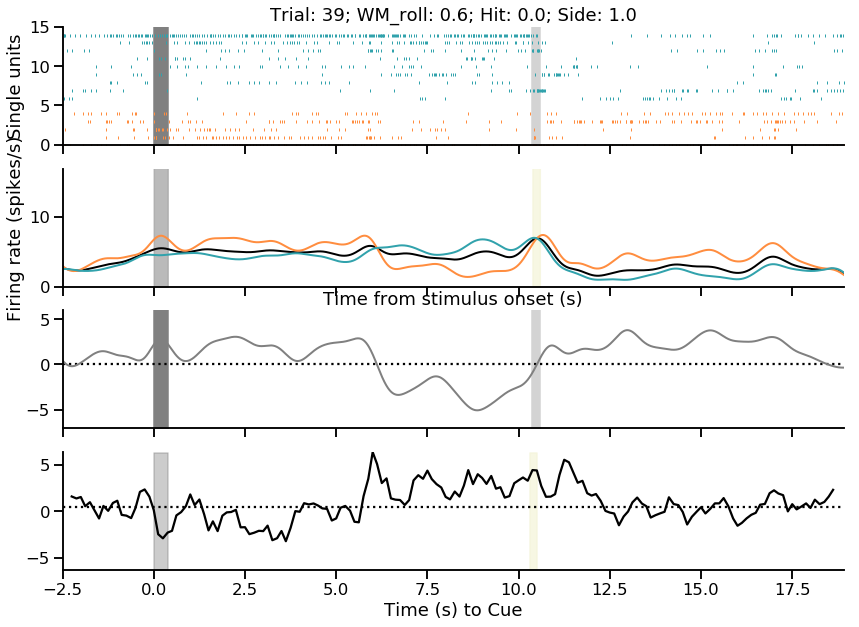

score: 0.899001735281893 f1_score  0.9538912558013608
110 109


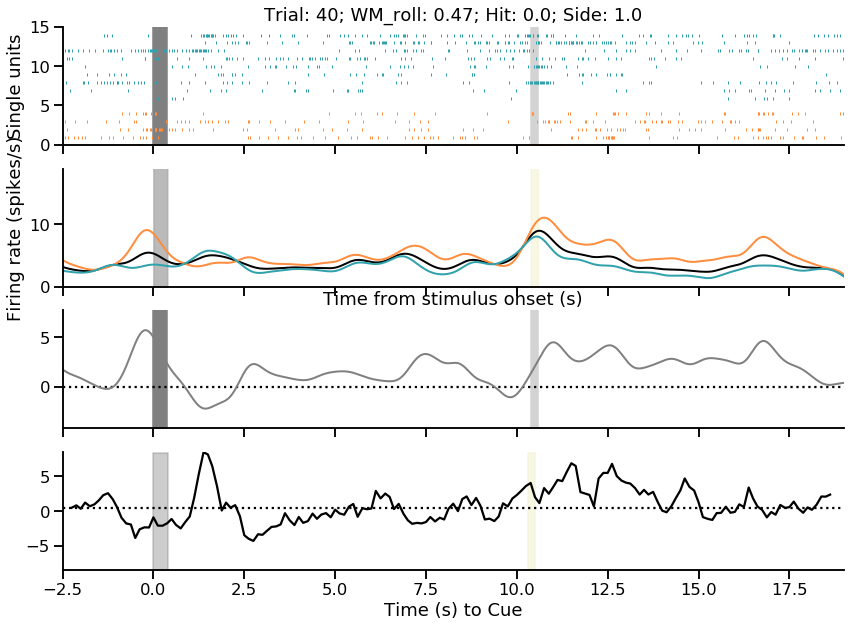

score: 0.8989966791557632 f1_score  0.9538912558013608
110 109


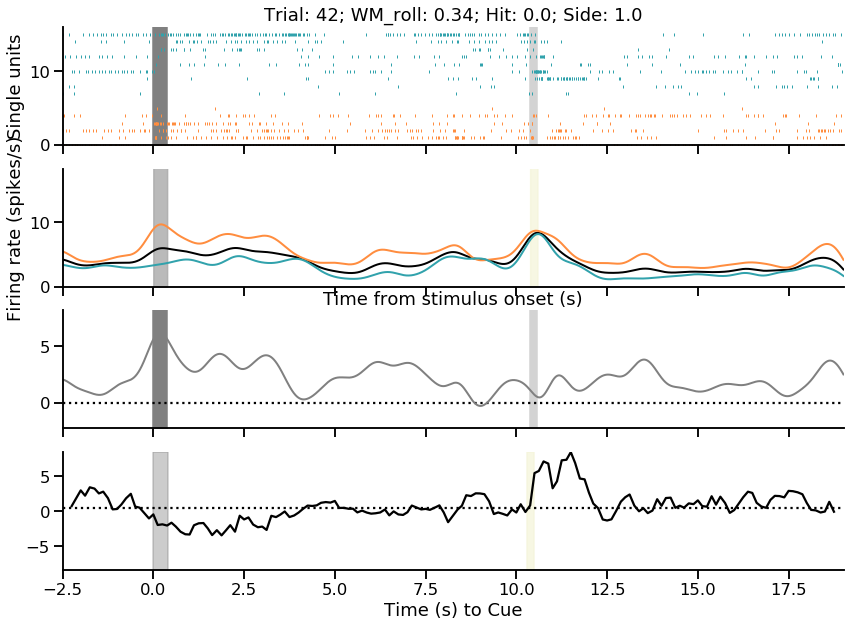

score: 0.8990002135927921 f1_score  0.9538912558013608
110 109


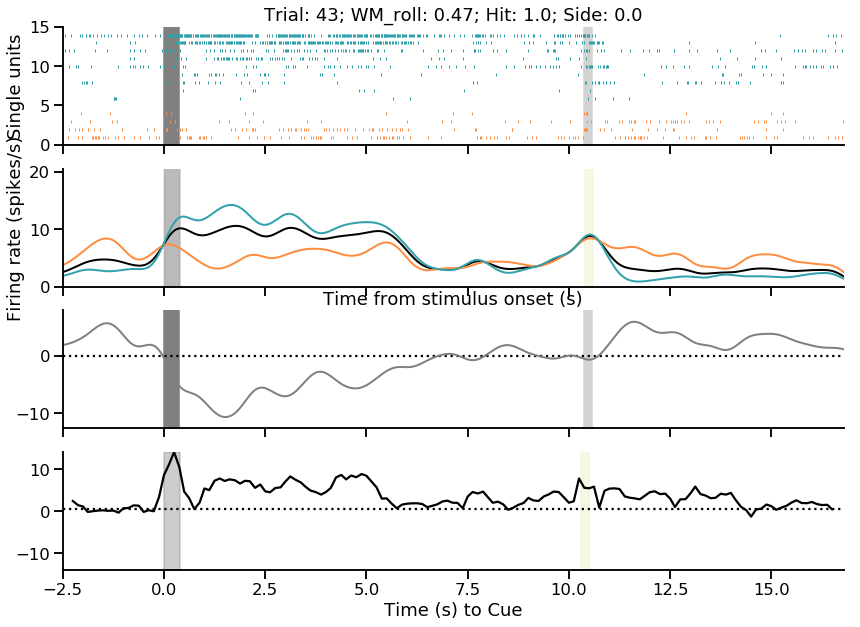

score: 0.8990007172901253 f1_score  0.9538912558013608
110 109


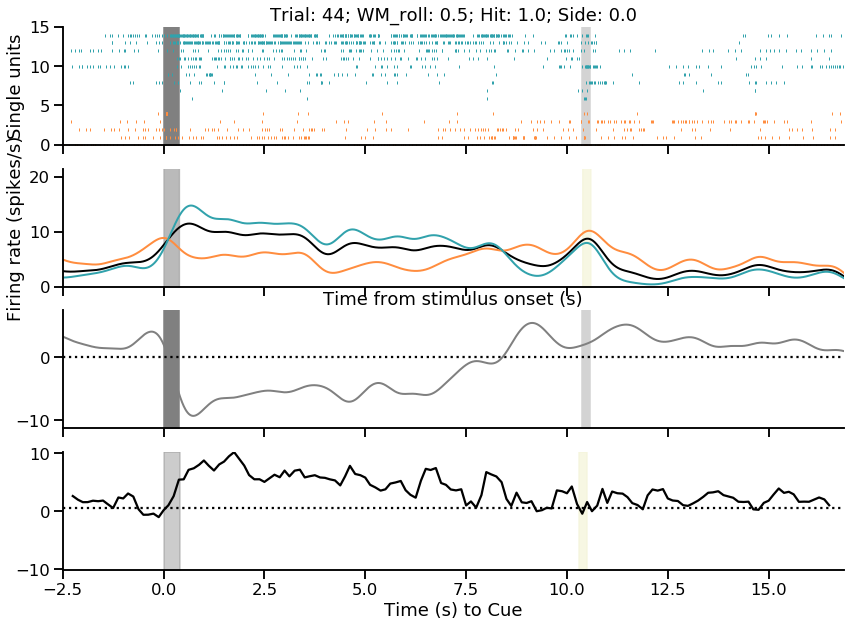

score: 0.8990092395392535 f1_score  0.9538912558013608
110 109


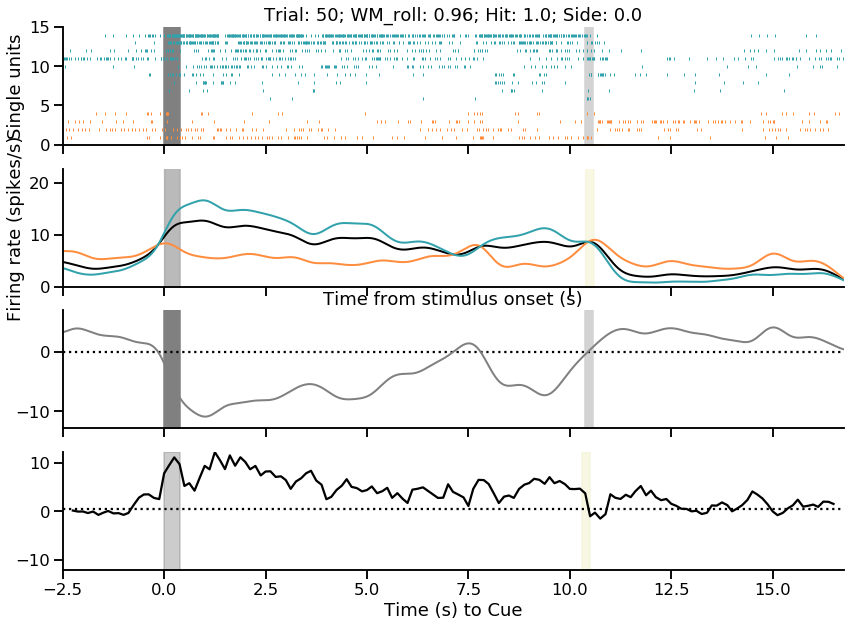

score: 0.899007740864676 f1_score  0.9538912558013608
110 109


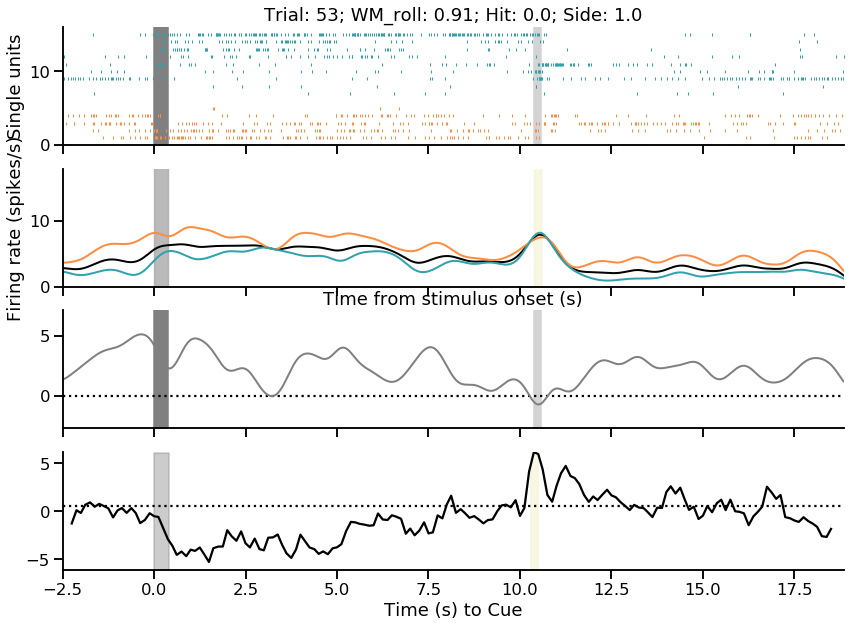

score: 0.8989957094058 f1_score  0.9538912558013608
110 109


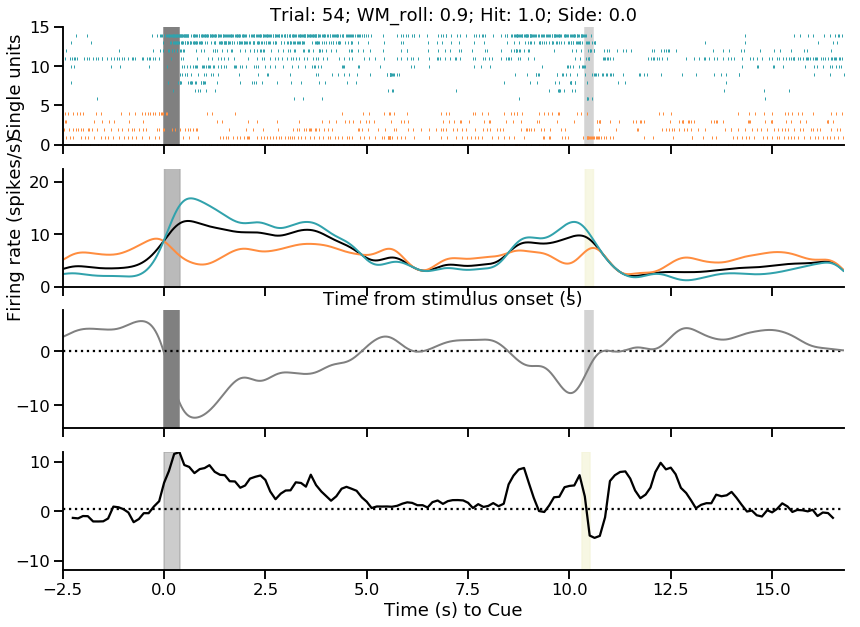

score: 0.8990008446631286 f1_score  0.9538912558013608
110 109


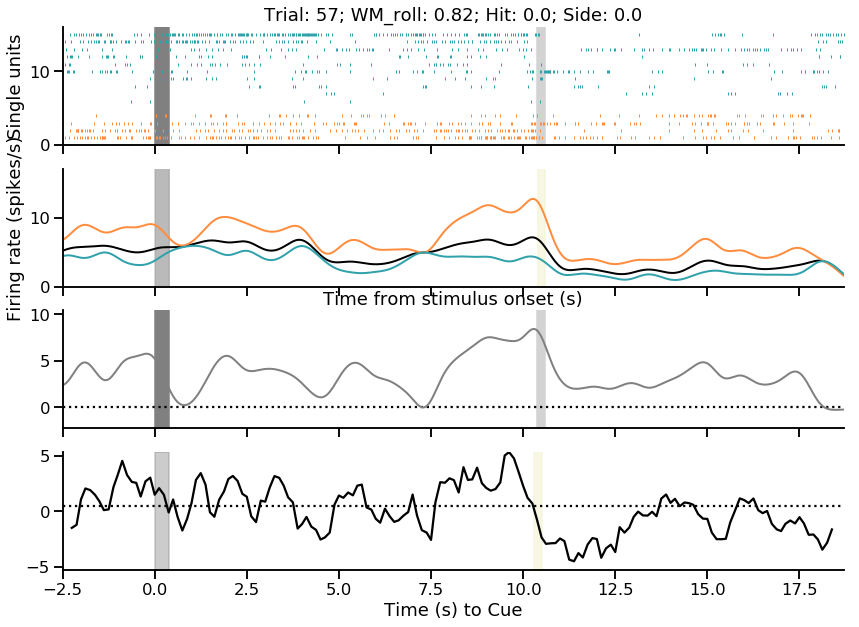

score: 0.8989901947547052 f1_score  0.9538912558013608
110 109


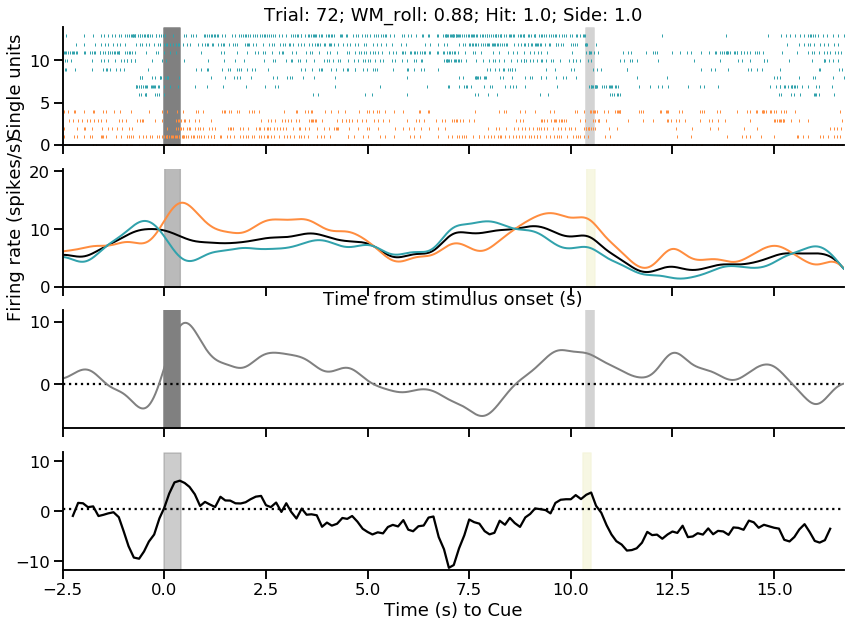

score: 0.8990091549061865 f1_score  0.9538912558013608
110 109


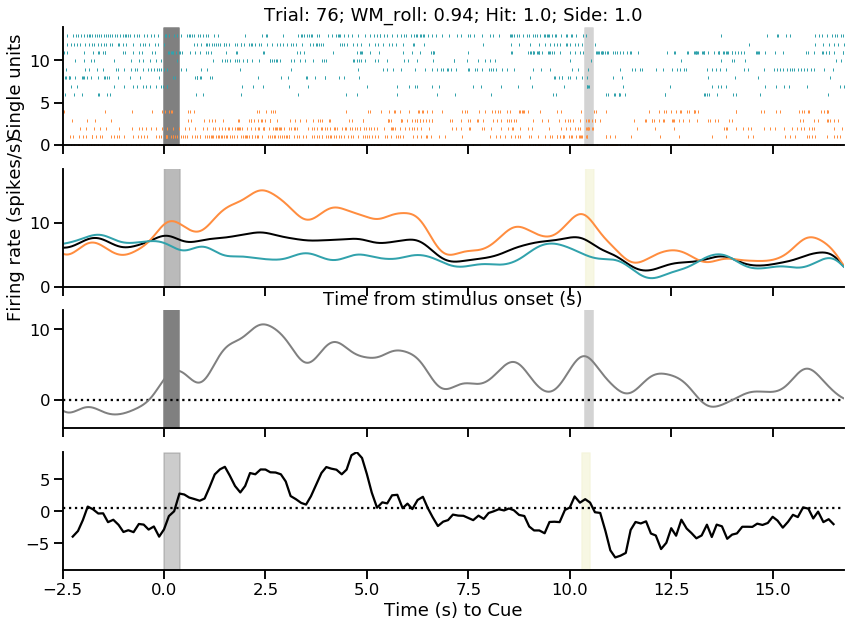

score: 0.8990024385946023 f1_score  0.9538912558013608
110 109


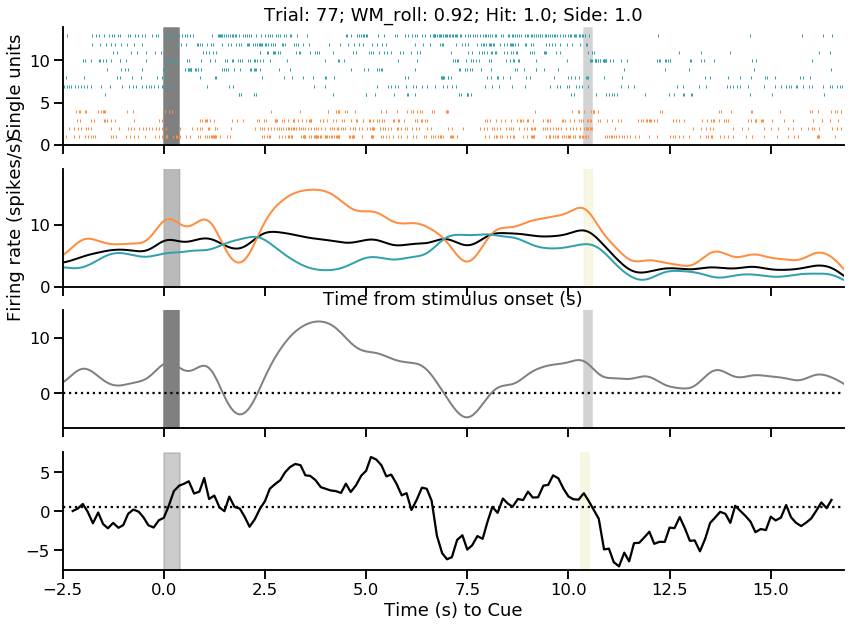

score: 0.8990091302406376 f1_score  0.9538912558013608
110 109


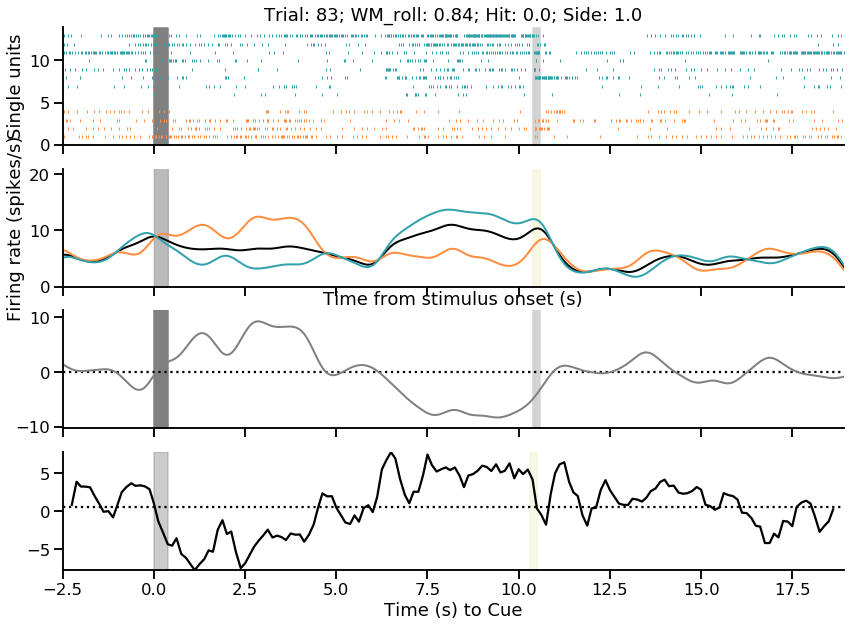

score: 0.898994689775848 f1_score  0.9538912558013608
110 109


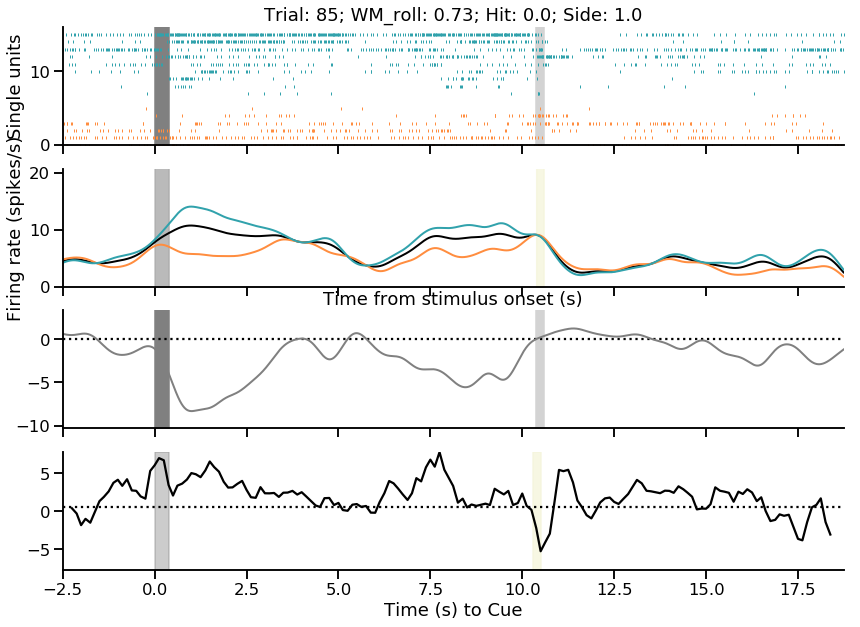

score: 0.8989960995094831 f1_score  0.9538912558013608
110 109


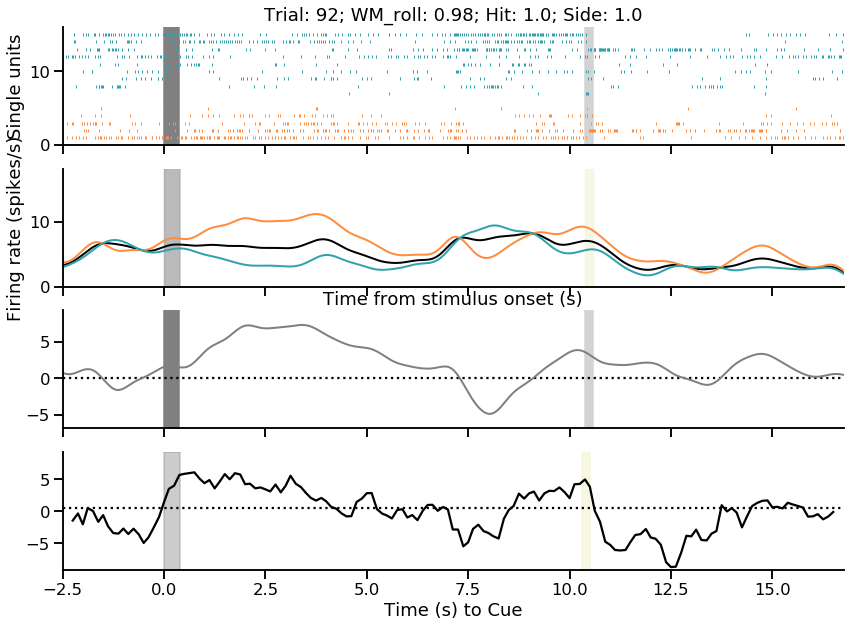

score: 0.8990002425237884 f1_score  0.9538912558013608
110 109


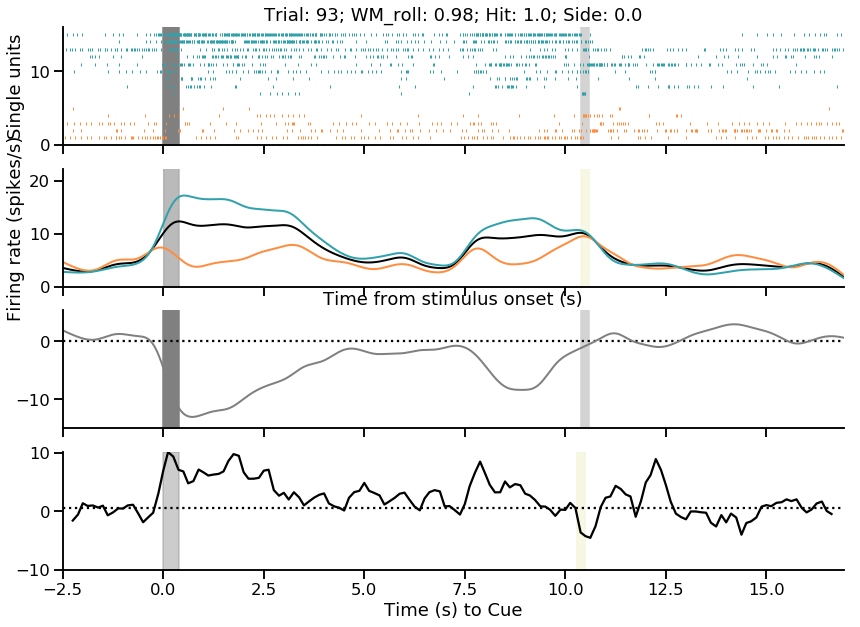

score: 0.8989987463041591 f1_score  0.9538912558013608
110 109


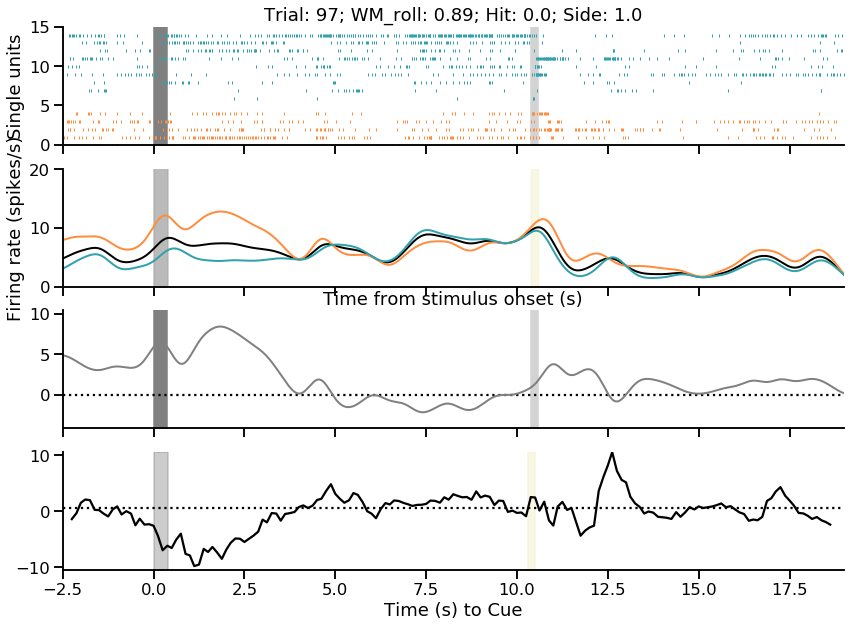

score: 0.8989941837045383 f1_score  0.9538912558013608
110 109


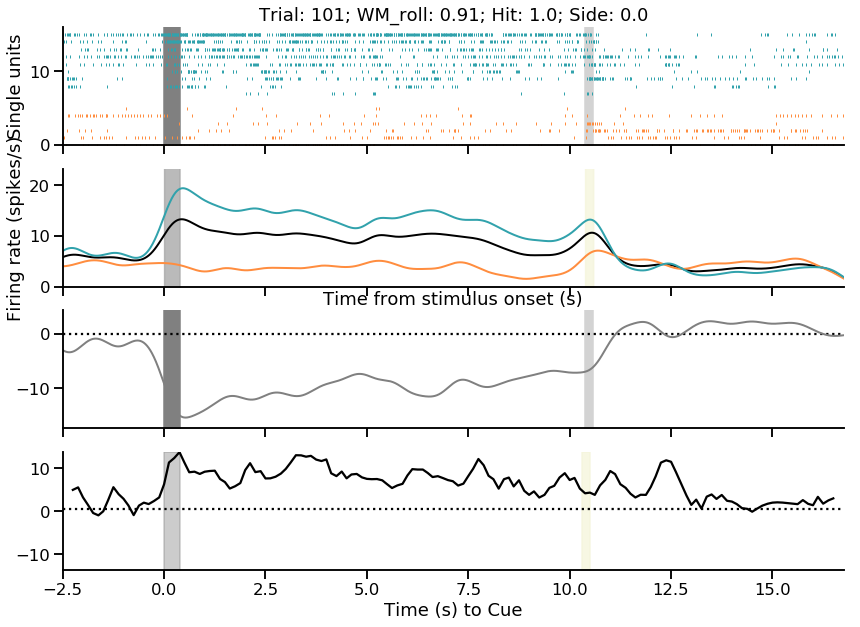

score: 0.8990005370312503 f1_score  0.9538912558013608
110 109


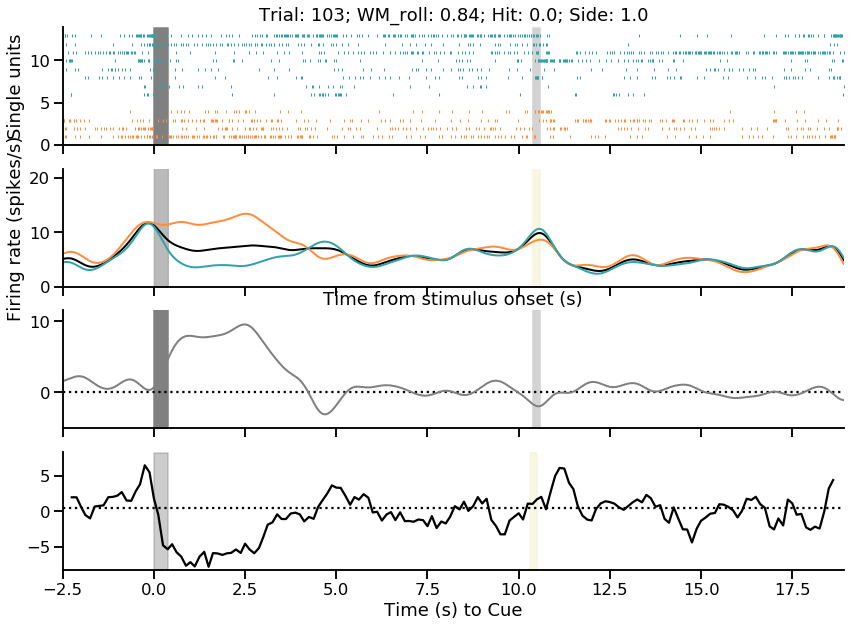

score: 0.8990007516951919 f1_score  0.9538912558013608
110 109


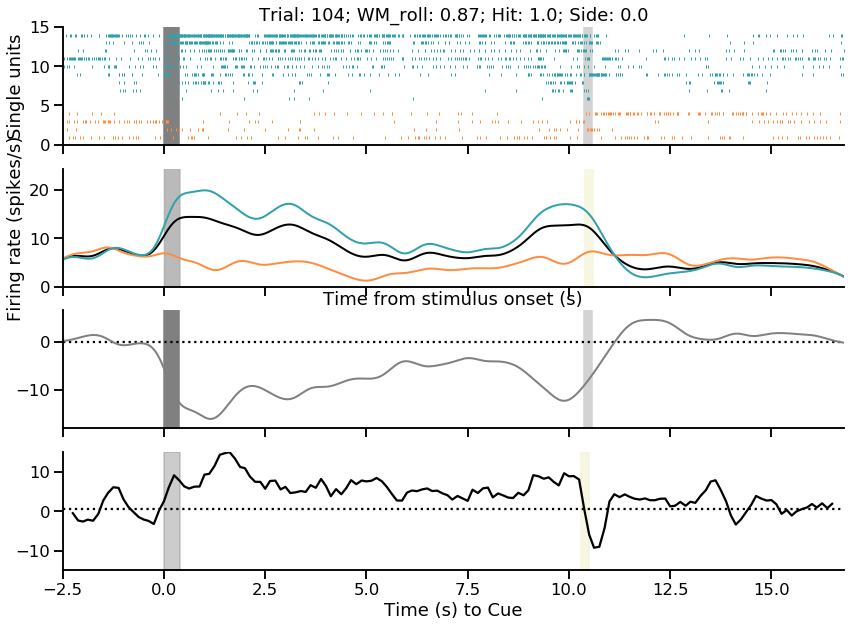

score: 0.8989948440052574 f1_score  0.9538912558013608
110 109


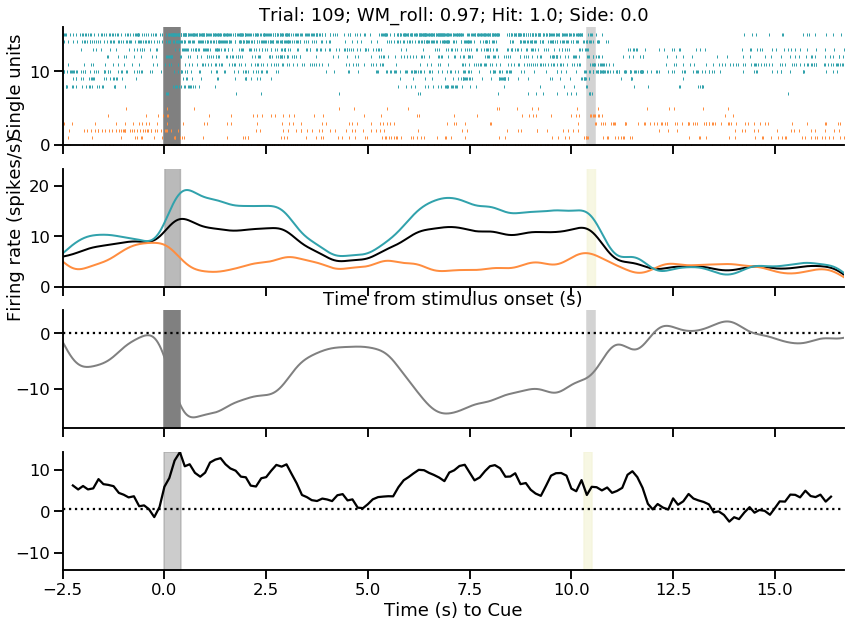

score: 0.898999370933206 f1_score  0.9538912558013608
110 109


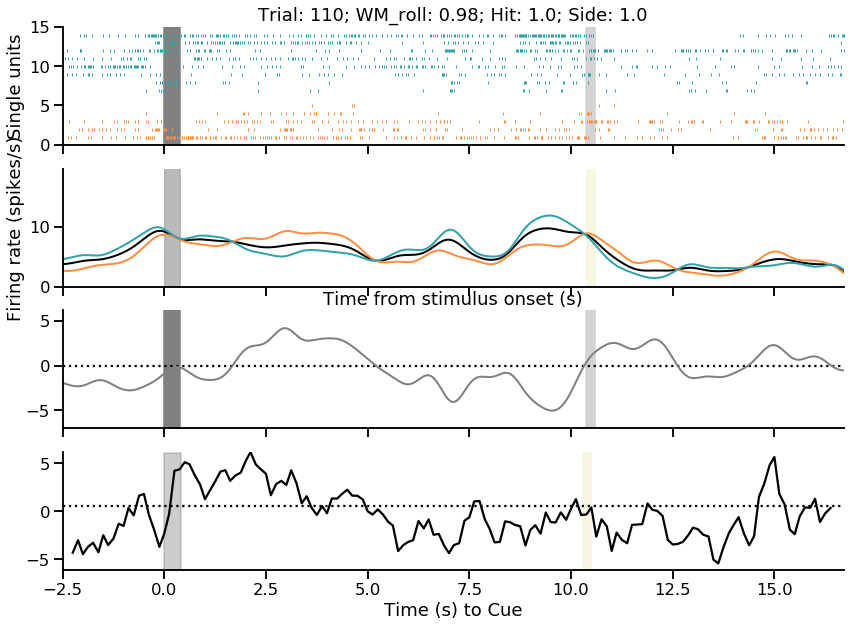

score: 0.8989993935867633 f1_score  0.9538912558013608
110 109


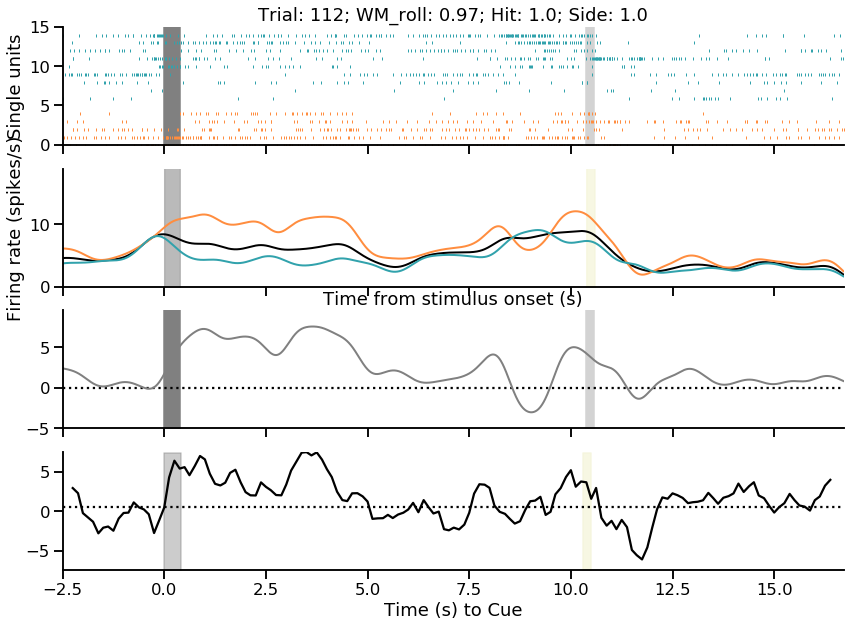

score: 0.8990103926133116 f1_score  0.9538912558013608
110 109


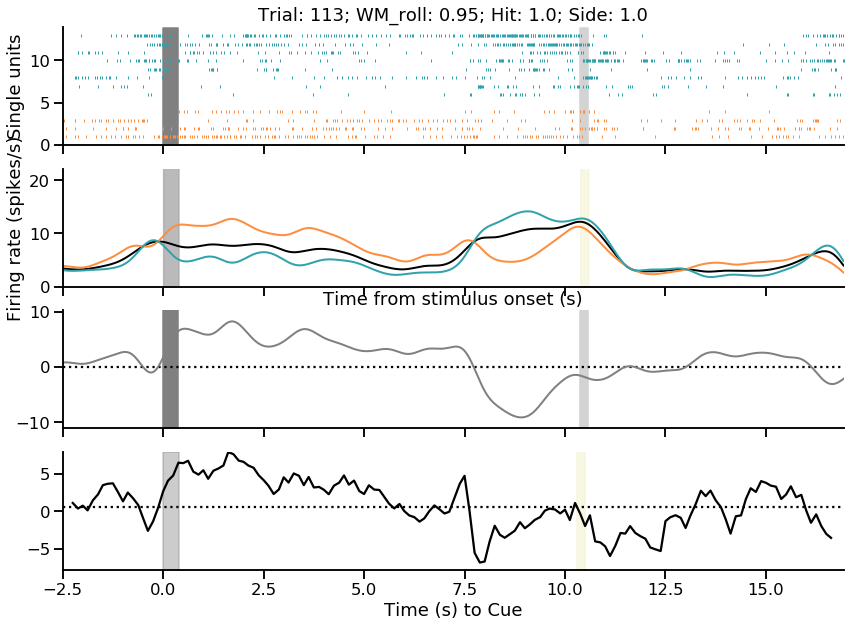

score: 0.8989966582551591 f1_score  0.9538912558013608
110 109


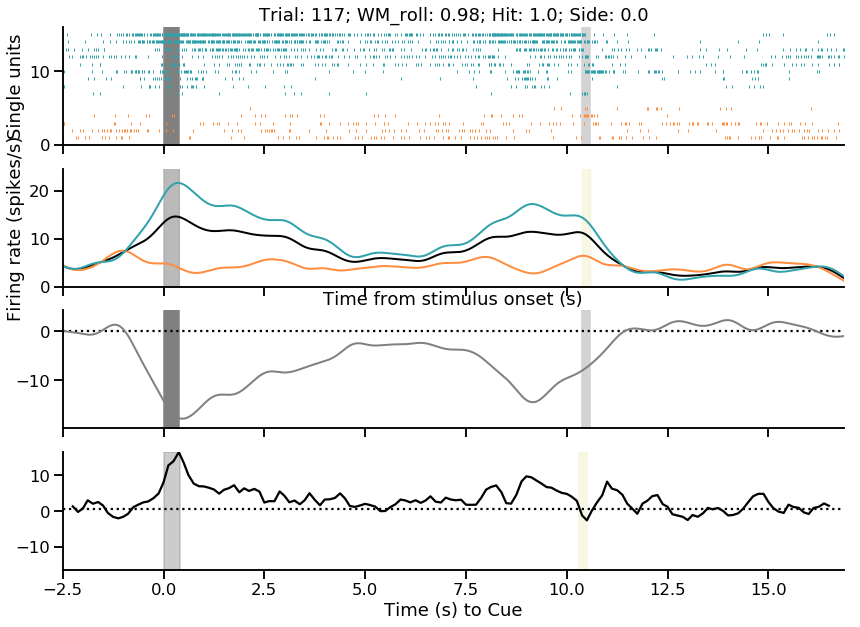

score: 0.8990091723977384 f1_score  0.9538912558013608
110 109


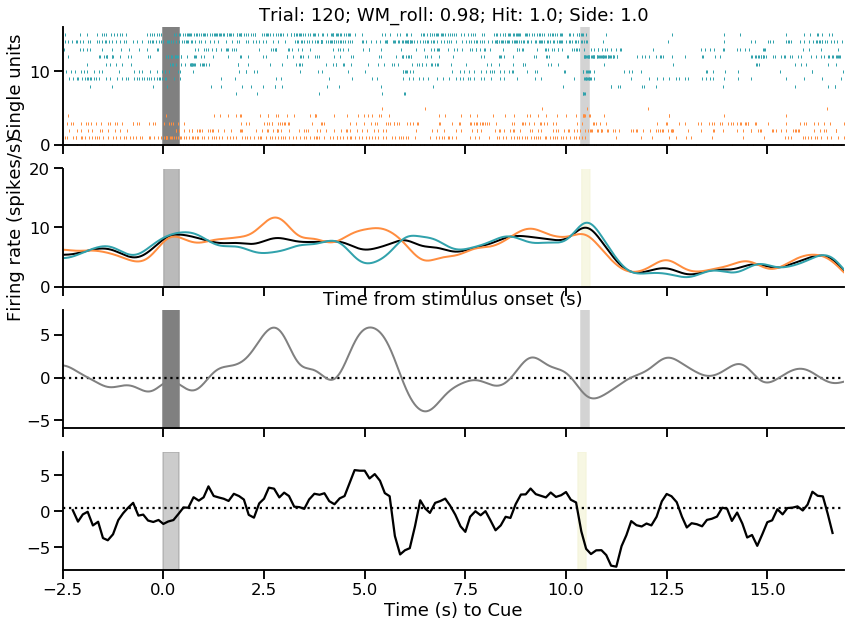

score: 0.8989953600469173 f1_score  0.9538912558013608
110 109


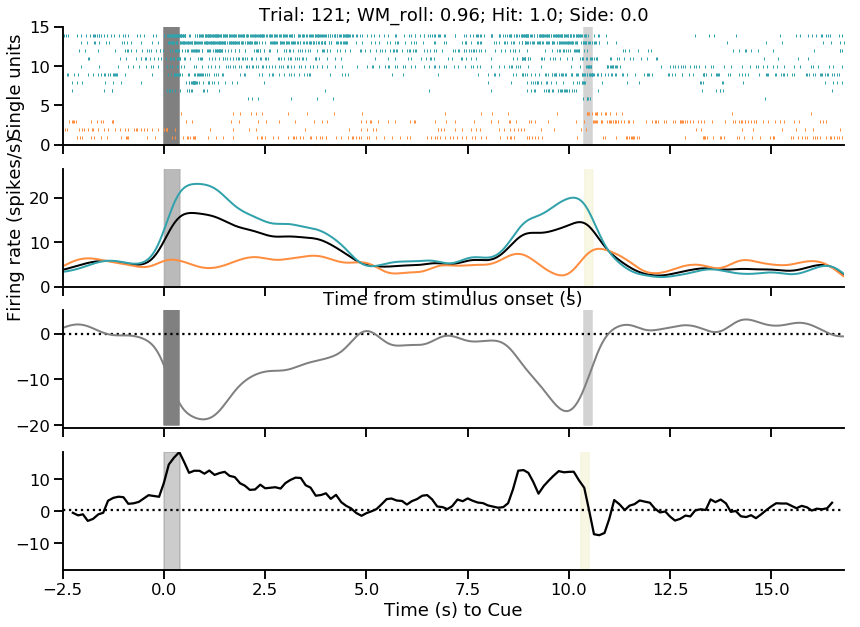

score: 0.8989995254554335 f1_score  0.9538912558013608
110 109


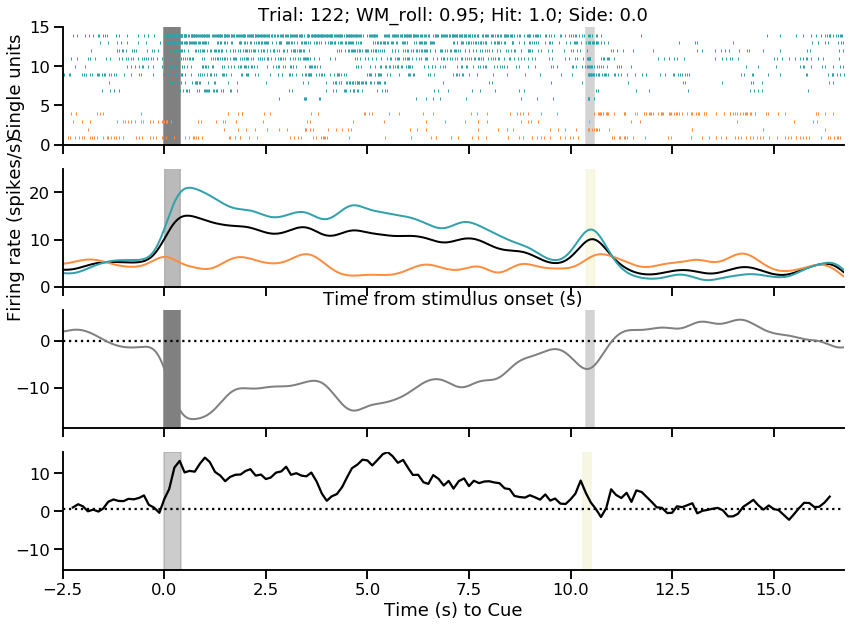

score: 0.8990000426843691 f1_score  0.9538912558013608
110 109


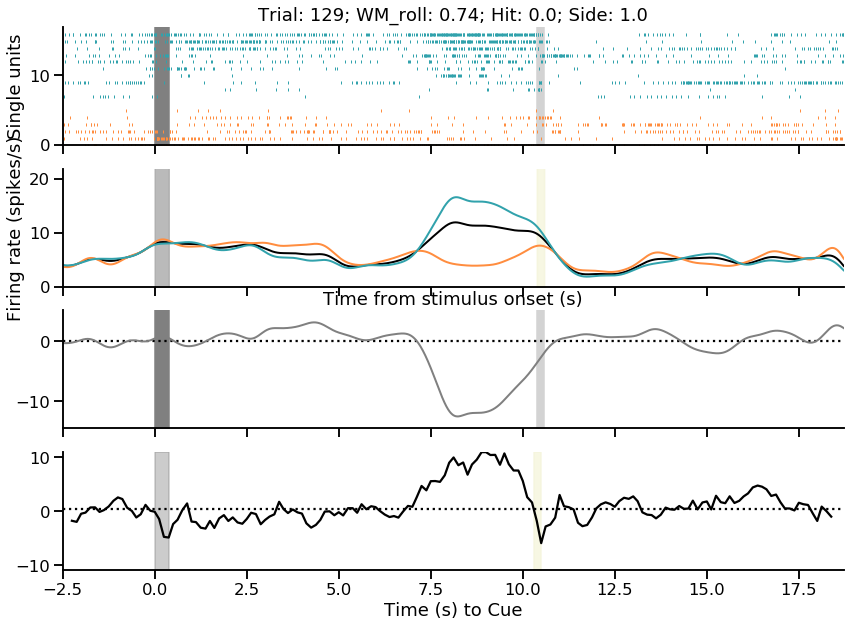

score: 0.8989956304177791 f1_score  0.9538912558013608
110 109


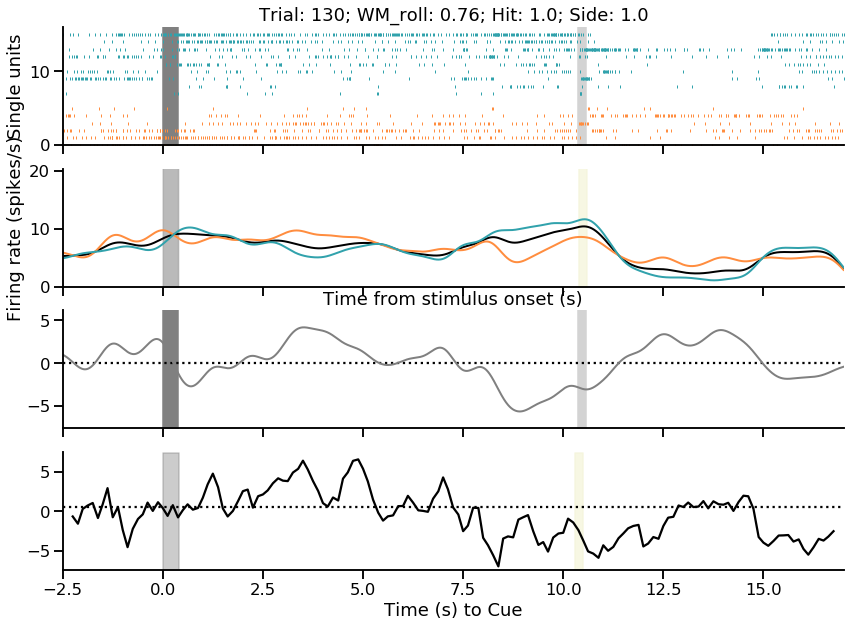

score: 0.8989998749711254 f1_score  0.9538912558013608
110 109


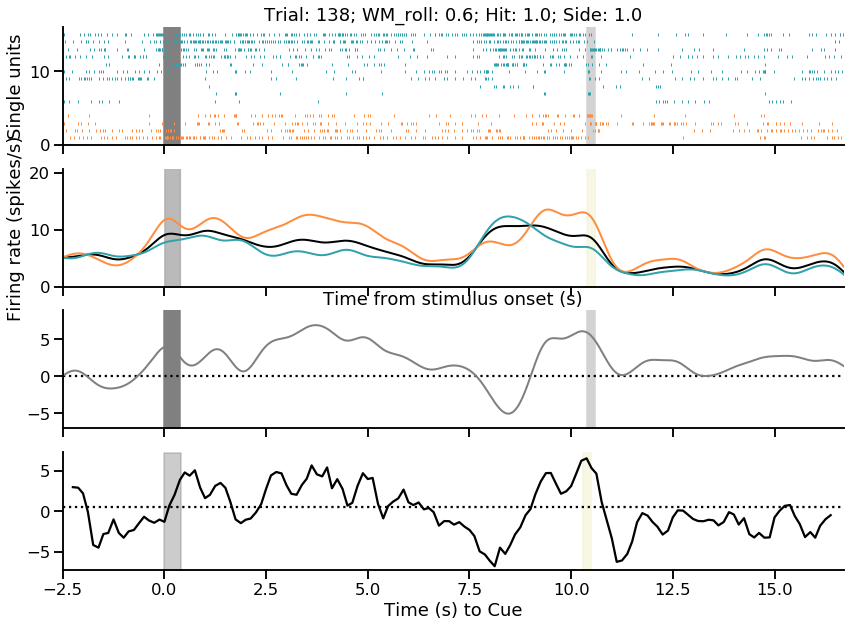

score: 0.898997215937117 f1_score  0.9538912558013608
110 109


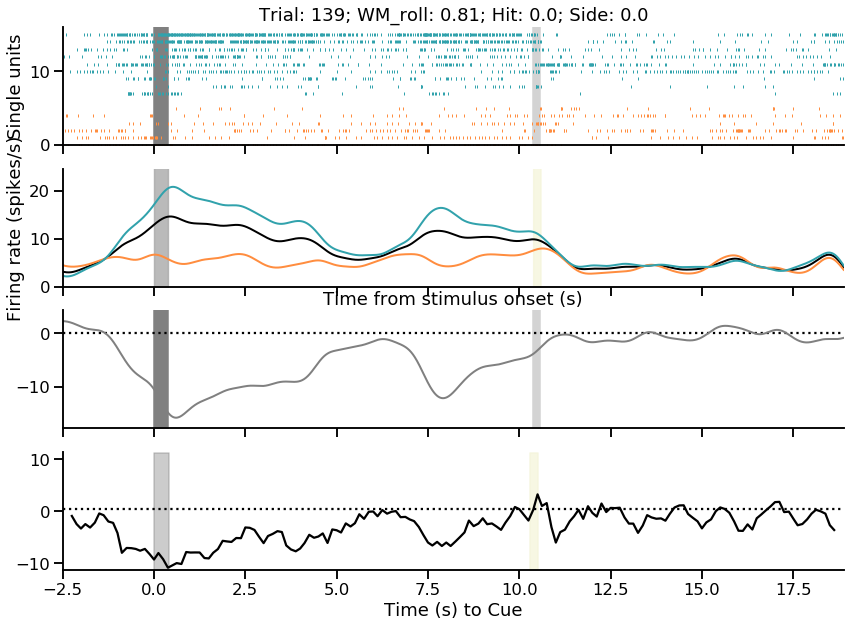

score: 0.8990021036874503 f1_score  0.9538912558013608
110 109


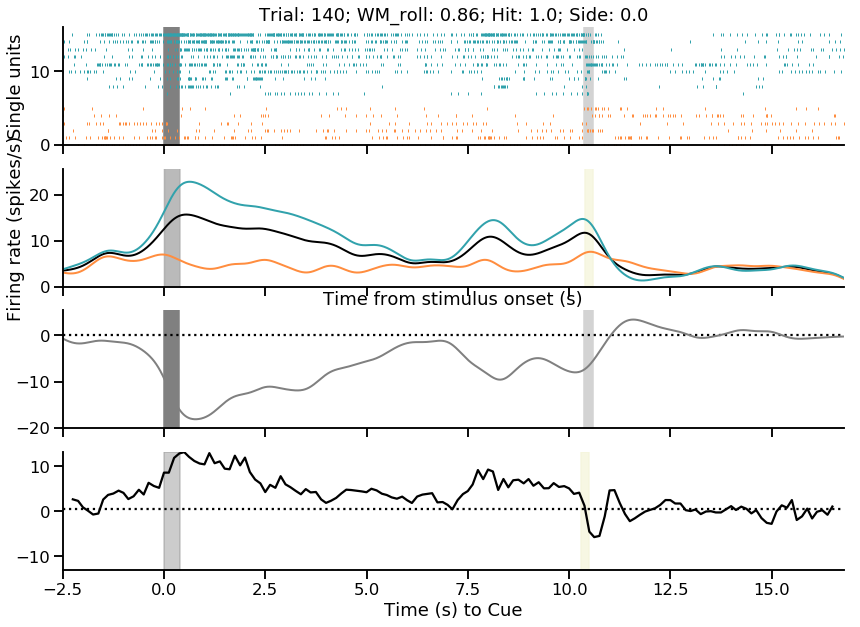

score: 0.8989964142780298 f1_score  0.9538912558013608
110 109


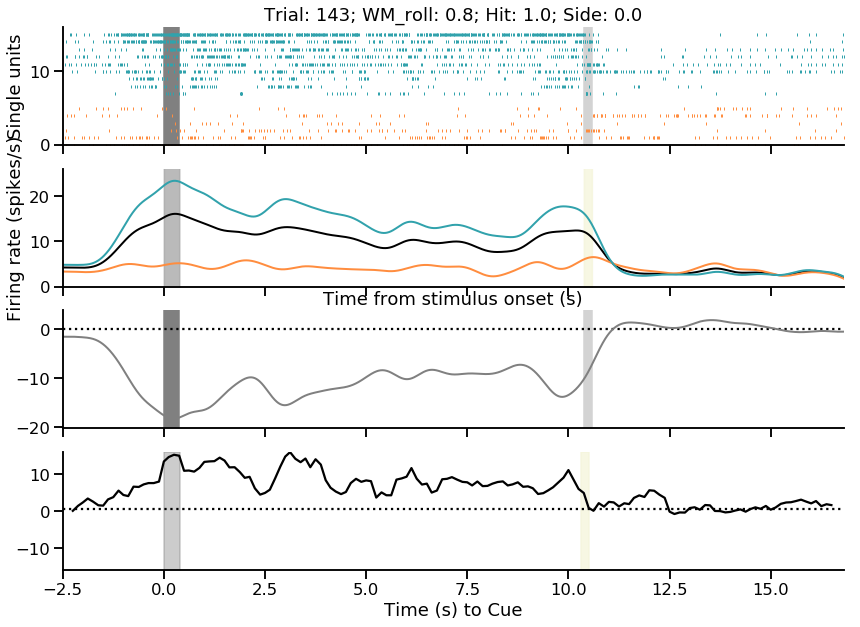

score: 0.8990061967443247 f1_score  0.9538912558013608
110 109


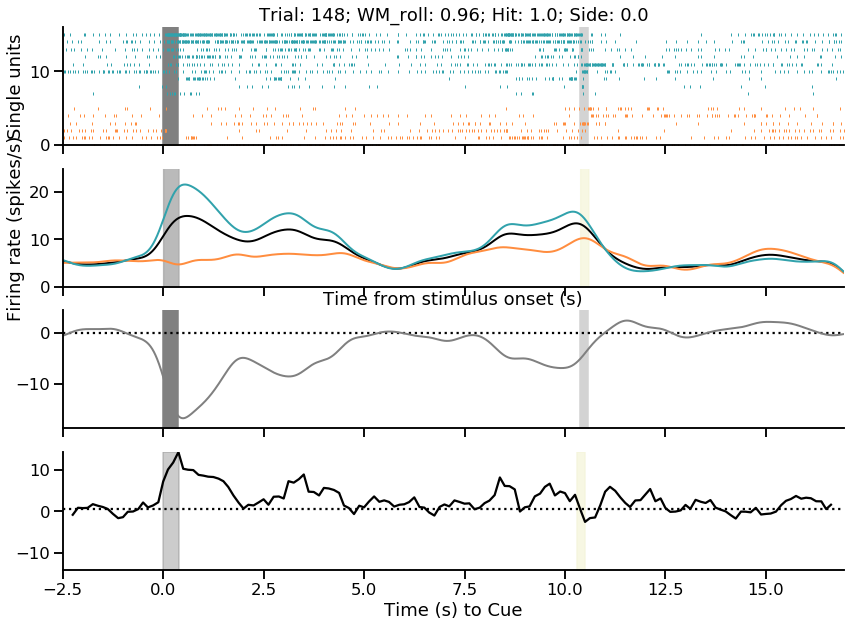

score: 0.8990085246387121 f1_score  0.9538912558013608
110 109


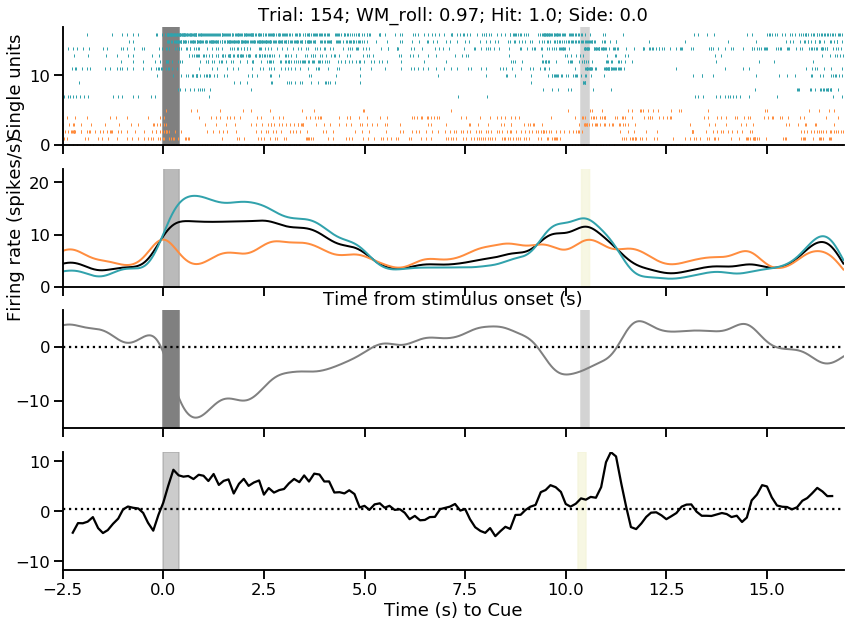

score: 0.8989970754107309 f1_score  0.9538912558013608
110 109


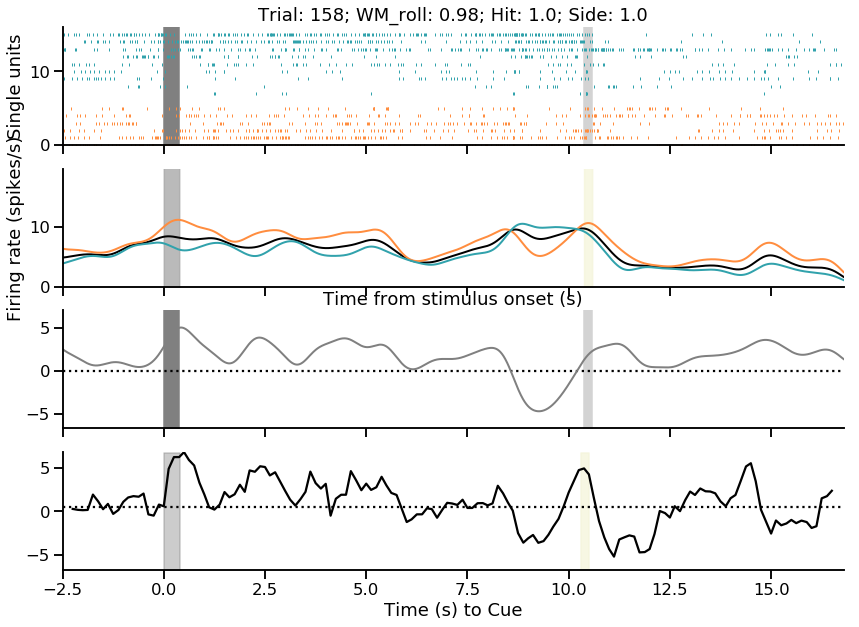

score: 0.8990023064148508 f1_score  0.9538912558013608
110 109


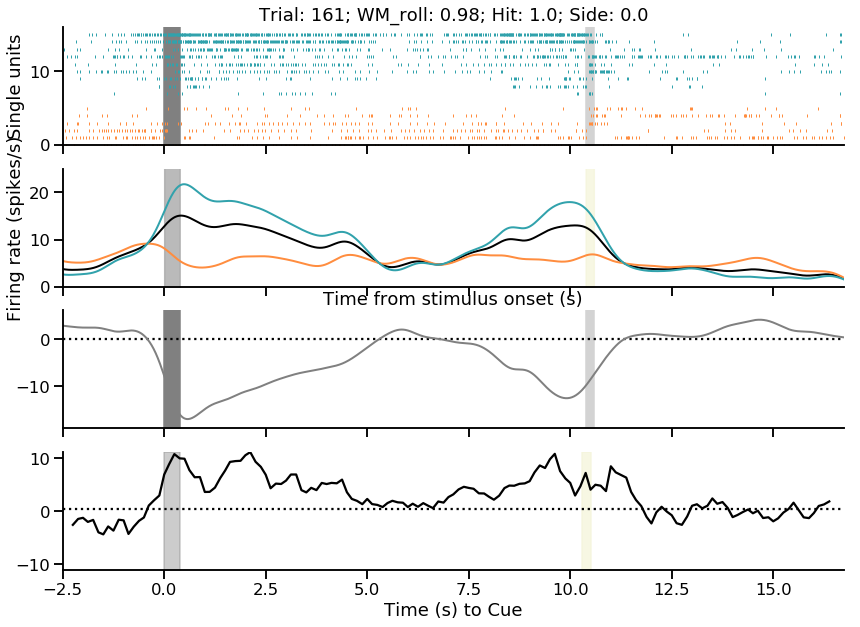

score: 0.8989994748499729 f1_score  0.9538912558013608
110 109


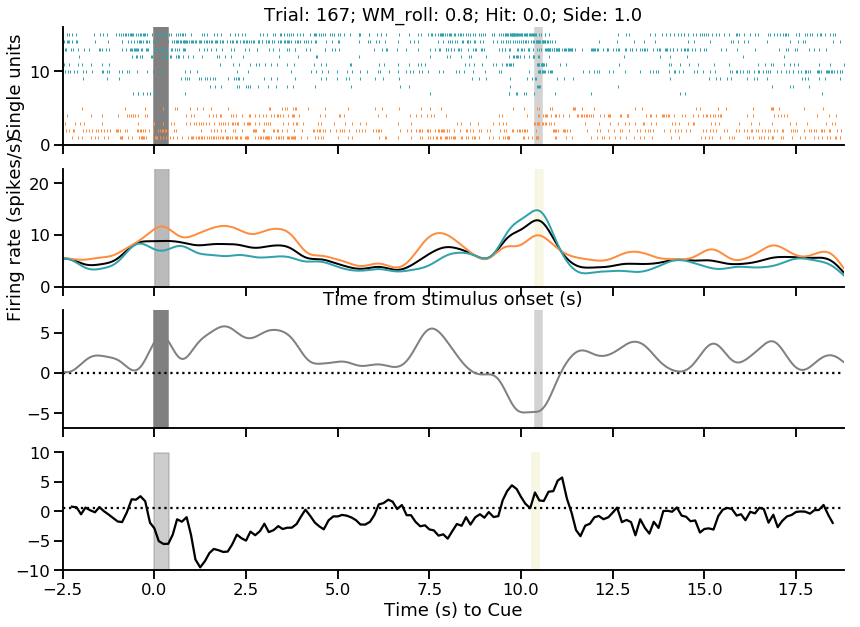

score: 0.8989951101604162 f1_score  0.9538912558013608
110 109


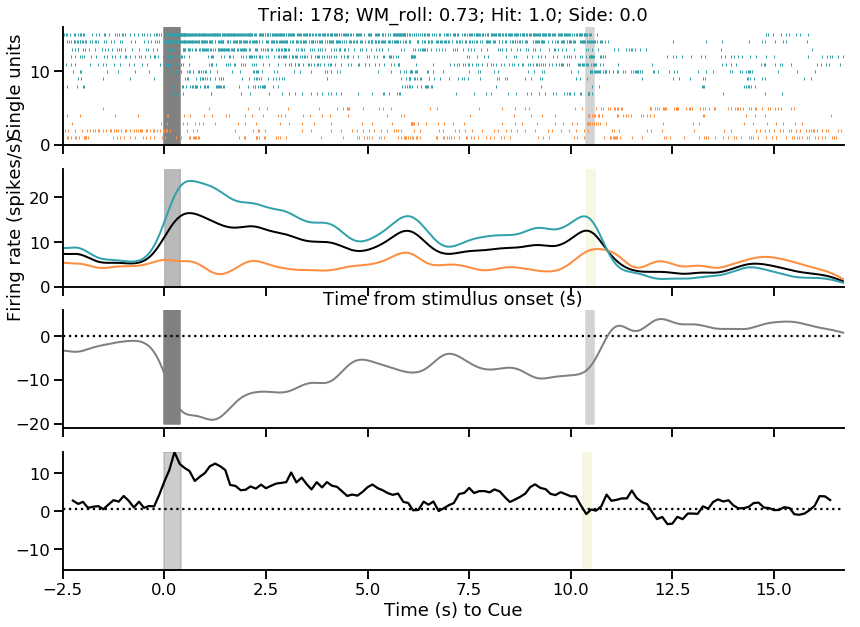

score: 0.8989986076442457 f1_score  0.9538912558013608
110 109


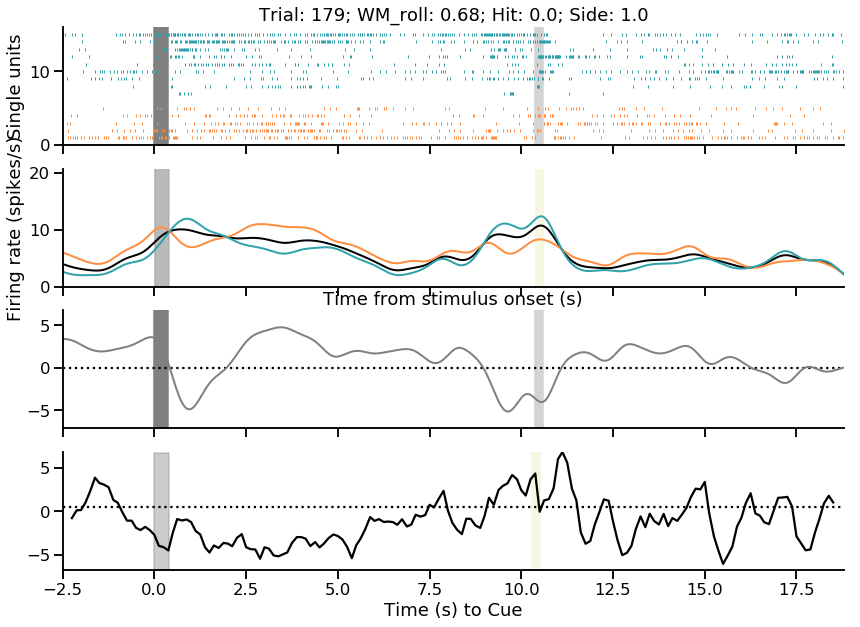

score: 0.8990002469612105 f1_score  0.9538912558013608
110 109


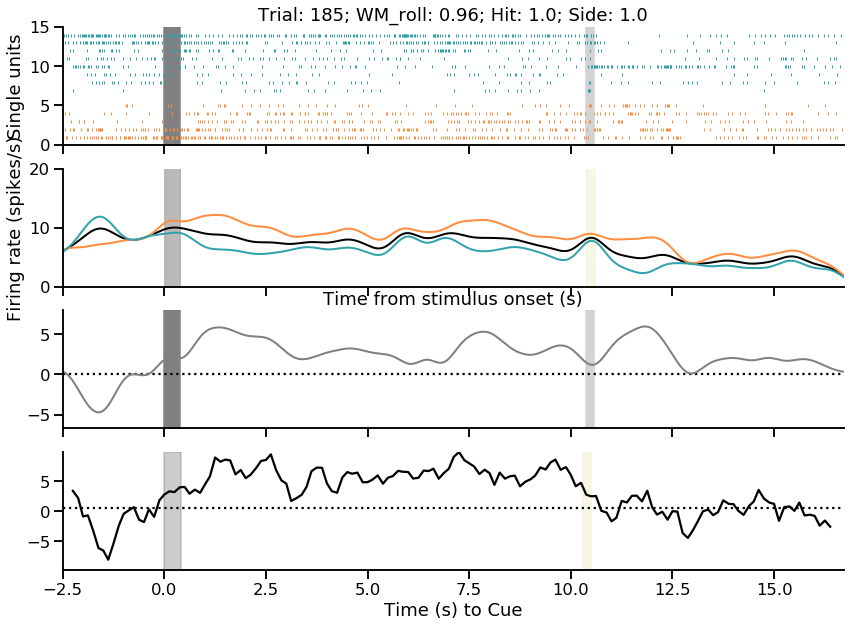

score: 0.8989951448470985 f1_score  0.9538912558013608
110 109


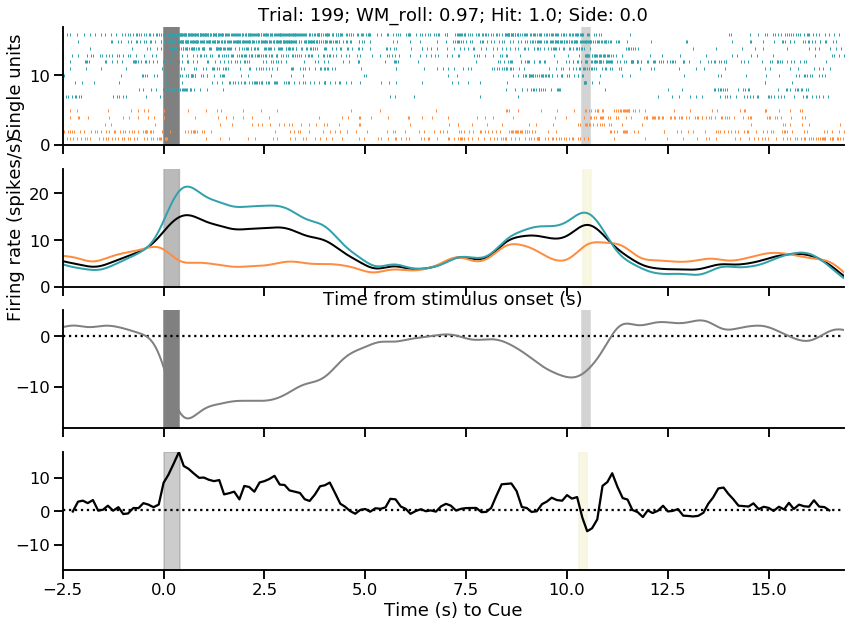

score: 0.8989972484540717 f1_score  0.9538912558013608
110 109


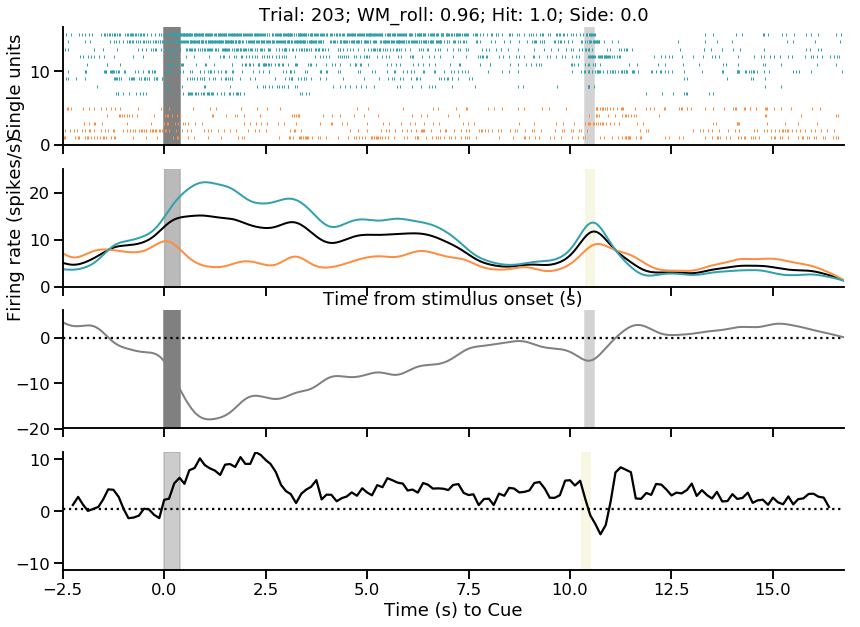

score: 0.8990016720357684 f1_score  0.9538912558013608
110 109


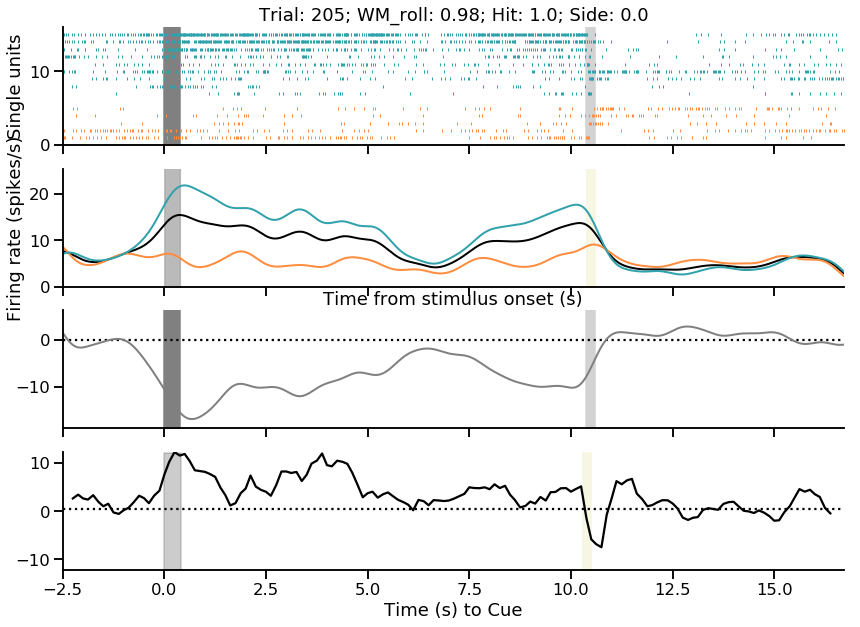

score: 0.8990001041079084 f1_score  0.9538912558013608
110 109


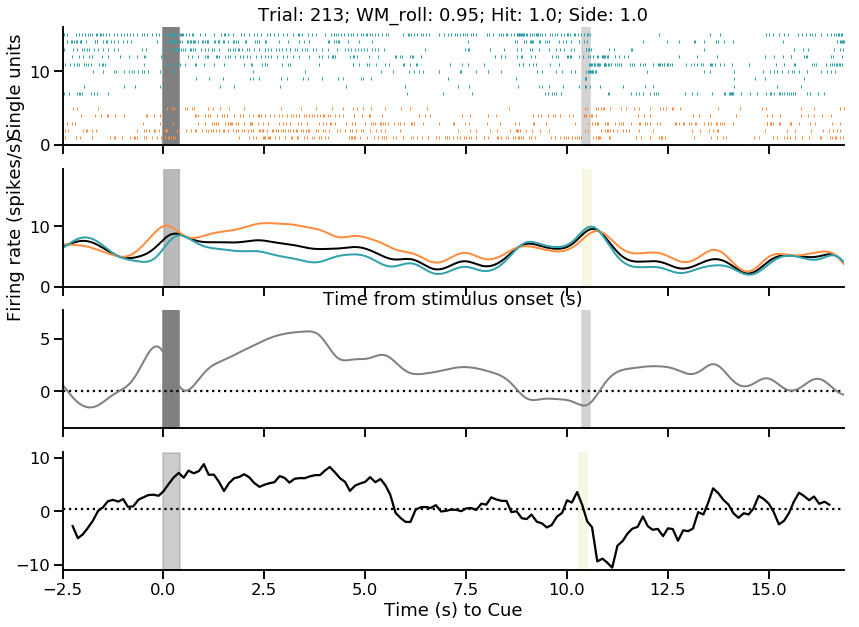

score: 0.899009071253933 f1_score  0.9538912558013608
110 109


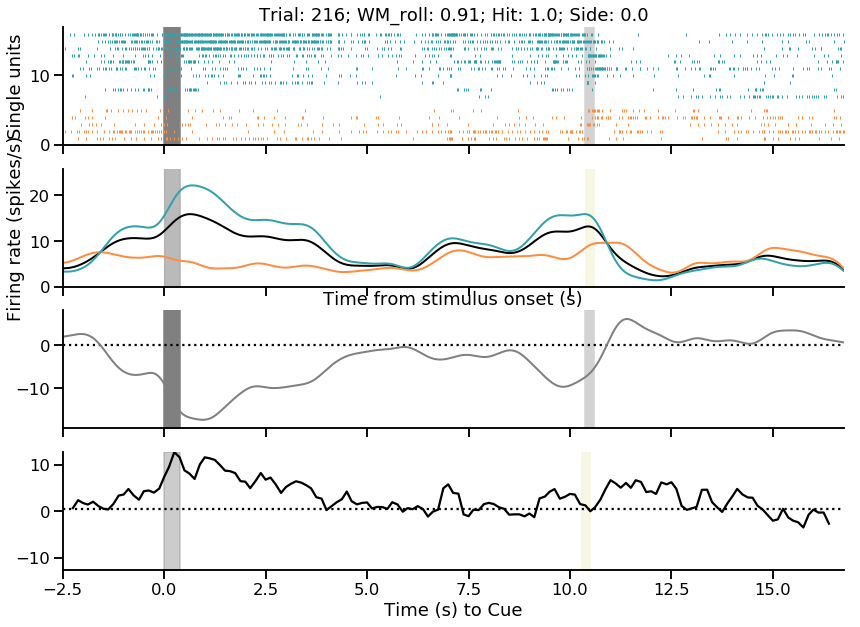

score: 0.8989904789902222 f1_score  0.9538912558013608
110 109


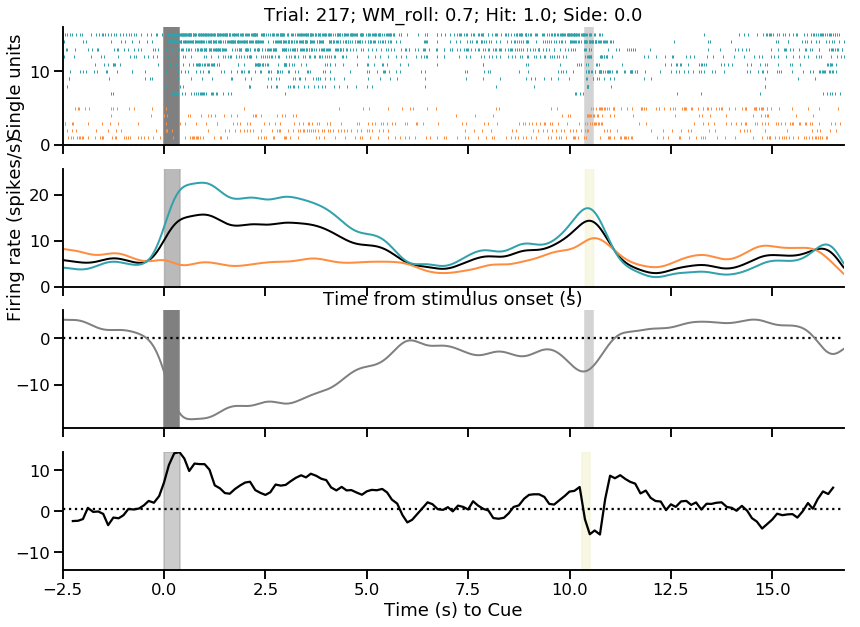

score: 0.8990015262783494 f1_score  0.9538912558013608
110 109


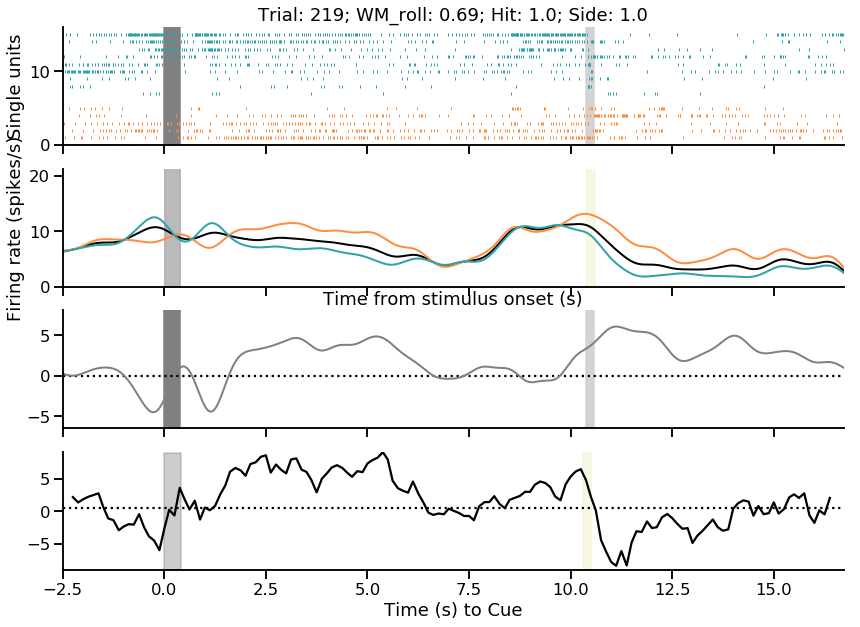

score: 0.8990104216484328 f1_score  0.9538912558013608
110 109


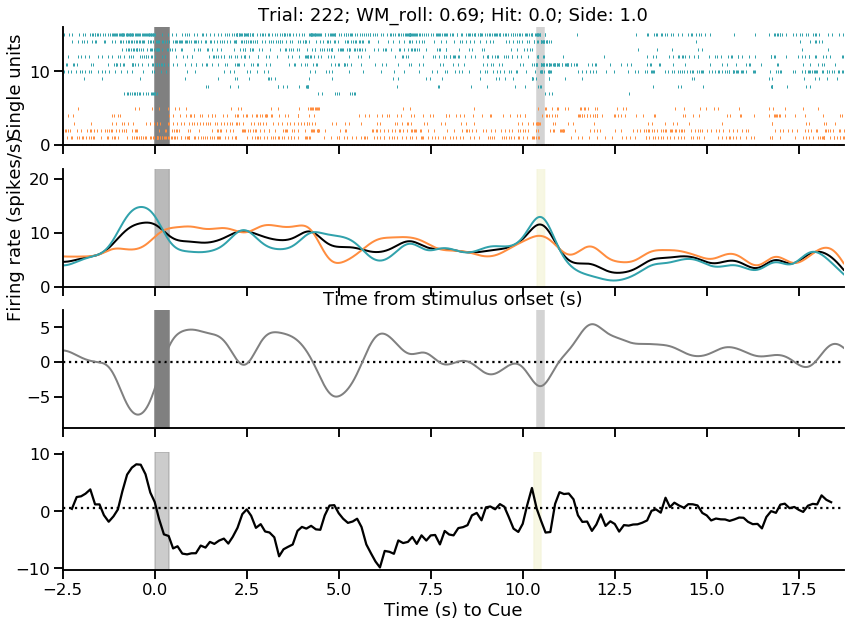

score: 0.8990004806895107 f1_score  0.9538912558013608
110 109


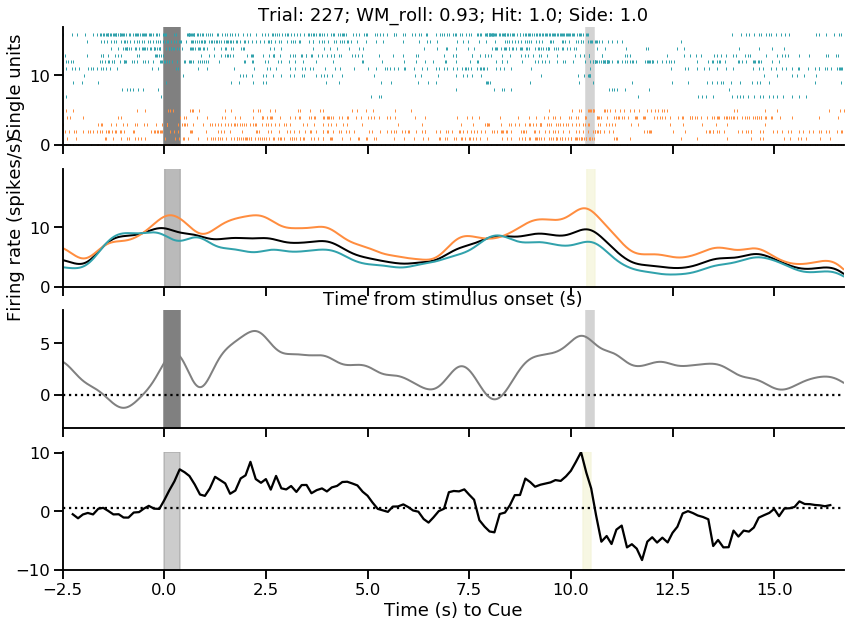

score: 0.8990103735294782 f1_score  0.9538912558013608
110 109


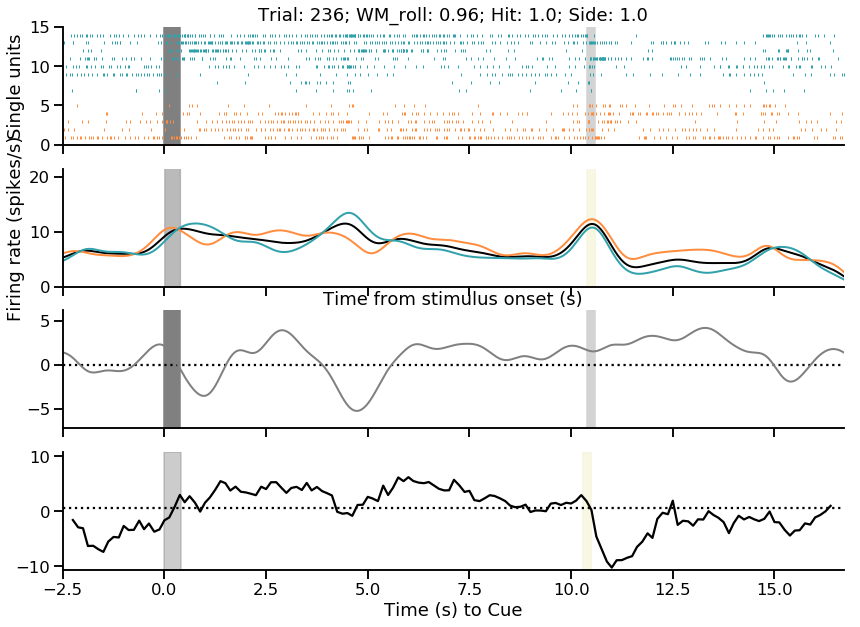

score: 0.8989985363045045 f1_score  0.9538912558013608
110 109


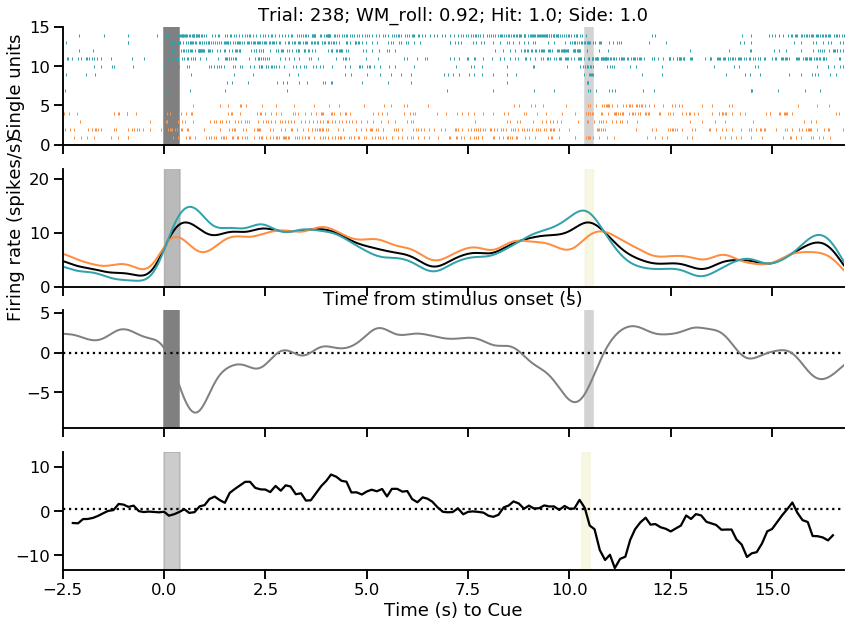

score: 0.8990019468577495 f1_score  0.9538912558013608
110 109


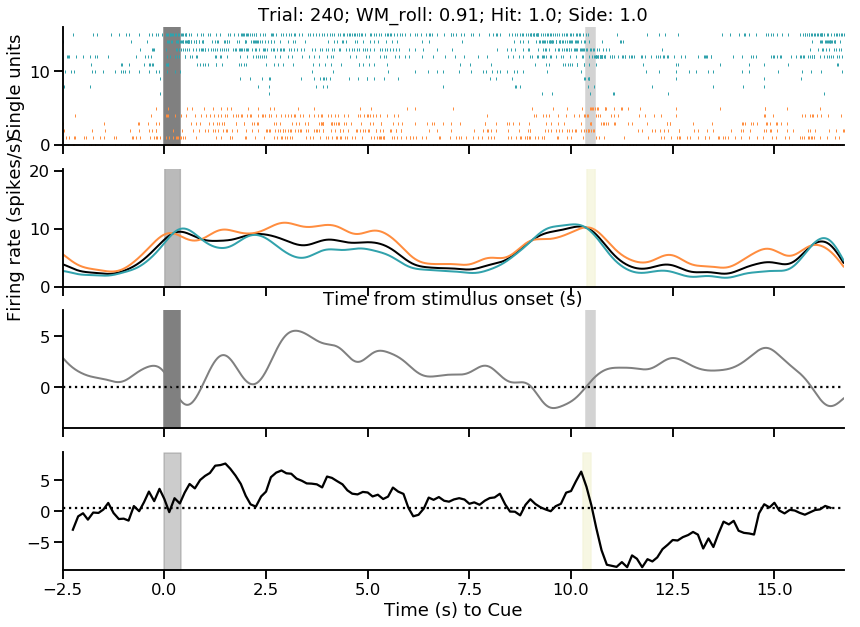

score: 0.8989997686711346 f1_score  0.9538912558013608
110 109


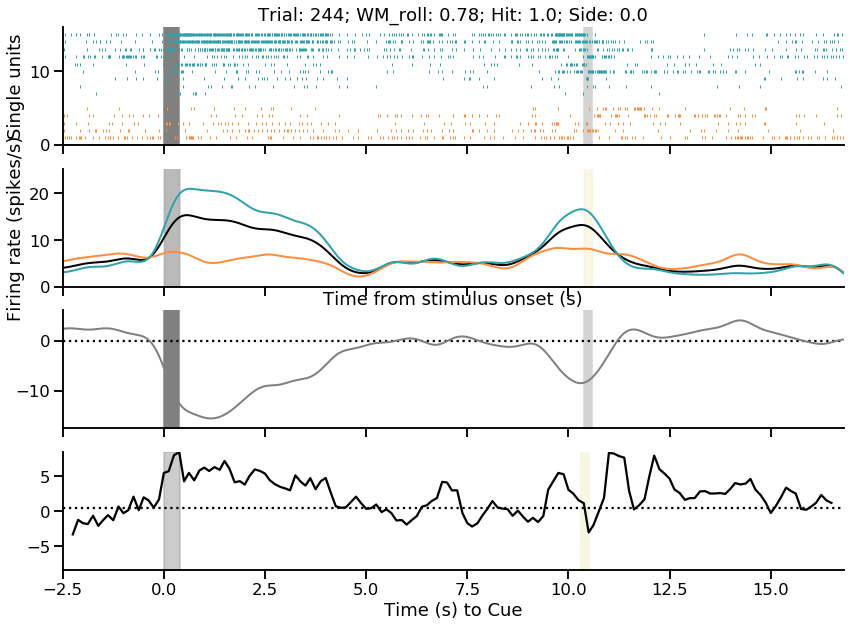

score: 0.8989993620197075 f1_score  0.9538912558013608
110 109


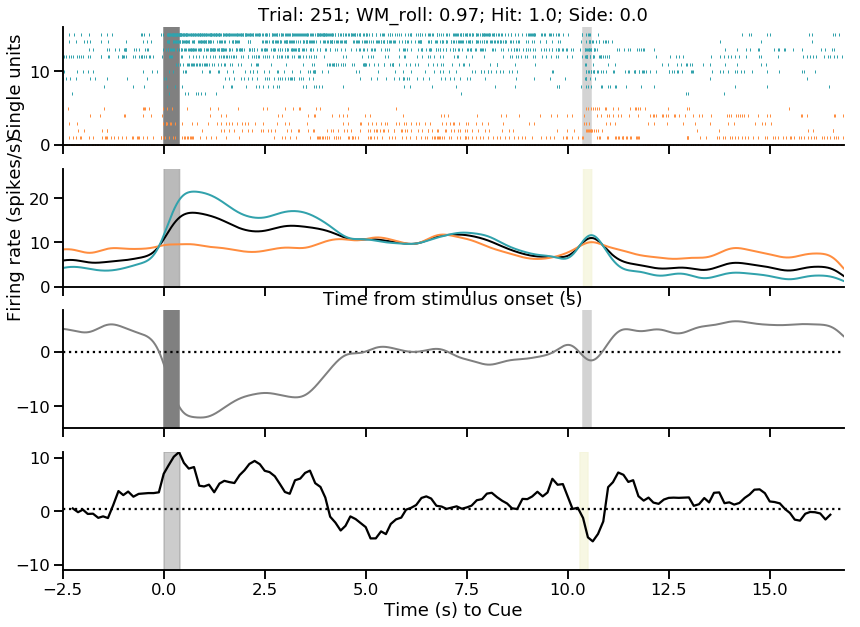

score: 0.8989961113113891 f1_score  0.9538912558013608
110 109


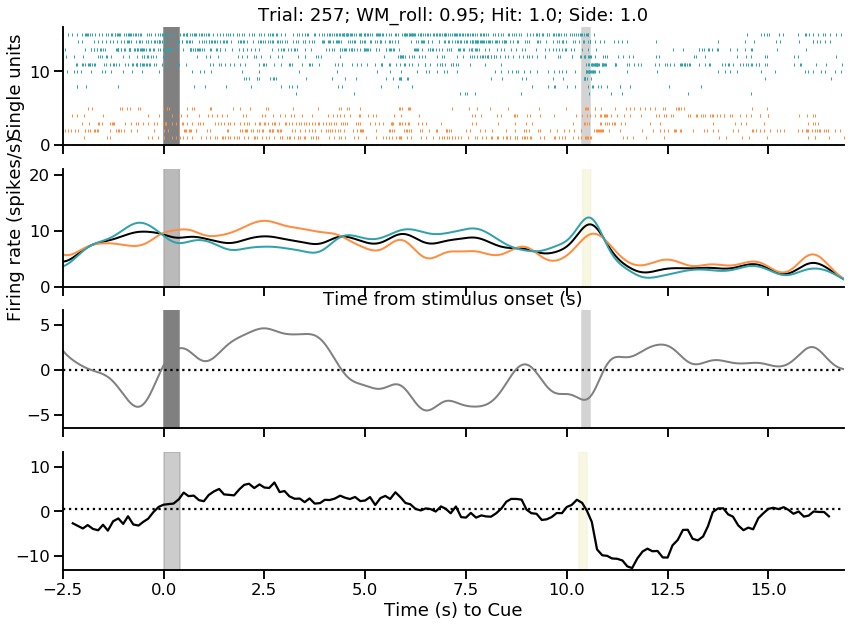

score: 0.8989958844478804 f1_score  0.9538912558013608
110 109


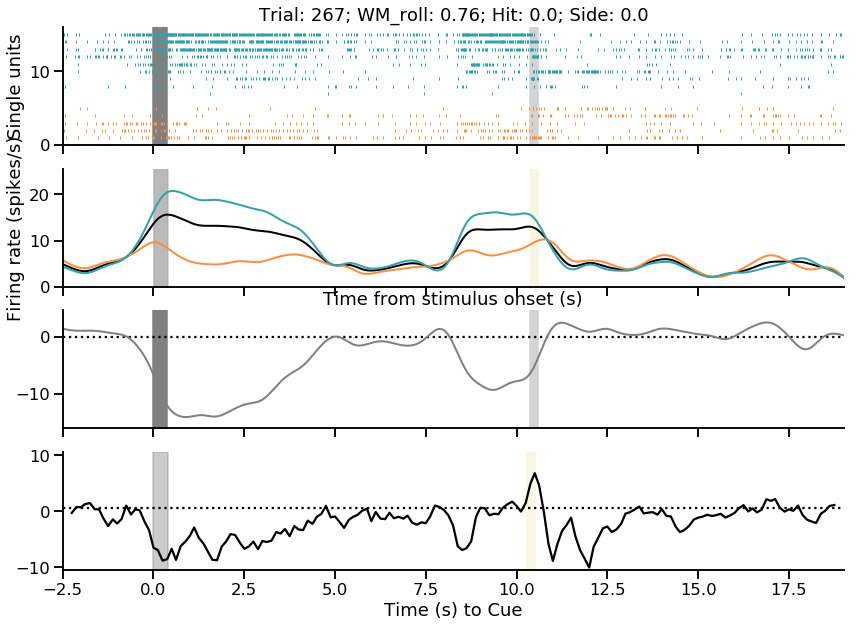

score: 0.8990105402222959 f1_score  0.9538912558013608
110 109


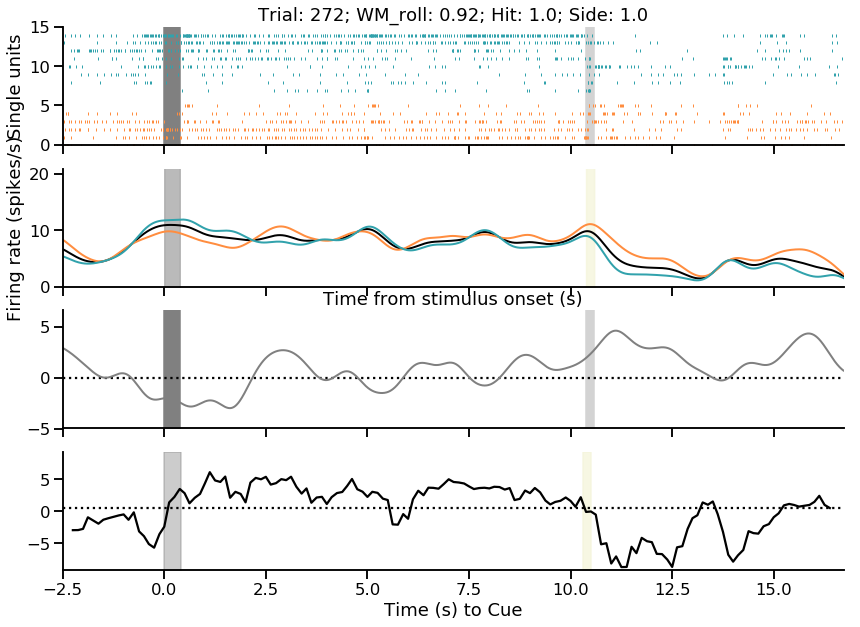

score: 0.8990102835735684 f1_score  0.9538912558013608
110 109


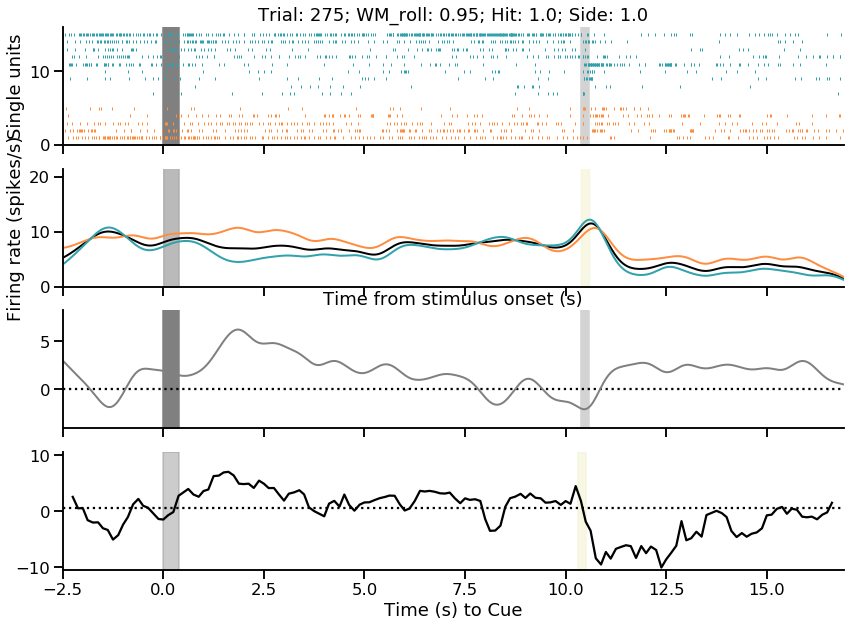

score: 0.8990038335068121 f1_score  0.9538912558013608
110 109


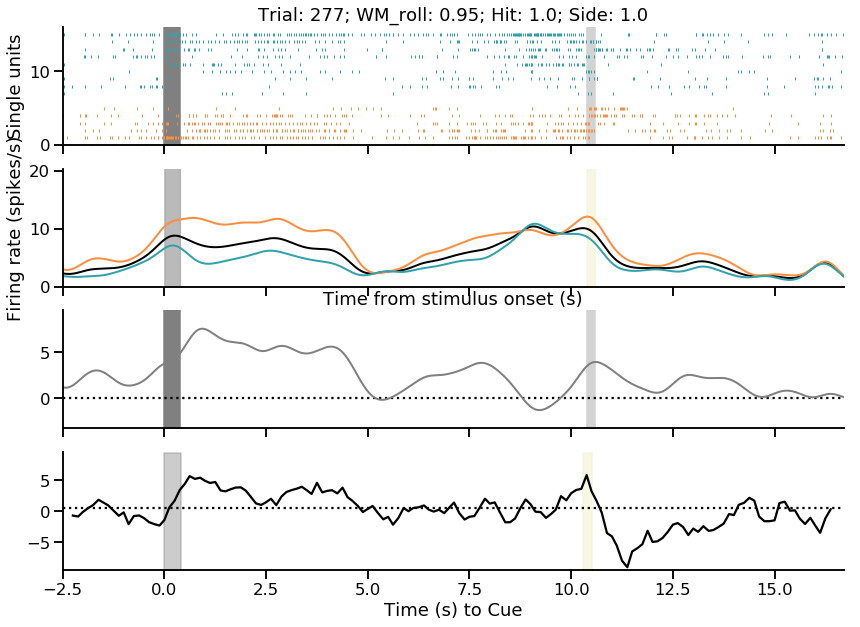

score: 0.8989965414656932 f1_score  0.9538912558013608
110 109


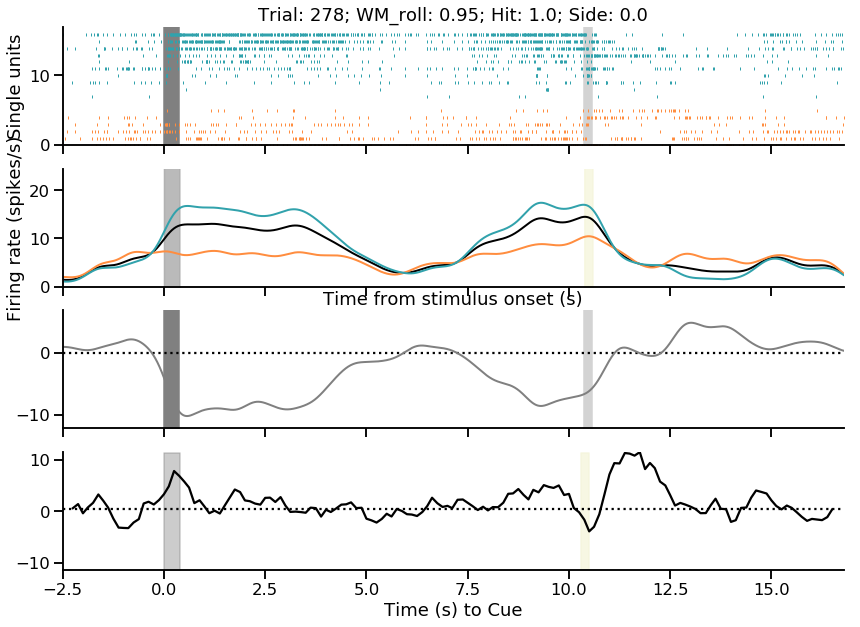

score: 0.899004015148477 f1_score  0.9538912558013608
110 109


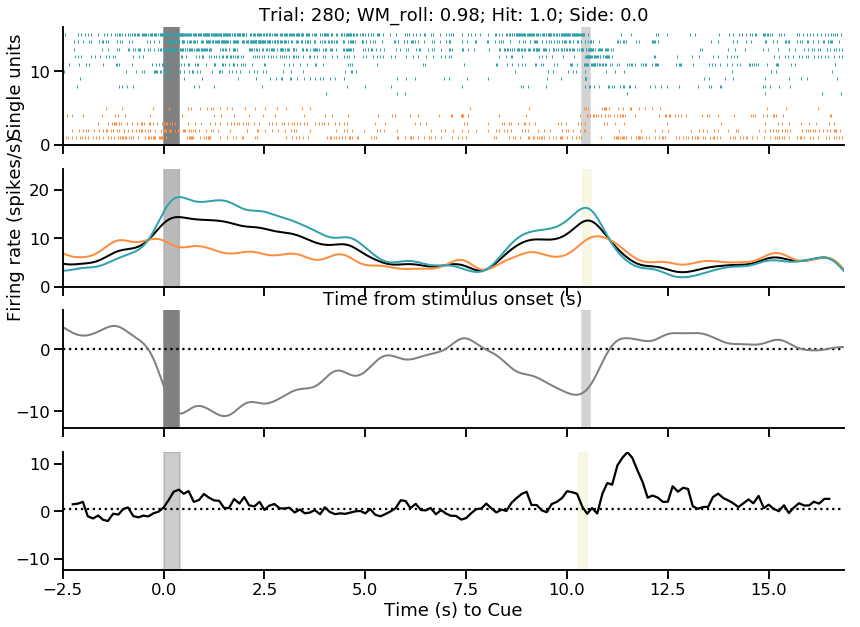

score: 0.8989957007422277 f1_score  0.9538912558013608
110 109


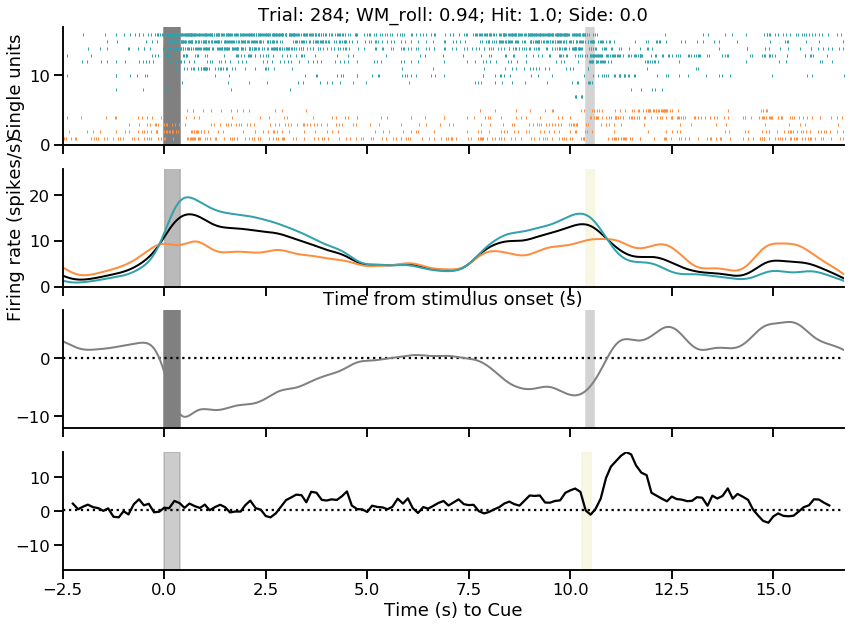

score: 0.8990094376704181 f1_score  0.9538912558013608
110 109


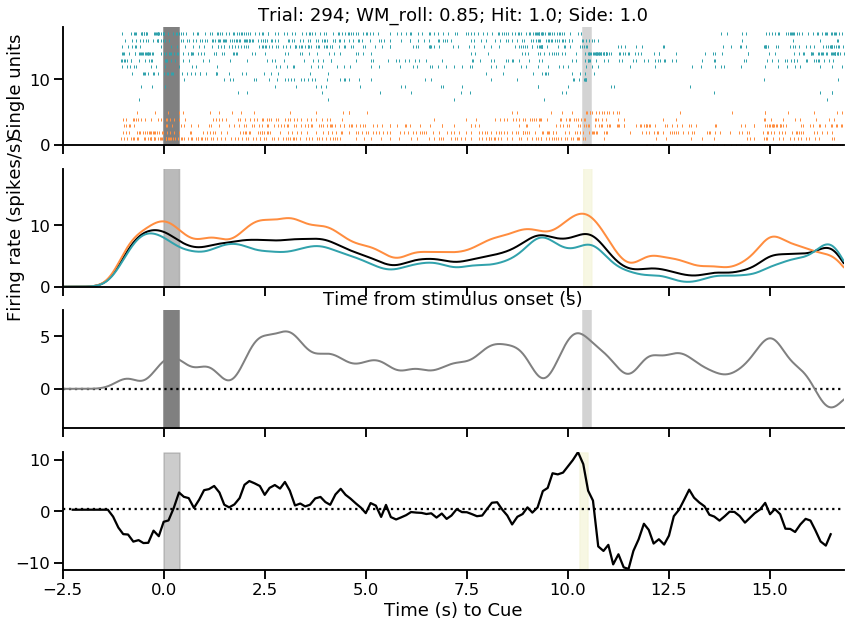

score: 0.8989974483757655 f1_score  0.9538912558013608
110 109


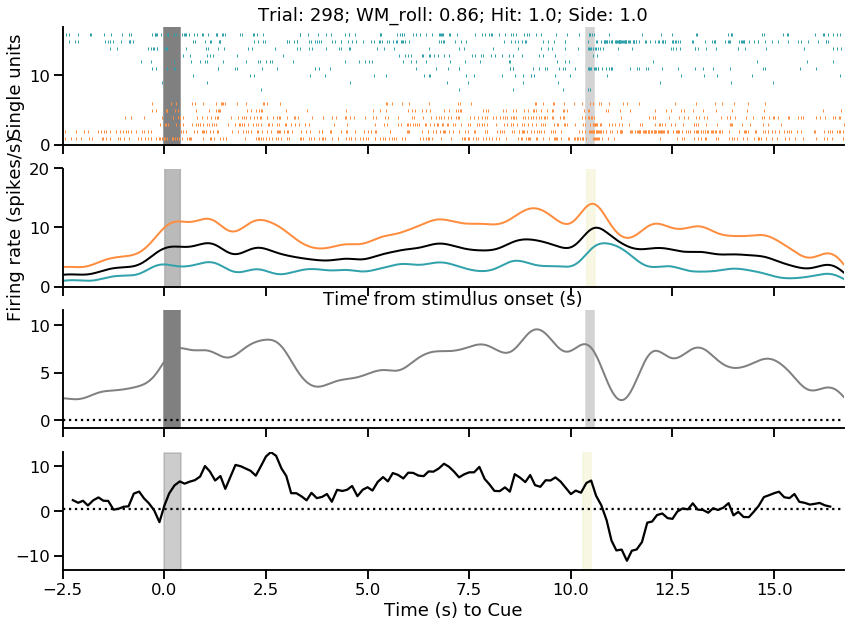

score: 0.8989983716571253 f1_score  0.9538912558013608
110 109


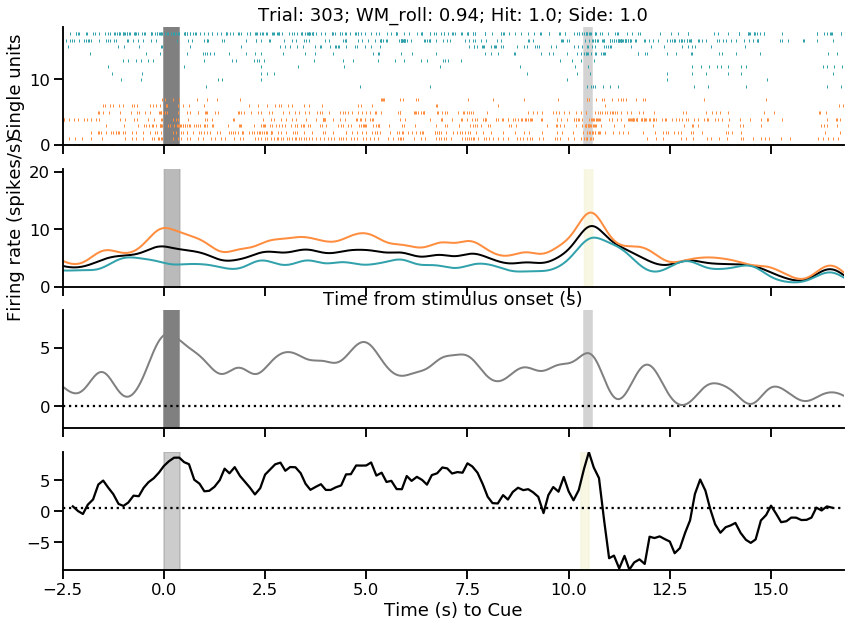

score: 0.8989979399072064 f1_score  0.9538912558013608
110 109


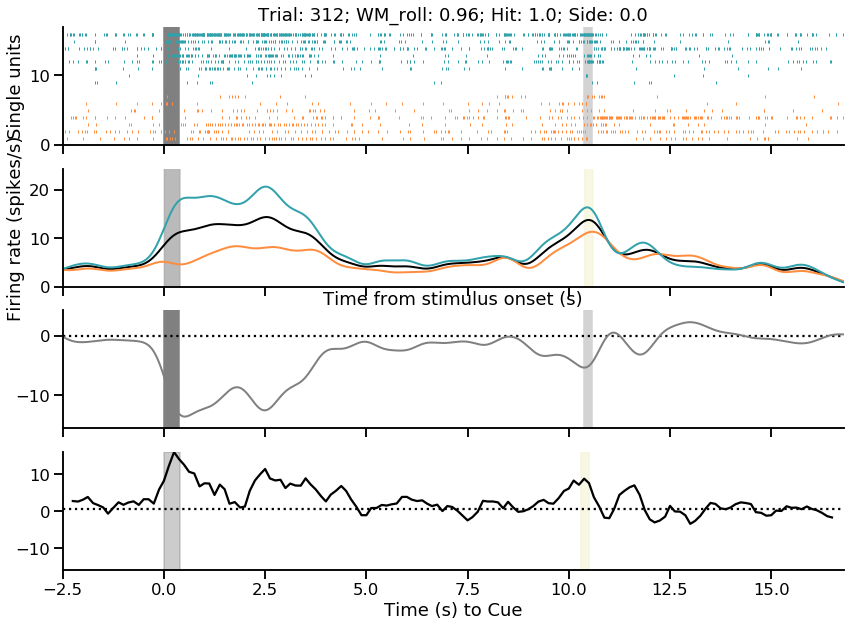

score: 0.8989991798337849 f1_score  0.9538912558013608
110 109


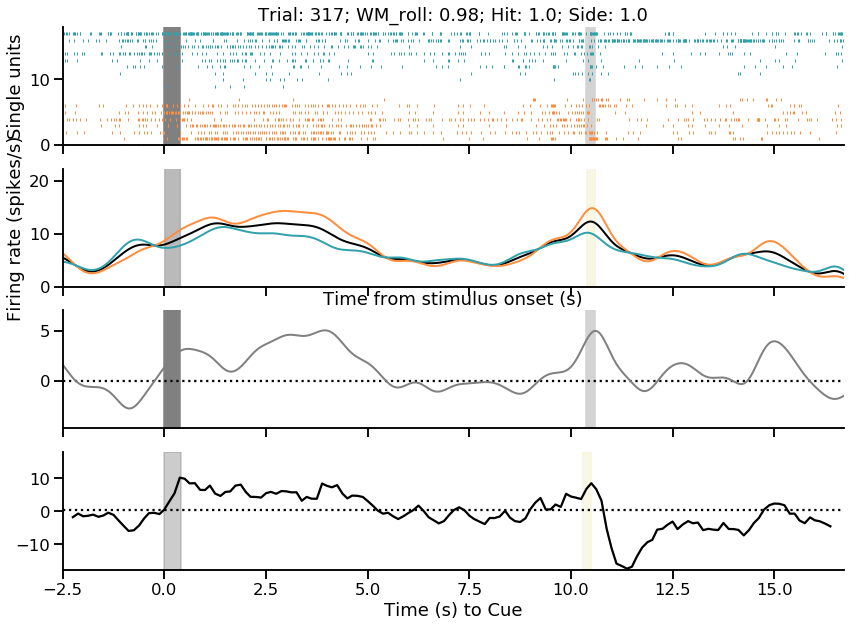

score: 0.8989997055201507 f1_score  0.9538912558013608
110 109


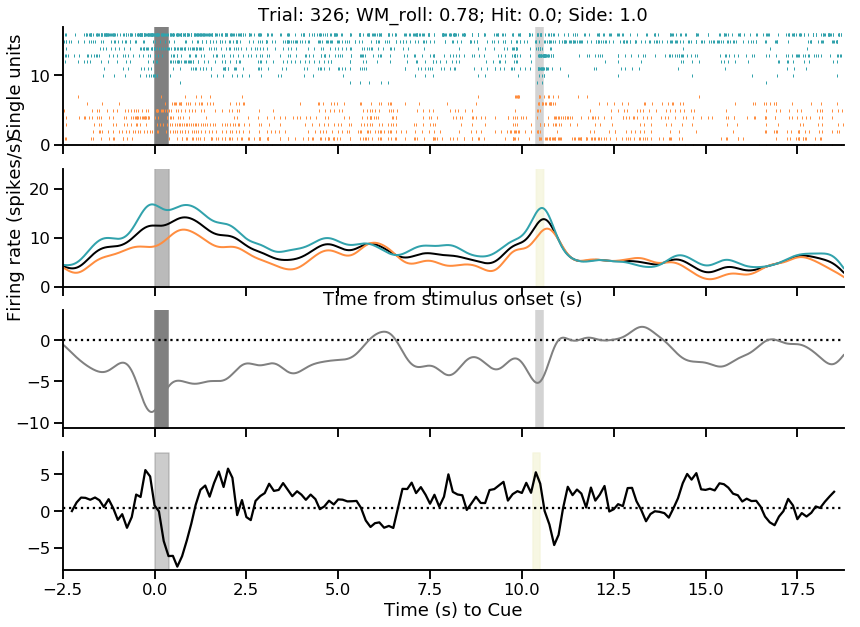

score: 0.8990090614445039 f1_score  0.9538912558013608
110 109


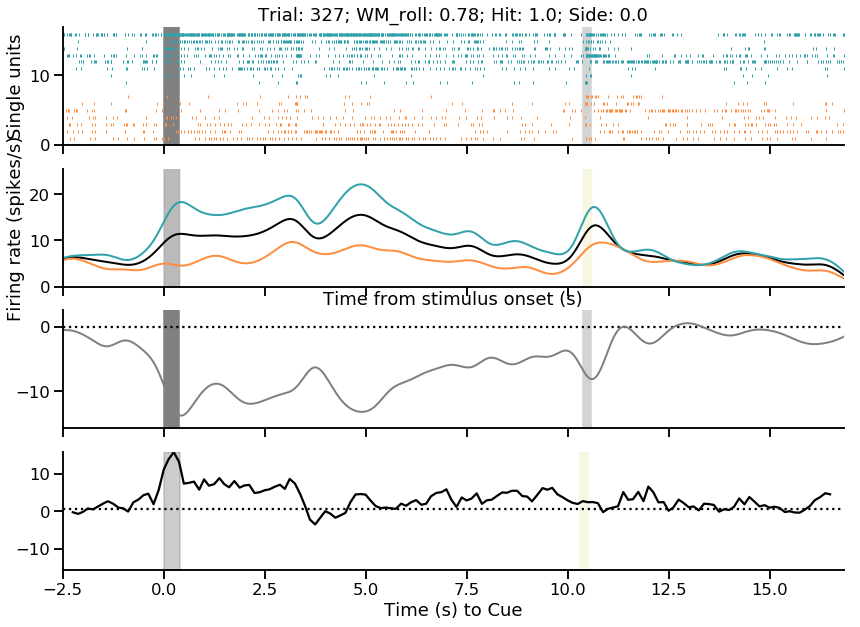

score: 0.898987037997721 f1_score  0.9538912558013608
110 109


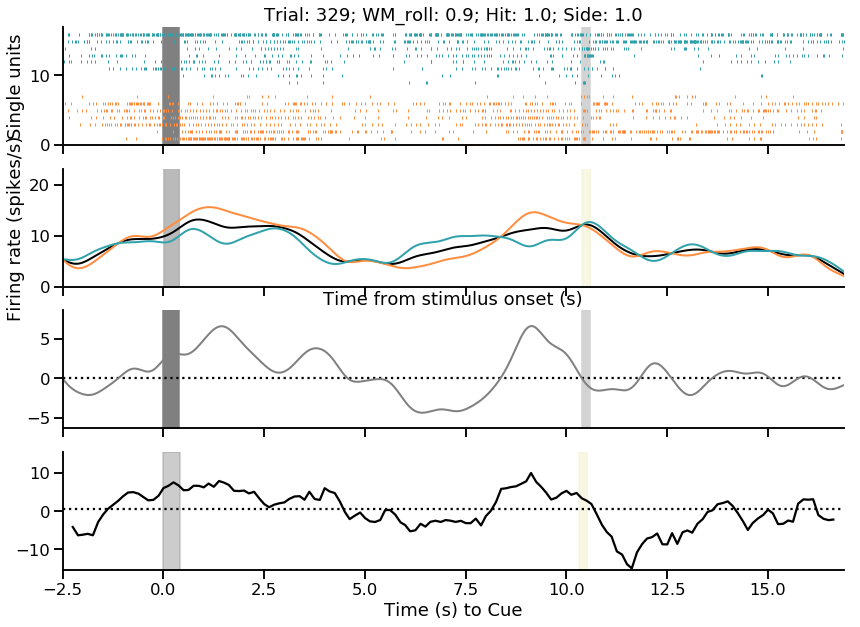

score: 0.8989999725654919 f1_score  0.9538912558013608
110 109


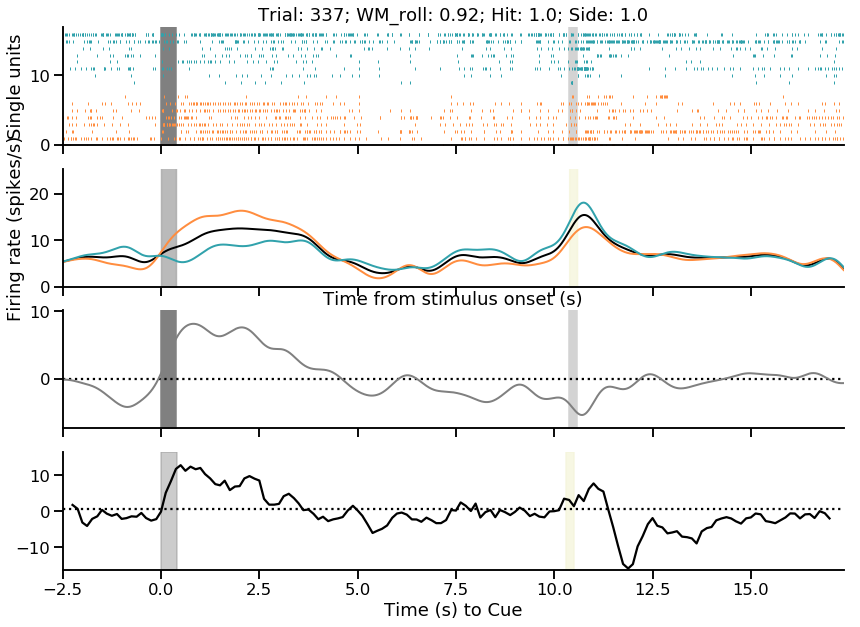

score: 0.8990084928938138 f1_score  0.9538912558013608
110 109


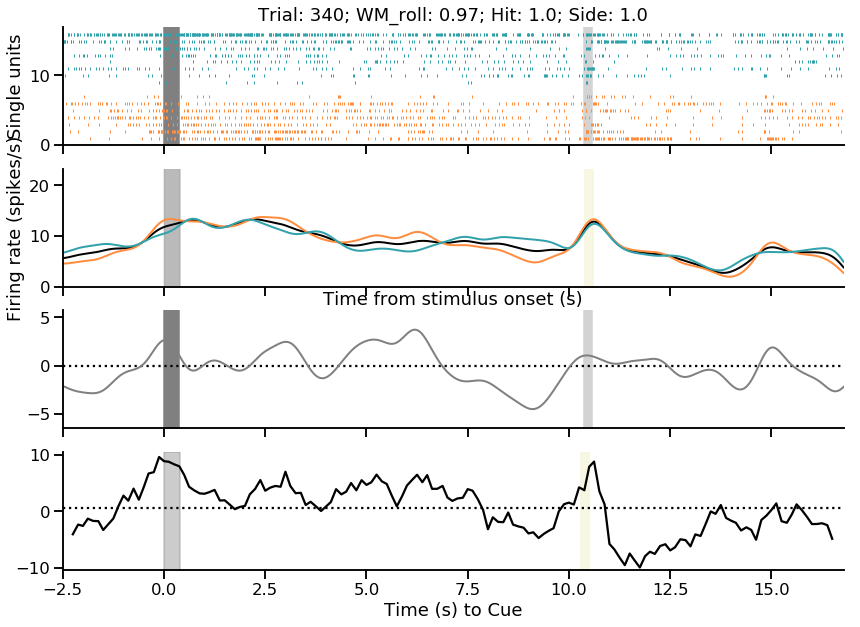

score: 0.8990020195492164 f1_score  0.9538912558013608
110 109


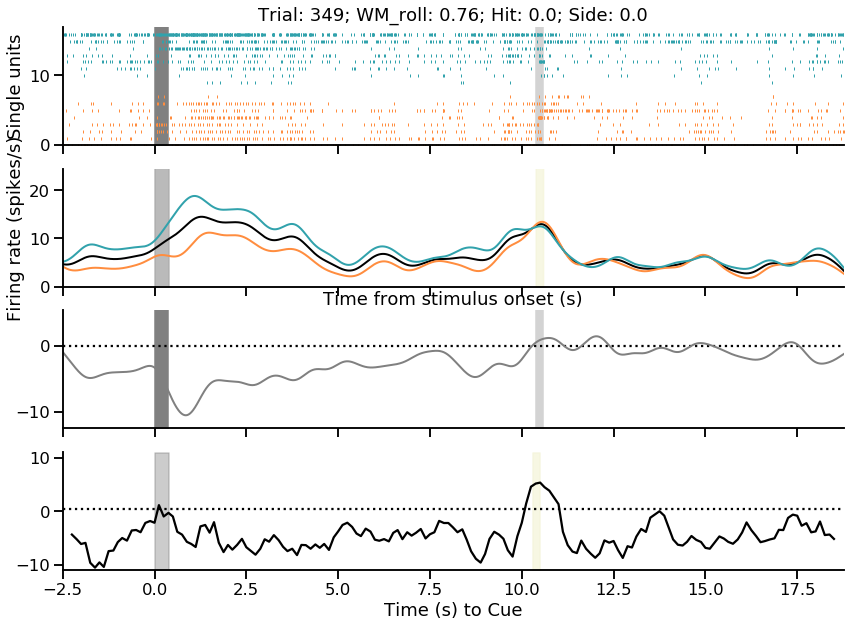

score: 0.8989992905291416 f1_score  0.9538912558013608
110 109


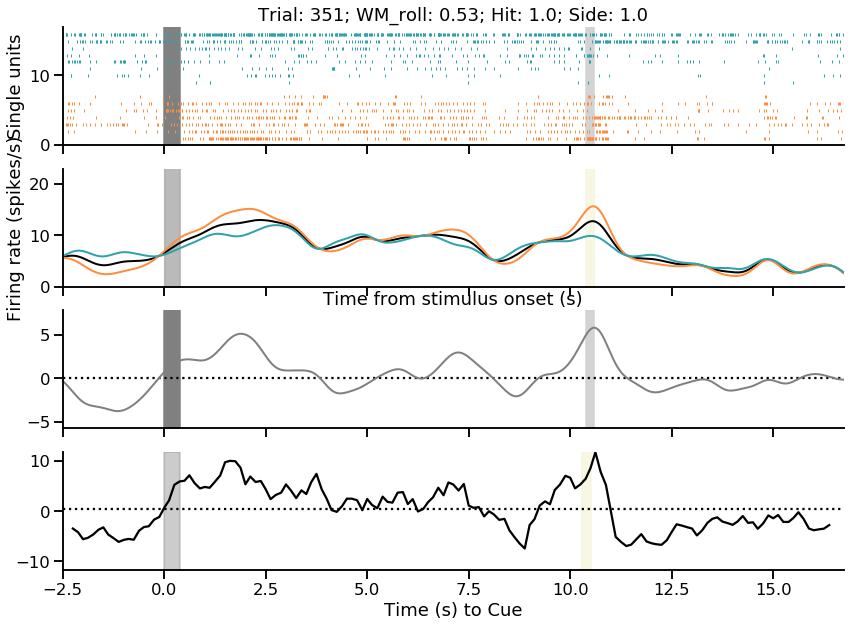

score: 0.8990004843903094 f1_score  0.9538912558013608
110 109


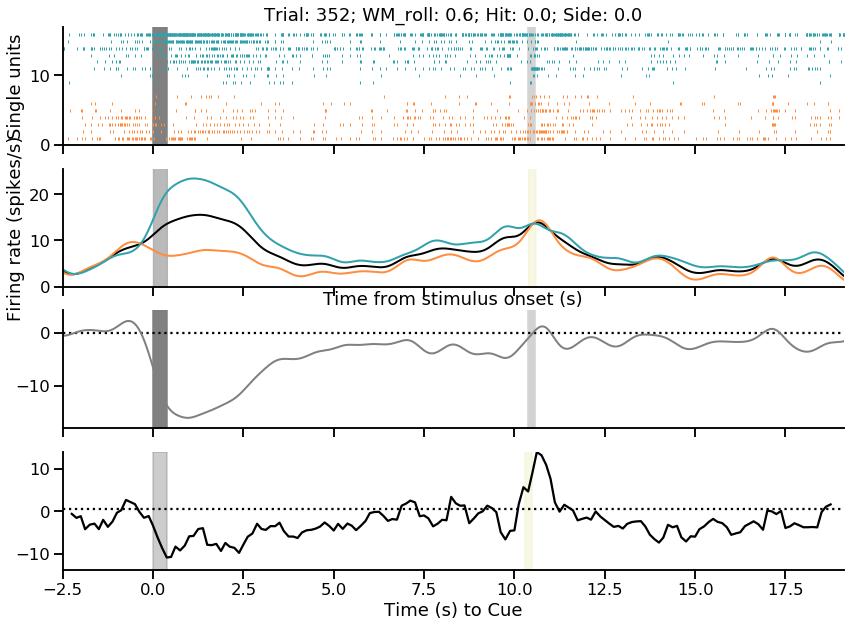

score: 0.8989970636357132 f1_score  0.9538912558013608
110 109


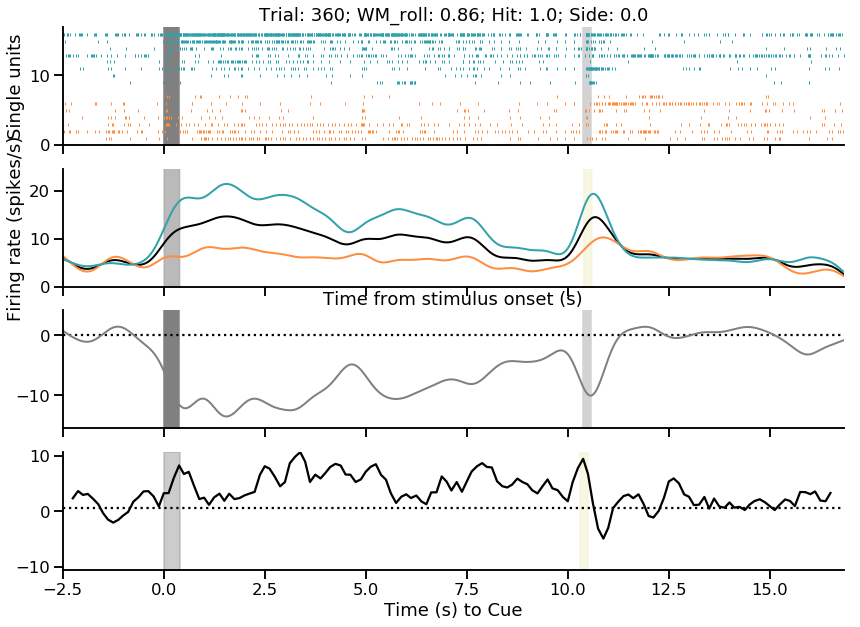

score: 0.8989962692083578 f1_score  0.9538912558013608
110 109


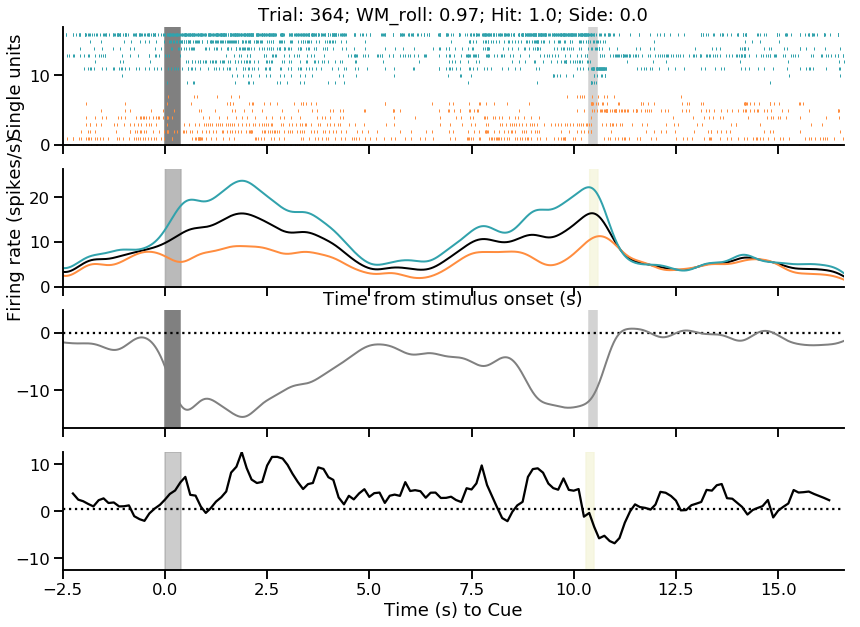

score: 0.8989930769142584 f1_score  0.9538912558013608
110 109


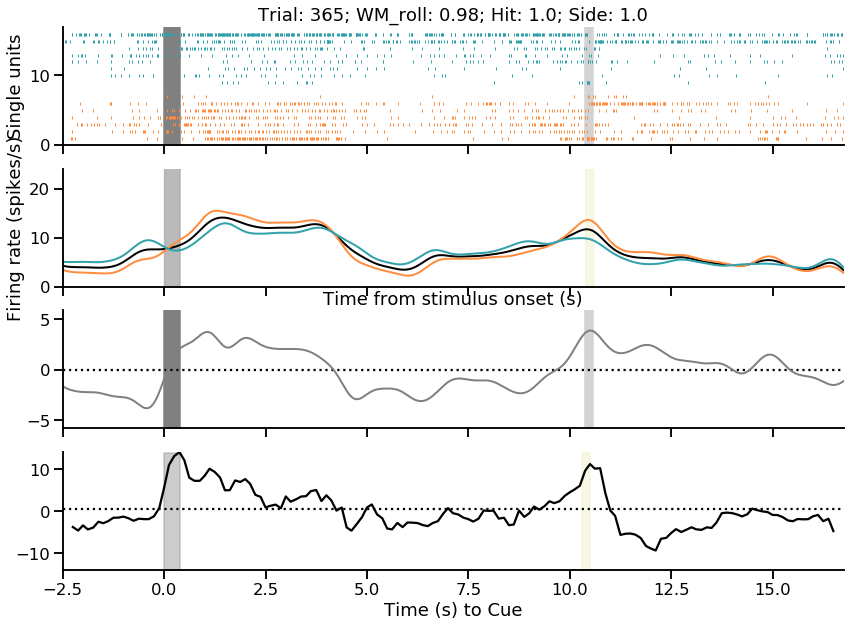

score: 0.8990083879606131 f1_score  0.9538912558013608
110 109


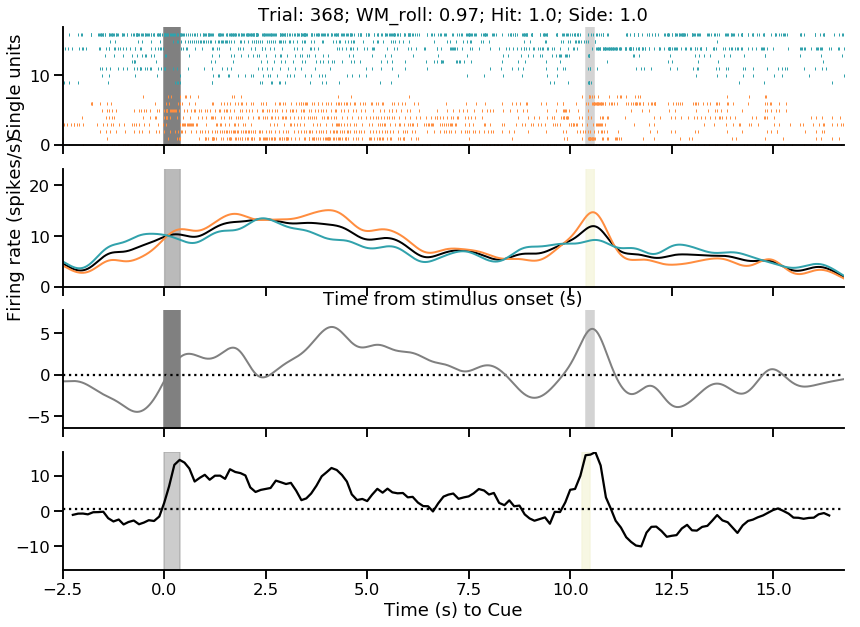

score: 0.8990085740074427 f1_score  0.9538912558013608
110 109


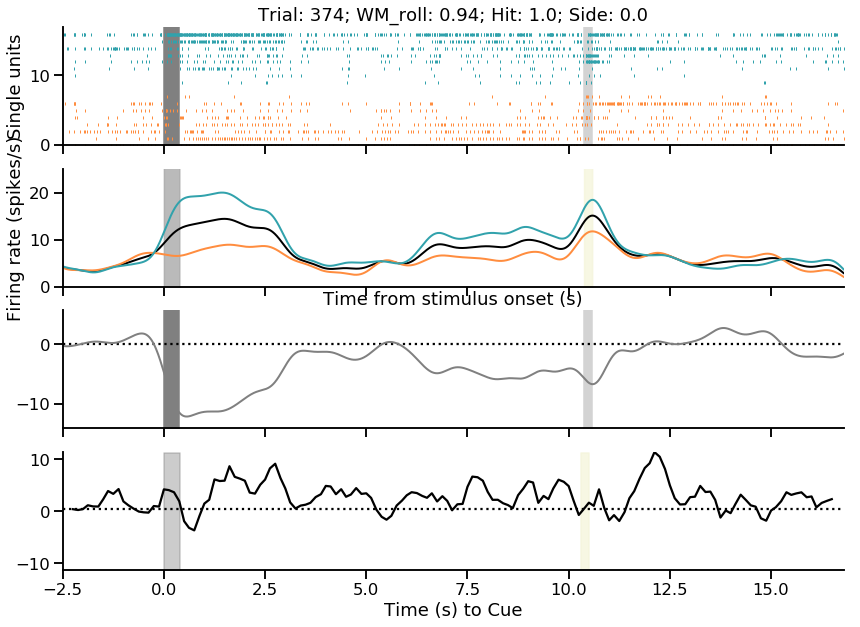

score: 0.8989997013381897 f1_score  0.9538912558013608
110 109


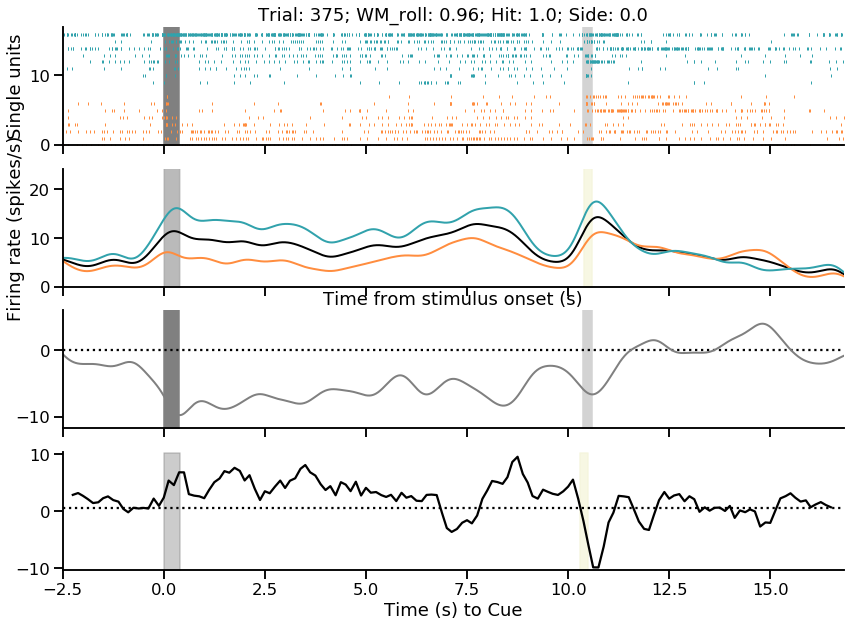

In [162]:
threshold_bool = True
ephys_path = 'C:/Users/Tiffany/Documents/Ephys/summary_complete/'
path = 'C:/Users/Tiffany/Google Drive/WORKING_MEMORY/PAPER/Figures/'

for filename in filename_list:
    print(filename)
    df = pd.read_csv(ephys_path + '/'+filename, sep=',',index_col=0)

    ############################################# Add time before the fixation ##########################################
    # df = df.rename(columns={'past_choices_x' : 'past_choices', 'streak_x' : 'streak', 'past_rewards_x' : 'past_rewards'})
    # df = df.drop(columns=['past_choices_y','streak_y', 'past_rewards_y'])

    # Create a DataFrame only with info for the session
    trials = df.groupby(['trial']).mean()
    trials = trials[['START','END','Delay_ON','Delay_OFF', 'Stimulus_ON', 'Response_ON', 'Lick_ON', 'Motor_OUT','new_trial',
           'vector_answer', 'reward_side', 'hit', 'delay','total_trials', 'T', 'previous_vector_answer', 'previous_reward_side','repeat_choice',
            'WM_roll', 'RL_roll', 'WM', 'RL']]
    trials = trials.reset_index()

    # Make an aligment to END column
    df['a_END'] = df['fixed_times'] - df['END']

    # Create a new DataFrame with all spikes
    try:
        # Some sessions include the group column that indicates the type of cluste,r other don't
        spikes = df[['trial','fixed_times','a_END','cluster_id', 'group']]
    except:
        spikes = df[['trial','fixed_times','a_END','cluster_id']]

    # Locate spikes that happen 2s prior to end of trial and copy them changing the new_trial index
    duplicate_spikes = spikes.loc[spikes.a_END >-3]
    duplicate_spikes['trial'] +=1 

    # Add the duplicates
    spikes = pd.concat([spikes, duplicate_spikes])

    # Merge trial data with spikes on trial idnex
    df = pd.DataFrame()
    df = pd.merge(trials, spikes, on=["trial"])

    # Create the columns for start and end and change trial to new trial index ( without taking the misses into account)
    # df['trial_start'] = min(df.new_trial)
    # df['trial_end'] = max(df.new_trial)
    # df = df.drop(columns=['trial'])
    # df = df.rename(columns={'new_trial' : 'trial'})

    # This in case we don't do this and want to preserve the orginal trial indexes. 
    df['trial_start'] = min(df.trial)
    df['trial_end'] = max(df.trial)

    # Crate the aligment that ew will need for the analysis. 
    df['a_Stimulus_ON'] =  df['fixed_times'] - df['Stimulus_ON']
    df['a_Lick_ON'] =  df['fixed_times'] - df['Lick_ON']
    df['a_Delay_OFF'] =  df['fixed_times'] - df['Delay_OFF']
    df['a_Motor_OUT'] =  df['fixed_times'] - df['Motor_OUT']
    df['a_Response_ON'] =  df['fixed_times'] - df['Response_ON']
    df['START_adjusted'] =  df['START'] - 3.1

    #######################################################################################################################   

    with PdfPages(path +  filename[:-4]+'.pdf') as pdf:
        for T in df.trial.unique():
            delay=df.loc[df.trial==T]['delay'].unique()[0]
            hit=df.loc[df.trial==T]['hit'].unique()[0]
            WM_roll=df.loc[df.trial==T]['WM_roll'].unique()[0]
            trial_index=df.loc[df.trial==T]['T'].unique()[0]
            if delay != 10 or trial_index >0.8:
                continue

            fig, ax = plt.subplots(4,sharex=True,figsize=(14,10))
            align = 'Stimulus_ON'
            endrange = max(df.loc[df.trial==T]['a_'+align])
            # try:
            plotsingletrialdecoder(df, T, ax[3],endrange= endrange)
            # except:
            #     print('prob')
            #     continue
                
            if threshold_bool:
                threshold = 0.4
                window='Delay_OFF--0.5-0'
                path = 'C:/Users/Tiffany/Google Drive/WORKING_MEMORY/PAPER/Figures/'
                file_name = 'weights for the modelling_complete'
                df_weights = pd.read_csv(path+file_name+'.csv', index_col=0)
                df_weights = df_weights.loc[df_weights.session == filename]
    
                significant_neurons = df_weights.loc[(df_weights[window] > threshold)|(df_weights[window] < -threshold)].neuron.unique()

            else:
                threshold = 0
                significant_neurons = df_weights.loc[(df_weights['p_values'] < 0.05)].neuron.unique()

            df_filtered = df[df['cluster_id'].isin(significant_neurons)]

            big_data = pd.DataFrame()
            for N in df_filtered.cluster_id.unique():
                neuron = convolve_trial(df_filtered.loc[df_filtered.cluster_id==N], df, T, sampling=5)
                big_data = pd.concat([neuron, big_data])

            cue_on=0
            cue_off=0.38
            start=-2.5
            # stop=6+delay
            stop= max(df.loc[df.trial==T]['a_'+align])

            # Align to specific epoch, in this case Stimulus 
            big_data['time_centered'] = big_data['times'] - big_data['Stimulus_ON'] 
            big_data['time_centered'] = np.round(big_data.time_centered/1000, 2) #### estos es importante!!
            # neuron = neuron.loc[(neuron['time_centered'] < delay+0.38)]
            big_data['firing_'] = big_data['firing']*1000

            df_results = pd.DataFrame(dtype=float)
            df_results['firing'] = big_data.loc[(big_data.time_centered <= stop)].groupby(['time_centered','neuron'])['firing_'].mean()
            df_results['error'] = big_data.loc[(big_data.time_centered <= stop)].groupby(['time_centered','neuron'])['firing_'].std()
            df_results.reset_index(inplace=True)

            # This piece of code is to filter neurons with lower than 1 Hz firing across the session
            filter_neuron = df_results.groupby('neuron').firing.mean().reset_index()
            filter_neuron = (df_results.loc[(df_results.time_centered>0)&(df_results.time_centered<delay+0.2)]
                             .groupby(['neuron']).firing.mean().reset_index())
            filter_neuron = filter_neuron.loc[filter_neuron.firing > 0.25]
            neurons = filter_neuron.neuron.unique()
            df_results = df_results.loc[df_results.neuron.isin(neurons)]

            if threshold_bool:
                significant_left_neurons = df_weights.loc[(df_weights["Delay_OFF--0.5-0"] < -threshold)].neuron.unique()
                significant_right_neurons = df_weights.loc[(df_weights["Delay_OFF--0.5-0"] > threshold)].neuron.unique()
            else:
                significant_left_neurons = df_weights.loc[(df_weights["Delay_OFF--0.5-0"] < 0)].neuron.unique()
                significant_right_neurons = df_weights.loc[(df_weights["Delay_OFF--0.5-0"] > 0)].neuron.unique()

            left = df_results[df_results['neuron'].isin(significant_right_neurons)].groupby('time_centered').firing.mean().values
            right = df_results[df_results['neuron'].isin(significant_left_neurons)].groupby('time_centered').firing.mean().values

            x = df_results.groupby('time_centered').firing.mean().index
            ax[1].plot(x,  df_results.groupby('time_centered').firing.mean().values, linewidth=2, color='black')

            x = df_results[df_results['neuron'].isin(significant_right_neurons)].groupby('time_centered').firing.mean().index
            ax[1].plot(x,  df_results[df_results['neuron'].isin(significant_right_neurons)].groupby('time_centered').firing.mean().values, linewidth=2, color=COLORRIGHT)

            x = df_results[df_results['neuron'].isin(significant_left_neurons)].groupby('time_centered').firing.mean().index
            ax[1].plot(x,  df_results[df_results['neuron'].isin(significant_left_neurons)].groupby('time_centered').firing.mean().values, linewidth=2, color=COLORLEFT)
            ax[2].plot(x,  left-right, linewidth=2, color='grey')

            ax[1].set_xlim(start,stop)  
            # ax[1].set_ylim(0,60)  
            ax[1].set_xlabel('Time (s) from response onset')

            y = np.arange(-20,20+1,0.1)
            ax[2].fill_betweenx(y, cue_on,cue_off, color='grey', alpha=1)
            ax[2].fill_betweenx(y, cue_off+delay,cue_off+delay+.2, color='lightgrey', alpha=1)    

            y = np.arange(0,75,0.1)     
            ax[1].fill_betweenx(y, cue_on,cue_off, color='darkgrey', alpha=.8)  
            ax[1].fill_betweenx(y, cue_off+delay,cue_off+delay+.2, color='beige', alpha=.8)

            ax[1].set_ylim(0,max(df_results.groupby('time_centered').firing.mean().values)+10)
            ax[2].set_ylim(min(left-right)-2,max(left-right)+2)

            df['a_Stimulus_ON'] = df['fixed_times'] - df['Stimulus_ON']

            # Organized by cluster_id and corrected for FR ____________________________
            cluster_id=[]
            FR_mean=[]
            dft = df_filtered.loc[df_filtered.trial ==T]
            dft = dft.loc[dft.cluster_id.isin(neurons)]

            start_FR = 0
            stop_FR = delay

            for N in dft.cluster_id.unique():
                # spikes = dft.loc[(dft.cluster_id==N)]['a_'+align].values
                spikes = dft.loc[(dft.cluster_id==N)&(dft['a_'+align] > start_FR)&(dft['a_'+align]<stop_FR)].fixed_times.values
                FR_mean.append(len(spikes)/abs(stop_FR-start_FR))
                cluster_id.append(N)

            df_spikes = pd.DataFrame(list(zip(cluster_id,FR_mean)), columns =['cluster_id','FR'])
            df_spikes = df_spikes.sort_values('FR')
            df_spikes['new_order'] = np.arange(len(df_spikes))

            dft = pd.merge(df_spikes, dft, on=['cluster_id'])

            # j=0
            # for N in dft.new_order.unique():
            #     cluster_id = dft.loc[dft.new_order==N].cluster_id.iloc[0]
            #     if df_weights.loc[df_weights.neuron == cluster_id]["Delay_OFF--0.5-0"].iloc[0] >threshold:
            #         color_selectivity=COLORRIGHT
            #     elif df_weights.loc[df_weights.neuron == cluster_id]["Delay_OFF--0.5-0"].iloc[0] <-threshold:
            #         color_selectivity=COLORLEFT

            #     spikes = dft.loc[dft.new_order==N]['a_'+align].values
            #     j+=1
            #     ax[0].plot(spikes,np.repeat(j, len(spikes)), '|', markersize=3, color=color_selectivity, zorder=1)

            right = 0
            left = len(cluster_id)

            for N in reversed(dft.new_order.unique()):
                cluster_id = dft.loc[dft.new_order==N].cluster_id.iloc[0]
                # if df_weights.loc[df_weights.neuron == cluster_id]["Delay_OFF--0.5-0"].iloc[0] >0:
                if df_weights.loc[df_weights.neuron == cluster_id]["Delay_OFF--0.5-0"].iloc[0] >threshold:
                    color_selectivity=COLORRIGHT
                    j=right
                    right+=1
                elif df_weights.loc[df_weights.neuron == cluster_id]["Delay_OFF--0.5-0"].iloc[0] <-threshold:
                # elif df_weights.loc[df_weights.neuron == cluster_id]["Delay_OFF--0.5-0"].iloc[0] <0:
                    color_selectivity=COLORLEFT
                    j=left
                    left-=1
                spikes = dft.loc[dft.new_order==N]['a_'+align].values
                ax[0].plot(spikes,np.repeat(j, len(spikes)), '|', markersize=3, color=color_selectivity, zorder=1)

            ax[0].set_ylabel('Single units')
            ax[0].set_ylim(0,len(dft.new_order.unique())+1)

            y = np.arange(0,len(dft.new_order.unique())+1,0.1)
            ax[0].fill_betweenx(y, cue_on,cue_off, color='grey', alpha=1)
            ax[0].fill_betweenx(y, cue_off+delay,cue_off+delay+.2, color='lightgrey', alpha=1)    
            ax[0].set_xlim(start,stop)
            sns.despine()

            # axis labels and legend
            # ax[1].legend(frameon=False, bbox_to_anchor=(1.05, 1))    
            ax[1].set_xlabel('Time from stimulus onset (s)')
            ax[1].set_ylabel('Firing rate (spikes/s)')
            ax[0].set_title('Trial: ' + str(T) + '; WM_roll: '+str(np.round(dft.WM_roll.unique()[0],2))+'; Hit: '+str(dft.hit.unique()[0])+ '; Side: '+str(dft.reward_side.unique()[0]))
            ax[2].hlines(xmin=start, xmax=stop, y=0, linestyle=':')

            pdf.savefig(fig, transparent=True)
            plt.show()
            plt.close()

**Single examples of trial by trial decoder of errors**

In [150]:
ephys_path = 'C:/Users/Tiffany/Documents/Ephys/summary_complete/'
save_path = 'C:/Users/Tiffany/Google Drive/WORKING_MEMORY/PAPER/Figures/'
os.getcwd() 
os.chdir(save_path)

# Recover previous timestamps session
# filename = 'E17_2022-02-01_17-02-16.csv' # 
filename = 'E17_2022-02-02_17-13-06.csv'  # 31, 81
# filename = 'E17_2022-01-31_16-30-44.csv'

# filename = 'E20_2022-02-26_16-49-05.csv'

# filename = 'E20_2022-03-01_16-11-01.csv'  # 162
# filename = 'E20_2022-02-13_15-10-51.csv'  # 
# filename = 'E20_2022-02-27_17-02-17.csv'  # 
# filename = 'E20_2022-02-14_16-01-30.csv' # 

# filename = 'E22_2022-01-15_16-53-52.csv'
# filename = 'E22_2022-01-14_16-50-37.csv'  # 
# filename = 'E22_2022-01-13_16-34-24.csv' # 
# filename = 'E22_2022-01-17_18-05-16.csv'

# filename = 'E14_2021-03-29_13-01-12.csv'
# filename = 'E14_2021-04-02_12-53-42.csv'  # 196

# filename = 'E04_2021-04-03_16-12-15.csv'

# filename = 'E11_2021-05-13_12-34-49.csv'

filename_list = ['E17_2022-02-01_17-02-16.csv','E17_2022-02-02_17-13-06.csv' ,'E20_2022-03-01_16-11-01.csv','E20_2022-02-13_15-10-51.csv',
 'E20_2022-02-27_17-02-17.csv','E20_2022-02-14_16-01-30.csv','E22_2022-01-15_16-53-52.csv','E22_2022-01-14_16-50-37.csv' ,
'E22_2022-01-13_16-34-24.csv','E22_2022-01-17_18-05-16.csv','E14_2021-03-29_13-01-12.csv','E14_2021-04-02_12-53-42.csv' ,
'E04_2021-04-03_16-12-15.csv','E11_2021-05-13_12-34-49.csv','E17_2022-01-31_16-30-44.csv']

df = pd.read_csv(ephys_path + '/'+filename, sep=',',index_col=0)

warnings.filterwarnings('ignore', category=UserWarning)

############################################# Add time before the fixation ##########################################
# df = df.rename(columns={'past_choices_x' : 'past_choices', 'streak_x' : 'streak', 'past_rewards_x' : 'past_rewards'})
# df = df.drop(columns=['past_choices_y','streak_y', 'past_rewards_y'])

# Create a DataFrame only with info for the session
trials = df.groupby(['trial']).mean()
trials = trials[['START','END','Delay_ON','Delay_OFF', 'Stimulus_ON', 'Response_ON', 'Lick_ON', 'Motor_OUT','new_trial',
       'vector_answer', 'reward_side', 'hit', 'delay','total_trials', 'T', 'previous_vector_answer', 'previous_reward_side','repeat_choice',
        'WM_roll', 'RL_roll', 'WM', 'RL']]
trials = trials.reset_index()

# Make an aligment to END column
df['a_END'] = df['fixed_times'] - df['END']

# Create a new DataFrame with all spikes
try:
    # Some sessions include the group column that indicates the type of cluste,r other don't
    spikes = df[['trial','fixed_times','a_END','cluster_id', 'group']]
except:
    spikes = df[['trial','fixed_times','a_END','cluster_id']]

# Locate spikes that happen 2s prior to end of trial and copy them changing the new_trial index
duplicate_spikes = spikes.loc[spikes.a_END >-3]
duplicate_spikes['trial'] +=1 

# Add the duplicates
spikes = pd.concat([spikes, duplicate_spikes])

# Merge trial data with spikes on trial idnex
df = pd.DataFrame()
df = pd.merge(trials, spikes, on=["trial"])

# Create the columns for start and end and change trial to new trial index ( without taking the misses into account)
# df['trial_start'] = min(df.new_trial)
# df['trial_end'] = max(df.new_trial)
# df = df.drop(columns=['trial'])
# df = df.rename(columns={'new_trial' : 'trial'})

# This in case we don't do this and want to preserve the orginal trial indexes. 
df['trial_start'] = min(df.trial)
df['trial_end'] = max(df.trial)

# Crate the aligment that ew will need for the analysis. 
df['a_Stimulus_ON'] =  df['fixed_times'] - df['Stimulus_ON']
df['a_Lick_ON'] =  df['fixed_times'] - df['Lick_ON']
df['a_Delay_OFF'] =  df['fixed_times'] - df['Delay_OFF']
df['a_Motor_OUT'] =  df['fixed_times'] - df['Motor_OUT']
df['a_Response_ON'] =  df['fixed_times'] - df['Response_ON']
df['START_adjusted'] =  df['START'] - 3.1

#######################################################################################################################   

In [ ]:
T=298

fig, ax = plt.subplots(3,sharex=True,figsize=(14,10))

threshold_bool = True
align = 'Stimulus_ON'
endrange = max(df.loc[df.trial==T]['a_'+align])
delay = df.loc[df.trial==T].delay.unique()[0]

df_weights, df_decoder = plotsingletrialdecoder(df, T, ax[2], endrange= endrange)
ax[2].plot(df_decoder['times'],df_decoder['real'], color='grey')
if abs(min(df_decoder['real'])) > max(df_decoder['real']):
    max_true=abs(min(df_decoder['real']))+0.5
else:
    max_true=abs(max(df_decoder['real']))
ax[2].set_ylim(-max_true,max_true)
ax[2].axhline(y=0.0,linestyle=':',color='black')
ax[2].fill_betweenx(np.arange(-max_true,max_true,0.1), 0,0.4, color='lightgrey', alpha=.8)
ax[2].fill_betweenx(np.arange(-max_true,max_true,0.1), delay+0.3,delay+0.5, color='grey', alpha=.8)

threshold = 0.4
window='Delay_OFF--0.5-0'
path = 'C:/Users/Tiffany/Google Drive/WORKING_MEMORY/PAPER/Figures/'
file_name = 'weights for the modelling_complete'
df_weights = pd.read_csv(path+file_name+'.csv', index_col=0)
df_weights = df_weights.loc[df_weights.session == filename]

significant_neurons = df_weights.loc[(df_weights[window] > threshold)|(df_weights[window] < -threshold)].neuron.unique()

# df = df.loc[(df.cluster_id != 233)&(df.cluster_id != 288)&(df.cluster_id != 241)]
df_filtered = df[df['cluster_id'].isin(significant_neurons)]

big_data = pd.DataFrame()
for N in df_filtered.cluster_id.unique():
    neuron = convolve_trial(df_filtered.loc[df_filtered.cluster_id==N], df, T, sampling=5)
    big_data = pd.concat([neuron, big_data])

cue_on=0
cue_off=0.38
start=-2.5
stop=4+delay
# stop= max(df.loc[df.trial==T]['a_'+align])

# Align to specific epoch, in this case Stimulus 
big_data['time_centered'] = big_data['times'] - big_data['Stimulus_ON'] 
big_data['time_centered'] = np.round(big_data.time_centered/1000, 2) #### estos es importante!!
# neuron = neuron.loc[(neuron['time_centered'] < delay+0.38)]
big_data['firing_'] = big_data['firing']*1000

df_results = pd.DataFrame(dtype=float)
df_results['firing'] = big_data.loc[(big_data.time_centered <= stop)].groupby(['time_centered','neuron'])['firing_'].mean()
df_results['error'] = big_data.loc[(big_data.time_centered <= stop)].groupby(['time_centered','neuron'])['firing_'].std()
df_results.reset_index(inplace=True)

# This piece of code is to filter neurons with lower than 1 Hz firing across the session
filter_neuron = df_results.groupby('neuron').firing.mean().reset_index()
filter_neuron = (df_results.loc[(df_results.time_centered>0)&(df_results.time_centered<delay+0.2)]
                 .groupby(['neuron']).firing.mean().reset_index())
filter_neuron = filter_neuron.loc[filter_neuron.firing > 0.05]
neurons = filter_neuron.neuron.unique()
df_results = df_results.loc[df_results.neuron.isin(neurons)]

if threshold_bool:
    significant_left_neurons = df_weights.loc[(df_weights["Delay_OFF--0.5-0"] < -threshold)].neuron.unique()
    significant_right_neurons = df_weights.loc[(df_weights["Delay_OFF--0.5-0"] > threshold)].neuron.unique()
else:
    significant_left_neurons = df_weights.loc[(df_weights["Delay_OFF--0.5-0"] < 0)].neuron.unique()
    significant_right_neurons = df_weights.loc[(df_weights["Delay_OFF--0.5-0"] > 0)].neuron.unique()

left = df_results[df_results['neuron'].isin(significant_right_neurons)].groupby('time_centered').firing.mean().values
right = df_results[df_results['neuron'].isin(significant_left_neurons)].groupby('time_centered').firing.mean().values

x = df_results[df_results['neuron'].isin(significant_right_neurons)].groupby('time_centered').firing.mean().index
ax[1].plot(x,  df_results[df_results['neuron'].isin(significant_right_neurons)].groupby('time_centered').firing.mean().values, linewidth=2, color=COLORRIGHT)

x = df_results[df_results['neuron'].isin(significant_left_neurons)].groupby('time_centered').firing.mean().index
ax[1].plot(x,  df_results[df_results['neuron'].isin(significant_left_neurons)].groupby('time_centered').firing.mean().values, linewidth=2, color=COLORLEFT)

ax[1].set_xlim(start,stop)  
# ax[1].set_ylim(0,60)  
ax[1].set_xlabel('Time (s) from response onset')   

y = np.arange(0,75,0.1)     
ax[1].fill_betweenx(y, cue_on,cue_off, color='darkgrey', alpha=.8)  
ax[1].fill_betweenx(y, cue_off+delay,cue_off+delay+.2, color='beige', alpha=.8)

ax[1].set_ylim(0,max(df_results.groupby('time_centered').firing.mean().values)+10)

df['a_Stimulus_ON'] = df['fixed_times'] - df['Stimulus_ON']

# Organized by cluster_id and corrected for FR ____________________________
cluster_id=[]
FR_mean=[]
weights = []
dft = df_filtered.loc[df_filtered.trial ==T]

dft = dft.loc[dft.cluster_id.isin(neurons)]

start_FR = 0
stop_FR = delay

for N in dft.cluster_id.unique():
    # spikes = dft.loc[(dft.cluster_id==N)]['a_'+align].values
    spikes = dft.loc[(dft.cluster_id==N)&(dft['a_'+align] > start_FR)&(dft['a_'+align]<stop_FR)].fixed_times.values
    FR_mean.append(len(spikes)/abs(stop_FR-start_FR))
    weights.append(df_weights.loc[df_weights.neuron == N][window].values)
    cluster_id.append(N)

df_spikes = pd.DataFrame(list(zip(cluster_id,FR_mean, weights)), columns =['cluster_id','FR','weights'])
# df_spikes = df_spikes.sort_values('FR')
df_spikes = df_spikes.sort_values('weights')
df_spikes['new_order'] = np.arange(len(df_spikes))

dft = pd.merge(df_spikes, dft, on=['cluster_id'])

# j=0
# for N in dft.new_order.unique():
#     cluster_id = dft.loc[dft.new_order==N].cluster_id.iloc[0]
#     if df_weights.loc[df_weights.neuron == cluster_id]["Delay_OFF--0.5-0"].iloc[0] >threshold:
#         color_selectivity=COLORRIGHT
#     elif df_weights.loc[df_weights.neuron == cluster_id]["Delay_OFF--0.5-0"].iloc[0] <-threshold:
#         color_selectivity=COLORLEFT

#     spikes = dft.loc[dft.new_order==N]['a_'+align].values
#     j+=1
#     ax[0].plot(spikes,np.repeat(j, len(spikes)), '|', markersize=3, color=color_selectivity, zorder=1)

right = 1
left = len(cluster_id)

for N in reversed(dft.new_order.unique()):
    cluster_id = dft.loc[dft.new_order==N].cluster_id.iloc[0]
    # if df_weights.loc[df_weights.neuron == cluster_id]["Delay_OFF--0.5-0"].iloc[0] >0:
    if df_weights.loc[df_weights.neuron == cluster_id]["Delay_OFF--0.5-0"].iloc[0] >threshold:
        color_selectivity=COLORRIGHT
        j=right
        right+=1
        print(right, cluster_id)
    elif df_weights.loc[df_weights.neuron == cluster_id]["Delay_OFF--0.5-0"].iloc[0] <-threshold:
    # elif df_weights.loc[df_weights.neuron == cluster_id]["Delay_OFF--0.5-0"].iloc[0] <0:
        color_selectivity=COLORLEFT
        j=left
        left-=1
        print(left, cluster_id)

    spikes = dft.loc[dft.new_order==N]['a_'+align].values
    ax[0].plot(spikes,np.repeat(j, len(spikes)), '|', markersize=10, color=color_selectivity, zorder=3)

ax[0].set_ylabel('Single units')
ax[0].set_ylim(0,len(dft.new_order.unique())+1)

y = np.arange(0,len(dft.new_order.unique())+1,0.1)
ax[0].fill_betweenx(y, cue_on,cue_off, color='grey', alpha=1)
ax[0].fill_betweenx(y, cue_off+delay,cue_off+delay+.2, color='lightgrey', alpha=1)    
ax[0].set_xlim(start,stop)

# axis labels and legend
# ax[1].legend(frameon=False, bbox_to_anchor=(1.05, 1))    
ax[2].set_xlabel('Time from stimulus onset (s)')
ax[1].set_ylabel('Firing rate (spikes/s)')
ax[0].set_title('Trial: ' + str(T) + '; WM_roll: '+str(np.round(dft.WM_roll.unique()[0],2))+'; Hit: '+str(dft.hit.unique()[0])+ '; Side: '+str(dft.reward_side.unique()[0]))
# ax[0].set_ylim(0,11.5)

sns.despine()
plt.show()
plt.close()

In [152]:
save_path = 'C:/Users/Tiffany/Google Drive/WORKING_MEMORY/PAPER/Figures/'
os.chdir(save_path)
file_name = 'decoder_'+str(T)+'_'+filename
df_decoder.to_csv(file_name)

file_name = 'df_'+str(T)+'_'+filename
df_filtered.loc[df['trial'] == T].to_csv(file_name)

file_name = 'convolve_'+str(T)+'_'+filename
big_data.to_csv(file_name)

#### **Single Neuron example**

In [4]:
path = 'C:/Users/Tiffany/Documents/Ephys/summary_complete/'
os.getcwd() 
os.chdir(path)

In [5]:
def new_convolve(nx,df):
    '''
    nx = already selected cluster
    df = dataframe from the session with all trials
    '''

    errors_=[] ##indexes and neurons without enough spikes to make a spiketrain
    frames=[]
   
    # Iterate for each trial in that session
    for T in df.trial.unique():
        if T >= nx.iloc[0].trial_start and T < nx.iloc[0].trial_end+1:
            # Take the spike times for that trial
            nxt = nx.loc[nx['trial']==T]['fixed_times']

            # !!!! IMPORTANT use the main df that has all the trials. If you use the filtered nx, some trials may not appear if they were no spikes there. 
            dft = df.loc[df['trial']==T]

            try: 
                ############################################################ Get the times of the spikes
                times_spikes = nxt
                times_spikes = times_spikes*1000 #transform to ms

                ############################################################ Set the strat and end time of the train
                stop_time =  (dft.END.unique()[0])*1000*ms ## End of the trial in ms
                
                try:
                    start_time = (dft.START_adjusted.unique()[0]-0.1)*1000*ms ## Start of the trial in ms    
                except:
                    start_time = dft.START.unique()[0]*1000*ms ## Start of the trial in ms    

                ############################################################ Spiketrain
                spiketrain = SpikeTrain(times_spikes, units=ms, t_stop=stop_time, t_start=start_time) 

                ############################################################ Convoluted firing rate
                histogram_rate = time_histogram([spiketrain], 5*ms, output='rate')
                gaus_rate = instantaneous_rate(spiketrain, sampling_period=5*ms, kernel=GaussianKernel(200*ms)) #s.d of Suzuki & Gottlieb 
                times_ = gaus_rate.times.rescale(ms)
                firing = gaus_rate.rescale(histogram_rate.dimensionality).magnitude.flatten()

                ############################################################ Dataframe 
                ############################################################ Dataframe 
                df_trial = pd.DataFrame({'times':times_, 'firing':firing}) #dataframe con times y firing
                df_trial['trial']=T
                df_trial['Delay_OFF']= dft.Delay_OFF.unique()[0]*1000
                df_trial['Stimulus_ON']= dft.Stimulus_ON.unique()[0]*1000
                df_trial['delay']=dft.delay.unique()[0]
                df_trial['vector_answer']=dft.vector_answer.unique()[0]
                df_trial['reward_side']=dft.reward_side.unique()[0]
                # df_trial['miss']=dft.miss.unique()[0]
                df_trial['hit']=dft.hit.unique()[0]
                # df_trial['state']=dft.state.unique()[0]
                
                frames.append(df_trial)
            except ValueError:
                errors_.append([N,T])
                print (N, T)
            except IndexError:
                print('Index error, missing trial ' + str(T))
                errors_.append([N,T])
        ####
        
        else:
            continue
    neuron = pd.concat(frames)
    return neuron

In [179]:
session = '///E19_2022-01-14_14-42-13'
df = pd.read_csv(path + '/' + session +'.csv', sep=',',index_col=0)

In [180]:
# df = pd.read_csv(path + '/E20_2022-02-14_16-01-30.csv', sep=',',index_col=0)
df = df.rename(columns={'past_choices_x' : 'past_choices', 'streak_x' : 'streak', 'past_rewards_x' : 'past_rewards'})
# df = df.drop(columns=['past_choices_y','streak_y', 'past_rewards_y'])

############################################# Add time before the fixation ##########################################

# Create a DataFrame only with info for the session
trials = df.groupby(['trial']).mean()
trials = trials[['START','END','Delay_ON','Delay_OFF', 'Stimulus_ON', 'Response_ON', 'Lick_ON', 'Motor_OUT','new_trial',
       'vector_answer', 'reward_side', 'hit', 'delay','total_trials', 'T', 'previous_vector_answer', 'previous_reward_side','repeat_choice',
        'WM_roll', 'RL_roll', 'WM', 'RL', 'streak']]
trials = trials.reset_index()

# Make an aligment to END column
df['a_END'] = df['fixed_times'] - df['END']

# Create a new DataFrame with all spikes
try:
    # Some sessions include the group column that indicates the type of cluste,r other don't
    spikes = df[['trial','fixed_times','a_END','cluster_id', 'group']]
except:
    spikes = df[['trial','fixed_times','a_END','cluster_id']]
    
# Locate spikes that happen 2s prior to end of trial and copy them changing the new_trial index
duplicate_spikes = spikes.loc[spikes.a_END >-4]
duplicate_spikes['trial'] +=1 

# Add the duplicates
spikes = pd.concat([spikes, duplicate_spikes])

# Merge trial data with spikes on trial idnex
df = pd.DataFrame()
df = pd.merge(trials, spikes, on=["trial"])

# Create the columns for start and end and change trial to new trial index ( without taking the misses into account)
# df['trial_start'] = min(df.new_trial)
# df['trial_end'] = max(df.new_trial)
# df = df.drop(columns=['trial'])
# df = df.rename(columns={'new_trial' : 'trial'})

# This in case we don't do this and want to preserve the orginal trial indexes. 
df['trial_start'] = min(df.trial)
df['trial_end'] = max(df.trial)

# Crate the aligment that ew will need for the analysis. 
df['a_Stimulus_ON'] =  df['fixed_times'] - df['Stimulus_ON']
df['a_Lick_ON'] =  df['fixed_times'] - df['Lick_ON']
df['a_Delay_OFF'] =  df['fixed_times'] - df['Delay_OFF']
df['a_Motor_OUT'] =  df['fixed_times'] - df['Motor_OUT']
df['a_Response_ON'] =  df['fixed_times'] - df['Response_ON']
df['START_adjusted'] =  df['START'] - 4.1

#######################################################################################################################


In [182]:
delay = 10
cluster_id =   68

N = cluster_id
# 138 / 314

df = df.loc[(df.WM_roll >0.6)&(df.hit ==1)]
# df = df.loc[df.trial <350]

variable='reward_side'
colors = [COLORRIGHT,COLORLEFT]
# colors = ['darkgreen','crimson']
labels = ['Right stimulus','Left stimulus']
# labels = ['Correct','Incorrect']

align = 'Stimulus_ON'
cue_on=0
cue_off=0.4
start=-2
stop= 6 + delay

neuron = new_convolve(df.loc[df.cluster_id==cluster_id], df)

# neuron = neuron.loc[neuron.delay != 0.1] # Remove trials with no delay if the studied segment is that one. 

# Align the data to the targeted align
neuron['time_centered'] = neuron['times'] - neuron[align] 
neuron['time_centered'] = np.round(neuron.time_centered/1000, 2) #### estos es importante!!
neuron['firing_'] = neuron['firing']*1000

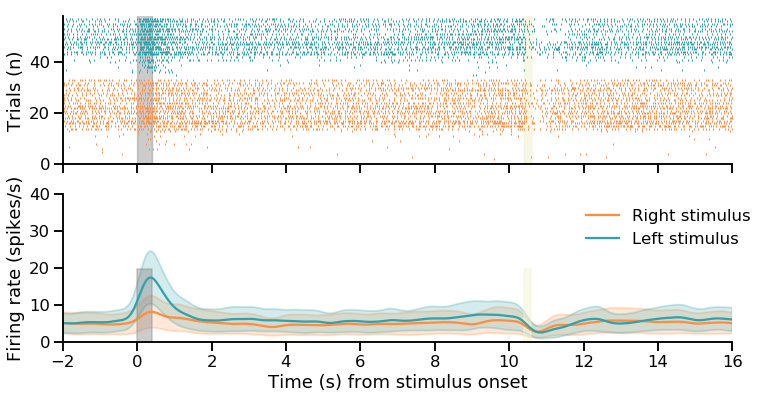

In [183]:
df_results = pd.DataFrame(dtype=float)
df_results['firing'] = neuron.loc[(neuron.time_centered <= stop)&(neuron.delay == delay)].groupby(['time_centered',variable])['firing_'].mean()
df_results['error'] = neuron.loc[(neuron.time_centered <= stop)&(neuron.delay == delay)].groupby(['time_centered',variable])['firing_'].std()
df_results.reset_index(inplace=True)

fig, ax = plt.subplots(2,sharex=True,figsize=(12,6))

for condition,color,name in zip([1,0],colors,labels):
    y_mean= df_results[df_results[variable]==condition].firing
    error = 0.5*df_results[df_results[variable]==condition].error
    lower = y_mean - error
    upper = y_mean + error
    x=df_results[df_results[variable]==condition].time_centered

    ax[1].plot(x, y_mean, label=name,color=color)
    ax[1].plot(x, lower, color=color, alpha=0.1)
    ax[1].plot(x, upper, color=color, alpha=0.1)
    ax[1].fill_between(x, lower, upper, alpha=0.2, color=color)

ax[1].set_xlim(start,stop)  
ax[1].set_ylim(0,40)  
ax[1].set_xlabel('Time (s) from response onset')
y = np.arange(0,20,0.1)     
ax[1].fill_betweenx(y, cue_on,cue_off, color='grey', alpha=.4)  
ax[1].fill_betweenx(y, cue_off+delay,cue_off+delay+.2, color='beige', alpha=.6)

SpikesRight = (df.loc[(df[variable] == 1)&(df.cluster_id == N)&(df.delay == delay)])
SpikesLeft = (df.loc[(df[variable] == 0)&(df.cluster_id == N)&(df.delay == delay)])

SpikesRight['a_'+align] = SpikesRight['fixed_times'] - SpikesRight['Stimulus_ON'] 
SpikesLeft['a_'+align] = SpikesLeft['fixed_times'] - SpikesLeft['Stimulus_ON'] 

trial=1
j=1
spikes = []
trial_repeat = []
for i in range(len(SpikesRight)):
    # Plot for licks for left trials
    if SpikesRight.trial.iloc[i] != trial:
        ax[0].plot(spikes,trial_repeat, '|', markersize=2, color=colors[0], zorder=1)
        spikes = []
        trial_repeat = []
        trial = SpikesRight.trial.iloc[i]
        j+=1
    if SpikesRight['a_'+align].iloc[i] > start and SpikesRight['a_'+align].iloc[i] < stop:
        spikes.append(SpikesRight['a_'+align].iloc[i])
        trial_repeat.append(j)
    else:
        continue

trial=1
spikes = []
trial_repeat = []
for i in range(len(SpikesLeft)):
    # Plot for licks for left trials
    if SpikesLeft.trial.iloc[i] != trial:
        ax[0].plot(spikes,trial_repeat, '|', markersize=2, color=colors[1], zorder=1)
        spikes = []
        trial_repeat = []
        trial = SpikesLeft.trial.iloc[i]
        j+=1
    if SpikesLeft['a_'+align].iloc[i] > start and SpikesLeft['a_'+align].iloc[i] < stop:
        spikes.append(SpikesLeft['a_'+align].iloc[i])
        trial_repeat.append(j)
    else:
        continue
            
ax[0].set_ylabel('Trials (n)')
ax[0].set_ylim(0,j)

y = np.arange(0,j+1,0.1)
ax[0].fill_betweenx(y, cue_on,cue_off, color='grey', alpha=.4)
ax[0].fill_betweenx(y, cue_off+delay,cue_off+delay+.2, color='beige', alpha=.8)

every_nth = 1
for n, label in enumerate(ax[1].yaxis.get_ticklabels()):
    if n % every_nth != 0:
        label.set_visible(False)
for n, label in enumerate(ax[0].yaxis.get_ticklabels()):
    if n % every_nth != 0:
        label.set_visible(False)     
        
sns.despine()

# axis labels and legend
ax[1].legend(frameon=False, bbox_to_anchor=(1.05, 1))    
ax[1].set_xlabel('Time (s) from stimulus onset')
ax[1].set_ylabel('Firing rate (spikes/s)')

plt.show()

In [184]:
save_path = 'G:/Mi unidad/WORKING_MEMORY/PAPER/ANALYSIS_figures/'
file_name = session +'_neuron_'+str(cluster_id)+'_delay_'+str(delay)
df.loc[df.cluster_id == cluster_id].to_csv(save_path + file_name+'.csv')

In [185]:
file_name

'///E19_2022-01-14_14-42-13_neuron_68_delay_10'

In [ ]:
# save_path = 'C:/Users/Tiffany/Google Drive/WORKING_MEMORY/PAPER/Figures/'
# os.chdir(save_path)
# file_name = 'single_neuron_10s'
# df = pd.read_csv(file_name+'.csv')

#### **Correct an incorrect population trials**

In [154]:
def convolveandplot(df, ax, variable='reward_side', cluster_id = 153, delay = 10, labels=['Correct right stimulus','Correct left stimulus'],
                   colors=[COLORRIGHT,COLORLEFT], align = 'Stimulus_ON', j=1, linestyle='solid'):
    cue_on=0
    cue_off=0.35
    start=-2.5
    stop= 6 + delay
    
    
    neuron = new_convolve(df.loc[df.cluster_id==cluster_id], df)

    # neuron = neuron.loc[neuron.delay != 0.1] # Remove trials with no delay if the studied segment is that one. 

    # Align the data to the targeted align
    neuron['time_centered'] = neuron['times'] - neuron[align] 
    neuron['time_centered'] = np.round(neuron.time_centered/1000, 2) #### estos es importante!!
    neuron['firing_'] = neuron['firing']*1000

    df_results = pd.DataFrame(dtype=float)
    df_results['firing'] = neuron.loc[(neuron.time_centered <= stop)&(neuron.delay == delay)].groupby(['time_centered',variable])['firing_'].mean()
    df_results['error'] = neuron.loc[(neuron.time_centered <= stop)&(neuron.delay == delay)].groupby(['time_centered',variable])['firing_'].std()
    df_results.reset_index(inplace=True)
    
    for condition,color,name in zip([1,0],colors,labels):
        y_mean= df_results[df_results[variable]==condition].firing
        error = 0.5*df_results[df_results[variable]==condition].error
        lower = y_mean - error
        upper = y_mean + error
        x=df_results[df_results[variable]==condition].time_centered

        ax[1].plot(x, y_mean, label=name,color=color, linestyle=linestyle)
        ax[1].plot(x, lower, color=color, alpha=0.1)
        ax[1].plot(x, upper, color=color, alpha=0.1)
        ax[1].fill_between(x, lower, upper, alpha=0.2, color=color)

    ax[1].set_xlim(start,stop)  
    ax[1].set_ylim(0,40)  
    ax[1].set_xlabel('Time (s) from response onset')
    y = np.arange(0,40,0.1)     
    ax[1].fill_betweenx(y, cue_on,cue_off, color='grey', alpha=.8)  
    ax[1].fill_betweenx(y, cue_off+delay,cue_off+delay+.2, color='beige', alpha=1)

    SpikesRight = (df.loc[(df[variable] == 1)&(df.cluster_id == cluster_id)&(df.delay == delay)])
    SpikesLeft = (df.loc[(df[variable] == 0)&(df.cluster_id == cluster_id)&(df.delay == delay)])

    SpikesRight['a_'+align] = SpikesRight['fixed_times'] - SpikesRight['Stimulus_ON'] 
    SpikesLeft['a_'+align] = SpikesLeft['fixed_times'] - SpikesLeft['Stimulus_ON'] 

    trial=1
    spikes = []
    trial_repeat = []
    for i in range(len(SpikesRight)):
        # Plot for licks for left trials
        if SpikesRight.trial.iloc[i] != trial:
            ax[0].plot(spikes,trial_repeat, '|', markersize=2, color=colors[0], zorder=1)
            spikes = []
            trial_repeat = []
            trial = SpikesRight.trial.iloc[i]
            j+=1
        if SpikesRight['a_'+align].iloc[i] > start and SpikesRight['a_'+align].iloc[i] < stop:
            spikes.append(SpikesRight['a_'+align].iloc[i])
            trial_repeat.append(j)
        else:
            continue

    trial=1
    spikes = []
    trial_repeat = []
    for i in range(len(SpikesLeft)):
        # Plot for licks for left trials
        if SpikesLeft.trial.iloc[i] != trial:
            ax[0].plot(spikes,trial_repeat, '|', markersize=2, color=colors[1], zorder=1)
            spikes = []
            trial_repeat = []
            trial = SpikesLeft.trial.iloc[i]
            j+=1
        if SpikesLeft['a_'+align].iloc[i] > start and SpikesLeft['a_'+align].iloc[i] < stop:
            spikes.append(SpikesLeft['a_'+align].iloc[i])
            trial_repeat.append(j)
        else:
            continue

    ax[0].set_ylabel('Trials (n)')
    ax[0].set_ylim(0,j)

    y = np.arange(0,j+1,0.1)
    ax[0].fill_betweenx(y, cue_on,cue_off, color='grey', alpha=.4)
    ax[0].fill_betweenx(y, cue_off+delay,cue_off+delay+.2, color='beige', alpha=.8)

    every_nth = 1
    for n, label in enumerate(ax[1].yaxis.get_ticklabels()):
        if n % every_nth != 0:
            label.set_visible(False)
    for n, label in enumerate(ax[0].yaxis.get_ticklabels()):
        if n % every_nth != 0:
            label.set_visible(False)     

    # axis labels and legend
    ax[1].legend(frameon=False, bbox_to_anchor=(1.05, 1))    
    ax[1].set_xlabel('Time (s) from stimulus onset')
    ax[1].set_ylabel('Firing rate (spikes/s)')
    return j

In [155]:
ephys_path = 'C:/Users/Tiffany/Documents/Ephys/summary_complete/'
# df = pd.read_csv(path + '/E20_2022-02-14_16-01-30.csv', sep=',',index_col=0) # 204, 153
# df = pd.read_csv(path + '/E22_2022-01-13_16-34-24.csv', sep=',',index_col=0) # 381, 138, 314, 133
df = pd.read_csv(ephys_path + '/E17_2022-02-01_17-02-16.csv', sep=',',index_col=0) # 304
# df = pd.read_csv(path + '/E20_2022-02-13_15-10-51.csv', sep=',',index_col=0) # 81
# df = pd.read_csv(path + '/E20_2022-02-27_17-02-17.csv', sep=',',index_col=0) # 9
# df = pd.read_csv(path + '/E22_2022-01-15_16-53-52.csv', sep=',',index_col=0) # 76, 191, 
# df = pd.read_csv(path + '/E14_2021-04-02_12-53-42.csv', sep=',',index_col=0) # 361, 453
# df = pd.read_csv(path + '/E22_2022-01-14_16-50-37.csv', sep=',',index_col=0) # 56, 22, 44, 42
# df = pd.read_csv(path + '/E17_2022-02-02_17-13-06.csv', sep=',',index_col=0) #282, 285, 288, 233, 319, 304, 265, 303
# df = pd.read_csv(path + '/E20_2022-03-01_16-11-01.csv', sep=',',index_col=0) # 90, 95
# df = pd.read_csv(path + '/E14_2021-03-29_13-01-12.csv', sep=',',index_col=0) # 190, 226 

In [156]:

# df = pd.read_csv(path + '/E20_2022-02-14_16-01-30.csv', sep=',',index_col=0)
df = df.rename(columns={'past_choices_x' : 'past_choices', 'streak_x' : 'streak', 'past_rewards_x' : 'past_rewards'})
df = df.drop(columns=['past_choices_y','streak_y', 'past_rewards_y'])

############################################# Add time before the fixation ##########################################

# Create a DataFrame only with info for the session
trials = df.groupby(['trial']).mean()
trials = trials[['START','END','Delay_ON','Delay_OFF', 'Stimulus_ON', 'Response_ON', 'Lick_ON', 'Motor_OUT','new_trial',
       'vector_answer', 'reward_side', 'hit', 'delay','total_trials', 'T', 'previous_vector_answer', 'previous_reward_side','repeat_choice',
        'WM_roll', 'RL_roll', 'WM', 'RL', 'streak']]
trials = trials.reset_index()

# Make an aligment to END column
df['a_END'] = df['fixed_times'] - df['END']

# Create a new DataFrame with all spikes
try:
    # Some sessions include the group column that indicates the type of cluste,r other don't
    spikes = df[['trial','fixed_times','a_END','cluster_id', 'group']]
except:
    spikes = df[['trial','fixed_times','a_END','cluster_id']]
    
# Locate spikes that happen 2s prior to end of trial and copy them changing the new_trial index
duplicate_spikes = spikes.loc[spikes.a_END >-2]
duplicate_spikes['trial'] +=1 

# Add the duplicates
spikes = pd.concat([spikes, duplicate_spikes])

# Merge trial data with spikes on trial idnex
df = pd.DataFrame()
df = pd.merge(trials, spikes, on=["trial"])

# Create the columns for start and end and change trial to new trial index ( without taking the misses into account)
# df['trial_start'] = min(df.new_trial)
# df['trial_end'] = max(df.new_trial)
# df = df.drop(columns=['trial'])
# df = df.rename(columns={'new_trial' : 'trial'})

# This in case we don't do this and want to preserve the orginal trial indexes. 
df['trial_start'] = min(df.trial)
df['trial_end'] = max(df.trial)

# Crate the aligment that ew will need for the analysis. 
df['a_Stimulus_ON'] =  df['fixed_times'] - df['Stimulus_ON']
df['a_Lick_ON'] =  df['fixed_times'] - df['Lick_ON']
df['a_Delay_OFF'] =  df['fixed_times'] - df['Delay_OFF']
df['a_Motor_OUT'] =  df['fixed_times'] - df['Motor_OUT']
df['a_Response_ON'] =  df['fixed_times'] - df['Response_ON']
df['START_adjusted'] =  df['START'] - 2.1

#######################################################################################################################

In [ ]:
delay = 10
cluster_id = 153

colors = [COLORRIGHT,COLORLEFT]
# colors = ['darkgreen','crimson']
labels = ['Right stimulus','Left stimulus']
# labels = ['Correct','Incorrect']

align = 'Stimulus_ON'

fig, ax = plt.subplots(2,sharex=True,figsize=(12,6))

j=1
# # temp_df = df.loc[(df.WM_roll >0.6)&(df.hit ==1)]
# temp_df = df.loc[(df.hit ==1)]
# j = convolveandplot(temp_df, ax, variable='reward_side', cluster_id = cluster_id, delay = delay, j=j)

print('Then incorrect')
# temp_df = df.loc[(df.WM_roll >0.6)&(df.hit ==0)]
temp_df = df.loc[(df.hit ==1)]

j = convolveandplot(temp_df, ax, variable='vector_answer', cluster_id = cluster_id, delay = delay, j=j, linestyle=':',
                   labels=['Incorrect right stimulus','Incorrect left stimulus'])

sns.despine()
plt.show()

#### **HB and WM population trials**

In [12]:
def convolveandplot(df, ax, variable='reward_side', cluster_id = 153, delay = 10, labels=['Correct right stimulus','Correct left stimulus'],
                   colors=[COLORRIGHT,COLORLEFT], align = 'Stimulus_ON', j=1, linestyle='solid'):
    cue_on=0
    cue_off=0.35
    start=-2.5
    stop= 6 + delay
    
    
    neuron = new_convolve(df.loc[df.cluster_id==cluster_id], df)

    # neuron = neuron.loc[neuron.delay != 0.1] # Remove trials with no delay if the studied segment is that one. 

    # Align the data to the targeted align
    neuron['time_centered'] = neuron['times'] - neuron[align] 
    neuron['time_centered'] = np.round(neuron.time_centered/1000, 2) #### estos es importante!!
    neuron['firing_'] = neuron['firing']*1000

    df_results = pd.DataFrame(dtype=float)
    df_results['firing'] = neuron.loc[(neuron.time_centered <= stop)&(neuron.delay == delay)].groupby(['time_centered',variable])['firing_'].mean()
    df_results['error'] = neuron.loc[(neuron.time_centered <= stop)&(neuron.delay == delay)].groupby(['time_centered',variable])['firing_'].std()
    df_results.reset_index(inplace=True)
    
    for condition,color,name in zip([1,0],colors,labels):
        y_mean= df_results[df_results[variable]==condition].firing
        error = 0.5*df_results[df_results[variable]==condition].error
        lower = y_mean - error
        upper = y_mean + error
        x=df_results[df_results[variable]==condition].time_centered

        ax[1].plot(x, y_mean, label=name,color=color, linestyle=linestyle)
        ax[1].plot(x, lower, color=color, alpha=0.1)
        ax[1].plot(x, upper, color=color, alpha=0.1)
        ax[1].fill_between(x, lower, upper, alpha=0.2, color=color)

    ax[1].set_xlim(start,stop)  
    ax[1].set_ylim(0,40)  
    ax[1].set_xlabel('Time (s) from response onset')
    y = np.arange(0,40,0.1)     
    ax[1].fill_betweenx(y, cue_on,cue_off, color='grey', alpha=.8)  
    ax[1].fill_betweenx(y, cue_off+delay,cue_off+delay+.2, color='beige', alpha=1)

    SpikesRight = (df.loc[(df[variable] == 1)&(df.cluster_id == cluster_id)&(df.delay == delay)])
    SpikesLeft = (df.loc[(df[variable] == 0)&(df.cluster_id == cluster_id)&(df.delay == delay)])

    SpikesRight['a_'+align] = SpikesRight['fixed_times'] - SpikesRight['Stimulus_ON'] 
    SpikesLeft['a_'+align] = SpikesLeft['fixed_times'] - SpikesLeft['Stimulus_ON'] 

    trial=1
    spikes = []
    trial_repeat = []
    for i in range(len(SpikesRight)):
        # Plot for licks for left trials
        if SpikesRight.trial.iloc[i] != trial:
            ax[0].plot(spikes,trial_repeat, '|', markersize=2, color=colors[0], zorder=1)
            spikes = []
            trial_repeat = []
            trial = SpikesRight.trial.iloc[i]
            j+=1
        if SpikesRight['a_'+align].iloc[i] > start and SpikesRight['a_'+align].iloc[i] < stop:
            spikes.append(SpikesRight['a_'+align].iloc[i])
            trial_repeat.append(j)
        else:
            continue

    trial=1
    spikes = []
    trial_repeat = []
    for i in range(len(SpikesLeft)):
        # Plot for licks for left trials
        if SpikesLeft.trial.iloc[i] != trial:
            ax[0].plot(spikes,trial_repeat, '|', markersize=2, color=colors[1], zorder=1)
            spikes = []
            trial_repeat = []
            trial = SpikesLeft.trial.iloc[i]
            j+=1
        if SpikesLeft['a_'+align].iloc[i] > start and SpikesLeft['a_'+align].iloc[i] < stop:
            spikes.append(SpikesLeft['a_'+align].iloc[i])
            trial_repeat.append(j)
        else:
            continue

    ax[0].set_ylabel('Trials (n)')
    ax[0].set_ylim(0,j)

    y = np.arange(0,j+1,0.1)
    ax[0].fill_betweenx(y, cue_on,cue_off, color='grey', alpha=.4)
    ax[0].fill_betweenx(y, cue_off+delay,cue_off+delay+.2, color='beige', alpha=.8)

    every_nth = 1
    for n, label in enumerate(ax[1].yaxis.get_ticklabels()):
        if n % every_nth != 0:
            label.set_visible(False)
    for n, label in enumerate(ax[0].yaxis.get_ticklabels()):
        if n % every_nth != 0:
            label.set_visible(False)     

    # axis labels and legend
    ax[1].legend(frameon=False, bbox_to_anchor=(1.05, 1))    
    ax[1].set_xlabel('Time (s) from stimulus onset')
    ax[1].set_ylabel('Firing rate (spikes/s)')
    return j

In [13]:
def new_convolve(nx,df):
    '''
    nx = already selected cluster
    df = dataframe from the session with all trials
    '''

    errors_=[] ##indexes and neurons without enough spikes to make a spiketrain
    frames=[]
   
    # Iterate for each trial in that session
    for T in df.trial.unique():
        if T >= nx.iloc[0].trial_start and T < nx.iloc[0].trial_end+1:
            # Take the spike times for that trial
            nxt = nx.loc[nx['trial']==T]['fixed_times']

            # !!!! IMPORTANT use the main df that has all the trials. If you use the filtered nx, some trials may not appear if they were no spikes there. 
            dft = df.loc[df['trial']==T]

            try: 
                ############################################################ Get the times of the spikes
                times_spikes = nxt
                times_spikes = times_spikes*1000 #transform to ms

                ############################################################ Set the strat and end time of the train
                stop_time =  ((dft.END.unique()[0])+0.2)*1000*ms ## End of the trial in ms
                
                try:
                    start_time = (dft.START_adjusted.unique()[0]-0.2)*1000*ms ## Start of the trial in ms    
                except:
                    start_time = dft.START.unique()[0]*1000*ms ## Start of the trial in ms    

                ############################################################ Spiketrain
                spiketrain = SpikeTrain(times_spikes, units=ms, t_stop=stop_time, t_start=start_time) 

                ############################################################ Convoluted firing rate
                histogram_rate = time_histogram([spiketrain], 5*ms, output='rate')
                gaus_rate = instantaneous_rate(spiketrain, sampling_period=5*ms, kernel=GaussianKernel(200*ms)) #s.d of Suzuki & Gottlieb 
                times_ = gaus_rate.times.rescale(ms)
                firing = gaus_rate.rescale(histogram_rate.dimensionality).magnitude.flatten()

                ############################################################ Dataframe 
                ############################################################ Dataframe 
                df_trial = pd.DataFrame({'times':times_, 'firing':firing}) #dataframe con times y firing
                df_trial['trial']=T
                df_trial['Delay_OFF']= dft.Delay_OFF.unique()[0]*1000
                df_trial['Stimulus_ON']= dft.Stimulus_ON.unique()[0]*1000
                df_trial['delay']=dft.delay.unique()[0]
                df_trial['vector_answer']=dft.vector_answer.unique()[0]
                df_trial['reward_side']=dft.reward_side.unique()[0]
                # df_trial['miss']=dft.miss.unique()[0]
                df_trial['hit']=dft.hit.unique()[0]
                df_trial['state']=dft.state.unique()[0]
                
                frames.append(df_trial)
            except ValueError:
                errors_.append([N,T])
                print (N, T)
            except IndexError:
                print('Index error, missing trial ' + str(T))
                errors_.append([N,T])
        ####
        
        else:
            continue
    neuron = pd.concat(frames)
    return neuron

In [18]:
ephys_path = 'C:/Users/Tiffany/Documents/Ephys/summary_complete/'
path = 'C:/Users/Tiffany/Google Drive/WORKING_MEMORY/PAPER/Figures/'
filename = 'E22_2022-01-15_16-53-52.csv'
filename = 'E20_2022-02-27_17-02-17.csv'
filename = 'E20_2022-02-14_16-01-30.csv'
filename = 'E17_2022-02-01_17-02-16.csv'
filename = 'E20_2022-02-13_15-10-51.csv'
filename = 'E22_2022-01-13_16-34-24.csv'
filename = 'E20_2022-03-01_16-11-01.csv'
filename = 'E22_2022-01-13_16-34-24.csv'
# df = pd.read_csv(path + '/E20_2022-02-13_15-10-51.csv', sep=',',index_col=0) # 81
df = pd.read_csv(ephys_path + '/'+ filename, sep=',',index_col=0)

# df = pd.read_csv(ephys_path + '/E14_2021-04-02_12-53-42.csv', sep=',',index_col=0) # 361, 453
# df = pd.read_csv(ephys_path + '/E22_2022-01-14_16-50-37.csv', sep=',',index_col=0) # 56, 22, 44, 42
# df = pd.read_csv(ephys_path + '/E17_2022-02-02_17-13-06.csv', sep=',',index_col=0) #282, 285, 288, 233, 319, 304, 265, 303
# df = pd.read_csv(ephys_path + '/E20_2022-03-01_16-11-01.csv', sep=',',index_col=0) # 90, 95
# df = pd.read_csv(ephys_path + '/E14_2021-03-29_13-01-12.csv', sep=',',index_col=0) # 190, 226 
# df = pd.read_csv(ephys_path + '/E17_2022-01-31_16-30-44.csv', sep=',',index_col=0) #282, 285, 288, 233, 319, 304, 265, 303
# df = pd.read_csv(ephys_path + '/E20_2022-02-26_16-49-05.csv', sep=',',index_col=0) 

In [19]:
df.loc[df.WM_roll<0.6].groupby('delay').trial.unique()

delay
0.1     [33, 34, 48, 49, 50, 52, 80, 82, 84, 88, 97, 1...
1.0     [28, 32, 43, 46, 56, 83, 91, 98, 123, 133, 137...
3.0     [31, 36, 37, 38, 40, 42, 47, 53, 57, 58, 81, 8...
10.0    [25, 26, 27, 29, 35, 39, 41, 44, 45, 51, 54, 5...
Name: trial, dtype: object

In [20]:

# df = pd.read_csv(path + '/E20_2022-02-14_16-01-30.csv', sep=',',index_col=0)
df = df.rename(columns={'past_choices_x' : 'past_choices', 'streak_x' : 'streak', 'past_rewards_x' : 'past_rewards'})
df = df.drop(columns=['past_choices_y','streak_y', 'past_rewards_y'])

############################################# Add time before the fixation ##########################################

# Create a DataFrame only with info for the session
trials = df.groupby(['trial']).mean()
trials = trials[['START','END','Delay_ON','Delay_OFF', 'Stimulus_ON', 'Response_ON', 'Lick_ON', 'Motor_OUT','new_trial',
       'vector_answer', 'reward_side', 'hit', 'delay','total_trials', 'T', 'previous_vector_answer', 'previous_reward_side','repeat_choice',
        'WM_roll', 'RL_roll', 'WM', 'RL', 'streak']]
trials = trials.reset_index()

# Make an aligment to END column
df['a_END'] = df['fixed_times'] - df['END']

# Create a new DataFrame with all spikes
try:
    # Some sessions include the group column that indicates the type of cluste,r other don't
    spikes = df[['trial','fixed_times','a_END','cluster_id', 'group']]
except:
    spikes = df[['trial','fixed_times','a_END','cluster_id']]
    
# Locate spikes that happen 2s prior to end of trial and copy them changing the new_trial index
duplicate_spikes = spikes.loc[spikes.a_END >-2.5]
duplicate_spikes['trial'] +=1 

# Add the duplicates
spikes = pd.concat([spikes, duplicate_spikes])

# Merge trial data with spikes on trial idnex
df = pd.DataFrame()
df = pd.merge(trials, spikes, on=["trial"])

# Create the columns for start and end and change trial to new trial index ( without taking the misses into account)
# df['trial_start'] = min(df.new_trial)
# df['trial_end'] = max(df.new_trial)
# df = df.drop(columns=['trial'])
# df = df.rename(columns={'new_trial' : 'trial'})

# This in case we don't do this and want to preserve the orginal trial indexes. 
df['trial_start'] = min(df.trial)
df['trial_end'] = max(df.trial)

# Crate the aligment that ew will need for the analysis. 
df['a_Stimulus_ON'] =  df['fixed_times'] - df['Stimulus_ON']
df['a_Lick_ON'] =  df['fixed_times'] - df['Lick_ON']
df['a_Delay_OFF'] =  df['fixed_times'] - df['Delay_OFF']
df['a_Motor_OUT'] =  df['fixed_times'] - df['Motor_OUT']
df['a_Response_ON'] =  df['fixed_times'] - df['Response_ON']
df['START_adjusted'] =  df['START'] - 2.6

#######################################################################################################################

138


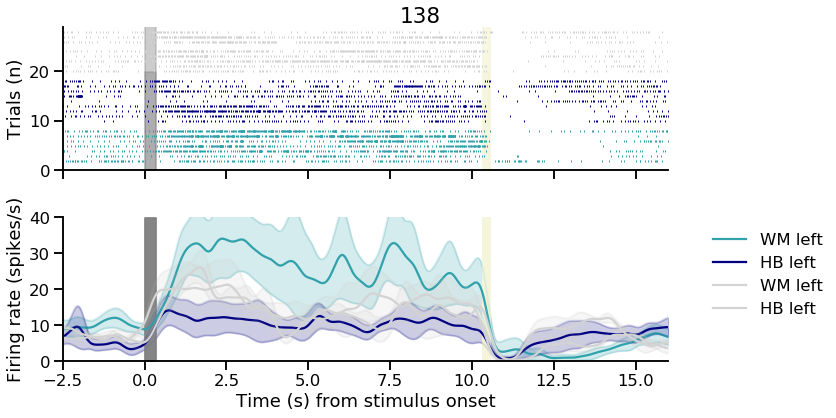

In [30]:
delay = 10

colors = [COLORRIGHT,COLORLEFT]
# colors = ['darkgreen','crimson']
labels = ['Right stimulus','Left stimulus']
# labels = ['Correct','Incorrect']

align = 'Stimulus_ON'

# temp_df = df.loc[(df.hit ==1)&(df.cluster_id == 138)]
temp_df = df.loc[(df.cluster_id == 138)]
temp_df['state'] = np.where(temp_df['WM_roll'] > 0.6, 1, 0)

with PdfPages(path +  filename[:-4]+'_population.pdf') as pdf:
    for cluster_id in temp_df.cluster_id.unique():
        print(cluster_id)
        fig, ax = plt.subplots(2,sharex=True,figsize=(12,6))
        j=1
        # j = convolveandplot(temp_df.loc[temp_df.vector_answer == 1], ax, variable='state', cluster_id = cluster_id, delay = delay, j=j,
        #                    labels=['WM right','HB right'], colors=[COLORRIGHT, 'red'])

        j = convolveandplot(temp_df.loc[(temp_df.vector_answer == 0)&(temp_df.hit == 1)], ax, variable='state', cluster_id = cluster_id, delay = delay, j=j,
                           labels=['WM left','HB left'], colors=[COLORLEFT, 'navy'])    
 
        j = convolveandplot(temp_df.loc[(temp_df.vector_answer == 0)&(temp_df.hit == 0)], ax, variable='state', cluster_id = cluster_id, delay = delay, j=j,
                           labels=['WM left','HB left'], colors=['lightgrey', 'lightgrey']) 
        sns.despine()
        plt.suptitle(cluster_id)
        plt.tight_layout()
        pdf.savefig(fig, transparent=True)
        plt.show()

In [31]:
save_path = 'C:/Users/Tiffany/Google Drive/WORKING_MEMORY/PAPER/Figures/'
os.chdir(save_path)
file_name = 'WMvsHB_example_138'
df.loc[df.cluster_id == 138].to_csv(file_name+'.csv')

#### **Several neurons**

In [7]:
path = 'C:/Users/Tiffany/Documents/Ephys/summary_complete/'
# path = 'G:/Mi unidad/WORKING_MEMORY/PAPER/ANALYSIS_figures/'

# df = pd.read_csv(path + '/E20_2022-02-14_16-01-30.csv', sep=',',index_col=0) # 204, 153
# df = pd.read_csv(path + '/E20_2022-02-13_15-10-51.csv', sep=',',index_col=0) # 81
# df = pd.read_csv(path + '/E20_2022-02-27_17-02-17.csv', sep=',',index_col=0) # 9
# df = pd.read_csv(path + '/E20_2022-03-01_16-11-01.csv', sep=',',index_col=0) # 90, 95

# df = pd.read_csv(path + '/E14_2021-04-02_12-53-42.csv', sep=',',index_col=0) # 361, 453
# df = pd.read_csv(path + '/E14_2021-03-29_13-01-12.csv', sep=',',index_col=0) # 190, 226 

# df = pd.read_csv(path + '/E17_2022-02-01_17-02-16.csv', sep=',',index_col=0) # 304
# df = pd.read_csv(path + '/E17_2022-02-02_17-13-06.csv', sep=',',index_col=0) #282, 285, 288, 233, 319, 304, 265, 303

# df = pd.read_csv(path + '/E22_2022-01-13_16-34-24.csv', sep=',',index_col=0) # 381, 138, 314, 133
df = pd.read_csv(path + '/E22_2022-01-14_16-50-37.csv', sep=',',index_col=0) # 56, 22, 44
# df = pd.read_csv(path + '/E22_2022-01-15_16-53-52.csv', sep=',',index_col=0) # 76, 191, 

# df = pd.read_csv(path + '/E13_2021-05-26_15-01-42.csv' # 164, 412, 244

In [ ]:
############################################# Add time before the fixation ##########################################

# Create a DataFrame only with info for the session
trials = df.groupby(['trial']).mean()
trials = trials[['START','END','Delay_ON','Delay_OFF', 'Stimulus_ON', 'Response_ON', 'Lick_ON', 'Motor_OUT','new_trial',
       'vector_answer', 'reward_side', 'hit', 'delay','total_trials', 'T', 'previous_vector_answer', 'previous_reward_side','repeat_choice',
        'WM_roll', 'RL_roll', 'WM', 'RL']]
trials = trials.reset_index()

# Make an aligment to END column
df['a_END'] = df['fixed_times'] - df['END']

# Create a new DataFrame with all spikes
try:
    # Some sessions include the group column that indicates the type of cluste,r other don't
    spikes = df[['trial','fixed_times','a_END','cluster_id', 'group']]
except:
    spikes = df[['trial','fixed_times','a_END','cluster_id']]
    
# Locate spikes that happen 2s prior to end of trial and copy them changing the new_trial index
duplicate_spikes = spikes.loc[spikes.a_END >-2]
duplicate_spikes['trial'] +=1 

# Add the duplicates
spikes = pd.concat([spikes, duplicate_spikes])

# Merge trial data with spikes on trial idnex
df = pd.DataFrame()
df = pd.merge(trials, spikes, on=["trial"])

# Create the columns for start and end and change trial to new trial index ( without taking the misses into account)
# df['trial_start'] = min(df.new_trial)
# df['trial_end'] = max(df.new_trial)
# df = df.drop(columns=['trial'])
# df = df.rename(columns={'new_trial' : 'trial'})

# This in case we don't do this and want to preserve the orginal trial indexes. 
df['trial_start'] = min(df.trial)
df['trial_end'] = max(df.trial)

# Crate the aligment that ew will need for the analysis. 
df['a_Stimulus_ON'] =  df['fixed_times'] - df['Stimulus_ON']
df['a_Lick_ON'] =  df['fixed_times'] - df['Lick_ON']
df['a_Delay_OFF'] =  df['fixed_times'] - df['Delay_OFF']
df['a_Motor_OUT'] =  df['fixed_times'] - df['Motor_OUT']
df['a_Response_ON'] =  df['fixed_times'] - df['Response_ON']
df['START_adjusted'] =  df['START'] - 2.1

#######################################################################################################################

for cluster_id in df.cluster_id.unique():
    print(cluster_id)
    delay = 10
    N=cluster_id

    align = 'Stimulus_ON'
    cue_on=0
    cue_off=0.4
    start=-2.5
    stop= 6 + delay

    neuron = new_convolve(df.loc[df.cluster_id==cluster_id], df)
    neuron = neuron.loc[neuron.hit == 1]
    # neuron = neuron.loc[neuron.delay != 0.1] # Remove trials with no delay if the studied segment is that one. 

    # Align the data to the targeted align
    neuron['time_centered'] = neuron['times'] - neuron[align] 
    neuron['time_centered'] = np.round(neuron.time_centered/1000, 2) #### estos es importante!!
    neuron['firing_'] = neuron['firing']*1000
    
    df_results = pd.DataFrame(dtype=float)
    df_results['firing'] = neuron.loc[(neuron.time_centered <= stop)&(neuron.delay == delay)].groupby(['time_centered','reward_side'])['firing_'].mean()
    df_results['error'] = neuron.loc[(neuron.time_centered <= stop)&(neuron.delay == delay)].groupby(['time_centered','reward_side'])['firing_'].std()
    df_results.reset_index(inplace=True)

    fig, ax = plt.subplots(2,sharex=True,figsize=(12,6))

    for condition,color,name in zip([1,0],[COLORRIGHT,COLORLEFT],['Right stimulus','Left stimulus']):
        y_mean= df_results[df_results.reward_side==condition].firing
        error = 0.5*df_results[df_results.reward_side==condition].error
        lower = y_mean - error
        upper = y_mean + error
        x=df_results[df_results.reward_side==condition].time_centered

        ax[1].plot(x, y_mean, label=name,color=color)
        ax[1].plot(x, lower, color=color, alpha=0.1)
        ax[1].plot(x, upper, color=color, alpha=0.1)
        ax[1].fill_between(x, lower, upper, alpha=0.2, color=color)

        ax[1].set_xlim(start,stop)  
        ax[1].set_ylim(0,60)  
        ax[1].set_xlabel('Time (s) from response onset')
        y = np.arange(0,60,0.1)     
        ax[1].fill_betweenx(y, cue_on,cue_off, color='grey', alpha=.4)  
        ax[1].fill_betweenx(y, cue_off+delay,cue_off+delay+.2, color='beige', alpha=.6)

        SpikesRight = (df.loc[(df.reward_side == 1)&(df.cluster_id == N)&(df.delay == delay)])
        SpikesLeft = (df.loc[(df.reward_side == 0)&(df.cluster_id == N)&(df.delay == delay)])

        SpikesRight['a_'+align] = SpikesRight['fixed_times'] - SpikesRight['Stimulus_ON'] 
        SpikesLeft['a_'+align] = SpikesLeft['fixed_times'] - SpikesLeft['Stimulus_ON'] 

        trial=1
        j=1
        spikes = []
        trial_repeat = []
        for i in range(len(SpikesRight)):
            # Plot for licks for left trials
            if SpikesRight.trial.iloc[i] != trial:
                ax[0].plot(spikes,trial_repeat, '|', markersize=2, color=COLORRIGHT, zorder=1)
                spikes = []
                trial_repeat = []
                trial = SpikesRight.trial.iloc[i]
                j+=1
            if SpikesRight['a_'+align].iloc[i] > start and SpikesRight['a_'+align].iloc[i] < stop:
                spikes.append(SpikesRight['a_'+align].iloc[i])
                trial_repeat.append(j)
            else:
                continue

        trial=1
        spikes = []
        trial_repeat = []
        for i in range(len(SpikesLeft)):
            # Plot for licks for left trials
            if SpikesLeft.trial.iloc[i] != trial:
                ax[0].plot(spikes,trial_repeat, '|', markersize=2, color=COLORLEFT, zorder=1)
                spikes = []
                trial_repeat = []
                trial = SpikesLeft.trial.iloc[i]
                j+=1
            if SpikesLeft['a_'+align].iloc[i] > start and SpikesLeft['a_'+align].iloc[i] < stop:
                spikes.append(SpikesLeft['a_'+align].iloc[i])
                trial_repeat.append(j)
            else:
                continue

        ax[0].set_ylabel('Trials (n)')
        ax[0].set_ylim(0,j)

        y = np.arange(0,j+1,0.1)
        ax[0].fill_betweenx(y, cue_on,cue_off, color='grey', alpha=.4)
        ax[0].fill_betweenx(y, cue_off+delay,cue_off+delay+.2, color='beige', alpha=.8)

        every_nth = 1
        for n, label in enumerate(ax[1].yaxis.get_ticklabels()):
            if n % every_nth != 0:
                label.set_visible(False)
        for n, label in enumerate(ax[0].yaxis.get_ticklabels()):
            if n % every_nth != 0:
                label.set_visible(False)     

        sns.despine()

        # axis labels and legend
        ax[1].legend(frameon=False, bbox_to_anchor=(1.05, 1))    
        ax[1].set_xlabel('Time (s) from stimulus onset')
        ax[1].set_ylabel('Firing rate (spikes/s)')

    plt.show()

#### **Training weights progression**

In [10]:
file_name = 'weights for the modelling_alldelays_V5'
df_weights = pd.read_csv(file_name+'.csv', index_col=0)

FileNotFoundError: [WinError 3] El sistema no puede encontrar la ruta especificada: 'C:/Users/Tiffany/Google Drive/WORKING_MEMORY/PAPER/ANALYSIS_Figures/'

In [33]:
df_weights.reset_index(inplace=True)
df_weights.drop(columns=['index'], inplace=True)

In [ ]:
sns.jointplot(x='Stimulus_ON-0-0.1', y='Stimulus_ON-0.5-1', data=df_weights, kind='kde')
sns.jointplot(x='Delay_OFF--0.5-0', y='Stimulus_ON-0.5-1', data=df_weights, kind='kde')
sns.jointplot(x='Delay_OFF--0.5-0', y='Lick_ON--0.25-0.5', data=df_weights, kind='kde')

plt.tight_layout()
sns.despine()

In [6]:
response = 'Delay_OFF--0.25-0'
early = 'Stimulus_ON-0.5-0.75'
late = 'Delay_OFF-0.25-0.5'
stim = 'Stimulus_ON-0-0.1'

In [ ]:
df_w = df_weights.loc[df_weights.session == 'E22_2022-01-15_16-53-52.csv']

fig, ax = plt.subplots(1,3,sharex=True,figsize=(14,4))
sns.scatterplot(x=stim, y=early, data=df_w, ax=ax[0], alpha=0.5)
sns.regplot(x=stim, y=early, data=df_w, ax=ax[0], marker='')

ax[0].set_xlabel('Stimulus')
ax[0].set_ylabel('Early Delay')
ax[0].plot([-3,3], [-3,3], ls="--", c=".5")

sns.scatterplot(x=late, y=early, data=df_w, ax=ax[1], alpha=0.5)
sns.regplot(x=late, y=early, data=df_w, ax=ax[1], marker='')

ax[1].set_xlabel('Late Delay')
ax[1].set_ylabel('Early Delay')
ax[1].plot([-3,3], [-3,3], ls="--", c=".5")

sns.scatterplot(x=late, y=response, data=df_w, ax=ax[2], alpha=0.5)
sns.regplot(x=late, y=response, data=df_w, ax=ax[2], marker='')
ax[2].set_xlabel('Late delay')
ax[2].set_ylabel('Response')
ax[2].set_ylabel('Response')
ax[2].plot([-3,3], [-3,3], ls="--", c=".5")

plt.tight_layout()
sns.despine()

In [8]:
save_path = 'C:/Users/Tiffany/Google Drive/WORKING_MEMORY/PAPER/ANALYSIS_Figures/'
os.chdir(save_path)
# file_name = 'weights for the modelling_Lick'
file_name = 'weights for the modelling_alldelays_V4'
df_weights = pd.read_csv(file_name+'.csv', index_col=0)

FileNotFoundError: [WinError 3] El sistema no puede encontrar la ruta especificada: 'C:/Users/Tiffany/Google Drive/WORKING_MEMORY/PAPER/ANALYSIS_Figures/'

In [47]:
late = 'Delay_OFF--0.25-0'
early = 'Stimulus_ON-0.5-0.75'
response = 'Lick_ON-0.0-0.25'
stim = 'Stimulus_ON-0-0.1'

df_weights['|Late Delay|']  = np.sqrt(df_weights[late]**2)
df_weights['|Stim|']  = np.sqrt(df_weights[stim]**2)
df_weights['|Early Delay|'] = np.sqrt(df_weights[early]**2)
df_weights['|Response|']  = np.sqrt(df_weights[response]**2)

# Calculate upper part of the denominator
df_weights['Stim x Early Delay'] = df_weights[stim] * df_weights[early] 
# Create a new column with the results
df_weights['|Stim x Early Delay|'] = df_weights['|Early Delay|'] * df_weights['|Stim|']
# --------------------------------------------------------------------------------

# Calculate upper part of the denominator
df_weights['Stim x Late Delay'] = df_weights[stim] * df_weights[late] 
# Create a new column with the results
df_weights['|Stim x Late Delay|'] = df_weights['|Late Delay|'] * df_weights['|Stim|']
# --------------------------------------------------------------------------------

# Calculate upper part of the denominator
df_weights['Early x Late Delay'] = df_weights[early] * df_weights[late] 
# Create a new column with the results
df_weights['|Early x Late Delay|'] = df_weights['|Early Delay|'] * df_weights['|Late Delay|']
# --------------------------------------------------------------------------------

# Calculate upper part of the denominator
df_weights['Early Delay x Response'] = df_weights[early] * df_weights[response] 
# Create a new column with the results
df_weights['|Early Delay x Response|'] = df_weights['|Early Delay|'] * df_weights['|Response|']
# --------------------------------------------------------------------------------

# Calculate upper part of the denominator
df_weights['Late Delay x Response'] = df_weights[late] * df_weights[response] 
# Create a new column with the results
df_weights['|Late Delay x Response|'] = df_weights['|Late Delay|'] * df_weights['|Response|']

In [48]:
df_temp = pd.DataFrame()
for upper, lower in zip(['Stim x Late Delay','Early x Late Delay','Late Delay x Response','Early Delay x Response'],
                        ['|Stim x Late Delay|','|Early x Late Delay|','|Late Delay x Response|','|Early Delay x Response|','Early Delay x Response']):
    df_results = pd.DataFrame()
    df_results['vector'] = df_weights.groupby('session')[upper].sum() / df_weights.groupby('session')[lower].sum()
    df_results['condition'] = upper
    df_results.reset_index(inplace=True)
    df_temp = pd.concat([df_results, df_temp])

In [66]:
file_name = 'parsed_weights for the modelling_V2'
df_temp.to_csv(file_name+'.csv')

In [51]:
file_name = 'parsed_weights for the modelling'
df_temp = pd.read_csv(file_name+'.csv')

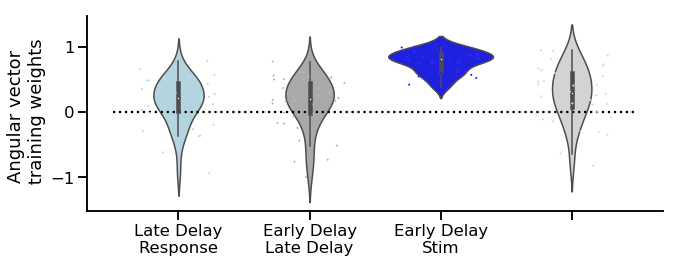

In [52]:
fig, panel = plt.subplots(1,1,sharex=True,figsize=(10,4))
color_list = ['lightblue','darkgrey', 'blue','lightgrey','grey']

sns.stripplot(x='condition',y='vector', data=df_temp, jitter=0.3,size=2, palette = color_list, edgecolor='white', ax=panel, linewidth=0.1)
# sns.violinplot(x='model',y='norm', data=full_fit, saturation=0.7, order=['all','9','10','11','12'], palette = color_list,linewidth=0, ax=panel)
sns.violinplot(x='condition',y='vector', data=df_temp, legend=False, palette = color_list,ax=panel,linewidth=1.5)

panel.hlines(y=0., xmin=-0.5, xmax=3.5, linestyle=':')
panel.set_xlabel('')
panel.set_xticklabels(['Late Delay\nResponse','Early Delay\nLate Delay','Early Delay\nStim'])
panel.set_ylabel('Angular vector \n training weights')
plt.tight_layout()
sns.despine()

In [64]:
df_temp = df_temp.loc[df_temp.session != 'E20_2022-02-12_15-23-55.csv']

In [14]:
formula = 'vector ~ condition'
from statsmodels.formula.api import ols

model = ols(formula, data=df_temp).fit()
anova_table = sm.stats.anova_lm(model)

In [ ]:
smf.mixedlm("vector ~ condition - 1", data = df_temp, groups='session').fit().summary()

In [50]:
t_stat, p_val = stats.ttest_1samp(df_temp.loc[df_temp.condition =='Stim x Late Delay']['vector'], 0)
print(t_stat, p_val)

4.279409495387282 0.00011772216103008191


In [ ]:
fig, ax = plt.subplots(1,3,sharex=True,figsize=(14,4))
sns.scatterplot(x='Stimulus_ON-0-0.3', y='Stimulus_ON-0.5-1', data=df_weights, ax=ax[0],alpha=0.5)
sns.regplot(x='Stimulus_ON-0-0.3', y='Stimulus_ON-0.5-1', data=df_weights, ax=ax[0], marker='')

ax[0].set_xlabel('Stimulus')
ax[0].set_ylabel('Early Delay')
ax[0].plot([-2,2], [-2,2], ls="--", c=".3")

sns.scatterplot(x='Delay_OFF--0.5-0', y='Stimulus_ON-0.5-1', data=df_weights, ax=ax[1],alpha=0.5)
sns.regplot(x='Delay_OFF--0.5-0', y='Stimulus_ON-0.5-1', data=df_weights, ax=ax[1], marker='')

ax[1].set_xlabel('Late Delay')
ax[1].set_ylabel('Early Delay')
ax[1].plot([-2,2], [-2,2], ls="--", c=".3")

sns.scatterplot(x='Delay_OFF--0.5-0', y='Lick_ON--0.1-0.4', data=df_weights, ax=ax[2],alpha=0.5)
sns.regplot(x='Delay_OFF--0.5-0', y='Lick_ON--0.1-0.4', data=df_weights, ax=ax[2], marker='')
ax[2].set_xlabel('Late delay')
ax[2].set_ylabel('Response')
ax[2].set_ylabel('Response')
ax[2].plot([-2,2], [-2,2], ls="--", c=".3")

plt.tight_layout()
sns.despine()

#### **Delay specific training for WM incorrect**

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(14,4))

y_lower = 0
y_upper=0

colors=['crimson','darkgreen']
variables = ['WM_roll','WM_roll']
hits = [0,1]
ratios = [0.65,0.65]
variables_combined=[variables[0]+'_'+str(hits[0]),variables[1]+'_'+str(hits[1])]

save_path = 'C:/Users/Tiffany/Google Drive/WORKING_MEMORY/PAPER/Figures/'
os.chdir(save_path)
# file_name = 'single_delay_WM_roll0.65_0.5_4'
file_name = 'single_delay_WM_roll0.6_0.5_2_folded3'
df_cum_sti = pd.read_csv(file_name+'.csv', index_col=0)

# delays = [0.1,1,3,10]
scores = df_cum_sti.groupby('session').score.mean().reset_index()
list_exclude = scores.loc[scores.score<0.6].session.unique()
df_cum_sti = df_cum_sti[~df_cum_sti['session'].isin(list_exclude)] 

delays = [10]
panel=ax
for delay in delays:
                
    for color, variable in zip(colors,variables_combined):
        print(variable)

        # Aligmnent for Stimulus cue
        real = np.array(df_cum_sti.loc[(df_cum_sti['trial_type'] == variable)&(df_cum_sti['delay'] == delay)].drop(columns=['trial_type', 'delay','score','session','fold']).mean(axis=0))
        times = df_cum_sti.loc[(df_cum_sti['trial_type'] == variable)&(df_cum_sti['delay'] == delay)]
        times = np.array(times.drop(columns=['trial_type', 'delay','score','session','fold'],axis = 1).columns.astype(float))

        df_lower = pd.DataFrame()
        df_upper = pd.DataFrame()

        for timepoint in times:
            mean_surr = []

            # recover the values for that specific timepoint
            try:
                array = df_cum_sti.loc[(df_cum_sti.trial_type ==variable)&(df_cum_sti['delay'] == delay)].drop(columns='delay').groupby('session').mean()[str(timepoint)].to_numpy()
            except:
                array = df_cum_sti.loc[(df_cum_sti.trial_type ==variable)&(df_cum_sti['delay'] == delay)].drop(columns='delay').groupby('session').mean()[timepoint].to_numpy()

            # iterate several times with resampling: chose X time among the same list of values
            for iteration in range(1000):
    
                x = np.random.choice(array, size=len(array), replace=True)
                # recover the mean of that new distribution
                mean_surr.append(np.mean(x))

            df_lower.at[0,timepoint] = np.percentile(mean_surr, 2.5)
            df_upper.at[0,timepoint] = np.percentile(mean_surr, 97.5)

        lower =  df_lower.iloc[0].values
        upper =  df_upper.iloc[0].values
        x=times

        panel.plot(times,real, color=color)
        panel.plot(x, lower, color=color, linestyle = '',alpha=0.6)
        panel.plot(x, upper, color=color, linestyle = '',alpha=0.6)
        panel.fill_between(x, lower, upper, alpha=0.2, color=color)
        if max(upper)>y_upper:
            y_upper = max(upper)
        if  min(lower)<y_lower:
            y_lower = min(lower)
        panel.set_ylim(y_lower-0.1,y_upper+0.1)
        panel.axhline(y=0.0,linestyle=':',color='black')
        panel.fill_betweenx(np.arange(-1,1.15,0.1), 0,0.4, color='grey', alpha=.4)
        panel.fill_betweenx(np.arange(-1.1,1.1,0.1), delay+0.4,delay+0.6, color='beige', alpha=.8)
        if color=='crimson':
            panel.set_xlabel('Time (s) to Go')